In [1]:
!nvidia-smi

Fri Apr 25 22:26:17 2025       
+-----------------------------------------------------------------------------------------+
| NVIDIA-SMI 550.67                 Driver Version: 550.67         CUDA Version: 12.4     |
|-----------------------------------------+------------------------+----------------------+
| GPU  Name                 Persistence-M | Bus-Id          Disp.A | Volatile Uncorr. ECC |
| Fan  Temp   Perf          Pwr:Usage/Cap |           Memory-Usage | GPU-Util  Compute M. |
|                                         |                        |               MIG M. |
|=========================================+========================+======================|
|   0  NVIDIA RTX A6000               Off |   00000000:3B:00.0 Off |                  Off |
| 30%   39C    P5             86W /  300W |      29MiB /  49140MiB |      0%      Default |
|                                         |                        |                  N/A |
+-----------------------------------------+-----

In [4]:
import os, sys
# os.environ["XLA_PYTHON_CLIENT_PREALLOCATE"] = "false" # Disable jax preallocation for memory debugging only
os.environ['CUDA_VISIBLE_DEVICES'] = '0'

import numpy as np
import xarray as xr
import jax
import jax.numpy as jnp
import matplotlib.pyplot as plt
from gofish import imagecube
from ruamel.yaml import YAML
from pathlib import Path
from tqdm.notebook import tqdm
from mpl_toolkits.axes_grid1 import make_axes_locatable
from collections import OrderedDict
import tensorboardX
from flax.training import checkpoints

sys.path.insert(0, '../')
import visualization, sensor, grid, line_rte
import parametric_disk_old as parametric_disk
from network import shard
import network
from consts import *
import emcee
from functools import partial
import time
import visibilities_utils as vis_utils

def print_array_size_GB(array):
    num_bytes = array.size * array.dtype.itemsize
    print(f"{num_bytes / (1024**3):.4f} GB")
    
def pad_image_cube(cube, target_size=2048):
    nchan, npix, _ = cube.shape
    if npix > target_size:
        raise ValueError("Cube's dimensions are larger than target size; consider cropping instead.")
    
    pad_total = target_size - npix
    pad_before = pad_total // 2
    pad_after = pad_total - pad_before

    padded_cube = jnp.pad(cube, 
                          pad_width=((0, 0), (pad_before, pad_after), (pad_before, pad_after)),
                          mode='constant',
                          constant_values=0)
    return padded_cube

def render_cube_pinhole(ray_coords, pixel_area, disk_params, nd_co, temperature, velocity_az, bbox, freqs, nu0, obs_dir, molecular_table):
    ray_coords_sph = grid.cartesian_to_spherical(ray_coords)
    ray_coords_polar = grid.spherical_to_zr(ray_coords_sph)

    # Interpolate dataset along the ray coordinates
    gas_nd = grid.interpolate_scalar(nd_co, ray_coords_polar, bbox)
    gas_t  = grid.interpolate_scalar(temperature, ray_coords_polar, bbox, cval=1e-10)
    gas_v_az = grid.interpolate_scalar(velocity_az, ray_coords_polar, bbox)
    gas_v = parametric_disk.azimuthal_velocity(ray_coords, gas_v_az)

    # Load molecular data from disk_params
    energy_levels, radiative_transitions = line_rte.load_molecular_tables(path=molecular_table)
    _, a_ud, b_ud, b_du = line_rte.einstein_coefficients(
        energy_levels, radiative_transitions, transition=disk_params['transition']
    )
    n_up, n_dn = line_rte.n_up_down(
        gas_nd, gas_t, energy_levels, radiative_transitions, transition=disk_params['transition']
    )
    alpha_tot = line_rte.alpha_total_co(disk_params['v_turb'], gas_t)

    print(f'computing pinhole spectral cube for a total of {freqs.size} frequencies')
    images = line_rte.compute_spectral_cube_pmap(
        shard(freqs), gas_v, alpha_tot, n_up, n_dn,
        a_ud, b_ud, b_du, ray_coords, obs_dir, nu0, pixel_area
    )
    images = np.nan_to_num(images).reshape(freqs.size, *ray_coords.shape[:2])
    return images

In [5]:
def render_cube(ray_coords, pixel_area, disk, nd_co, temperature, velocity_az, bbox, freqs, nu0):
    ray_coords_sph = grid.cartesian_to_spherical(ray_coords)
    ray_coords_polar = grid.spherical_to_zr(ray_coords_sph)
    
    # Interpolate dataset along the ray coordinates
    gas_nd = grid.interpolate_scalar(nd_co, ray_coords_polar, bbox)
    gas_t  = grid.interpolate_scalar(temperature, ray_coords_polar, bbox, cval=1e-10)
    gas_v_az = grid.interpolate_scalar(velocity_az, ray_coords_polar, bbox)
    gas_v = parametric_disk.azimuthal_velocity(ray_coords, gas_v_az)
    
    # Einstein coefficient for spontaneous emission from level u to level d
    energy_levels, radiative_transitions = line_rte.load_molecular_tables(path=disk.molecule_table)
    _, a_ud, b_ud, b_du = line_rte.einstein_coefficients(energy_levels, radiative_transitions, transition=disk.transition)
    n_up, n_dn = line_rte.n_up_down(gas_nd, gas_t, energy_levels, radiative_transitions, transition=disk.transition)

    alpha_tot = line_rte.alpha_total_co(disk.v_turb, gas_t)

    # print('computing spectral cube for a total of {} frequencies'.format(freqs.size))
    images = line_rte.compute_spectral_cube_pmap(shard(freqs), gas_v, alpha_tot, n_up, n_dn, a_ud, b_ud, b_du, ray_coords, obs_dir, nu0, pixel_area)
    images = np.nan_to_num(images).reshape(freqs.size, *ray_coords.shape[:2])
    return images

def intensity_to_nchw(intensity, vmin=None, vmax=None, cmap='viridis', gamma=0.5):
    cm = plt.get_cmap(cmap)
    if vmin is None: vmin = np.min(intensity)
    if vmax is None: vmax = np.max(intensity)
    norm_images = np.flip(( (intensity - vmin) / (vmax - vmin) )**gamma, axis=-2)
    if intensity.ndim == 2:
        nchw_images = np.moveaxis(cm(norm_images)[...,:3], (0, 1, 2), (1, 2, 0))
    elif intensity.ndim == 3:
        nchw_images = np.moveaxis(cm(norm_images)[...,:3], (0, 1, 2, 3), (0, 2, 3, 1))
    return nchw_images

In [6]:
fov_as = 10.0                 # arcsecs
velocity_range = (2000, 10000) # m/s

data_path = '/scratch/ondemand28/len/data/radjax/MAPS/HD_163296_CO_220GHz.0.2arcsec.image.fits'
vlsr = 5760   # m/s
isotop_abundance = 1

# data_path = '../data/alma_highres/HD163296_13CO_beam0.20_100ms_3sigma.clean.image.cutout.fits'
# vlsr = 5770   # m/s
# isotop_abundance = 1/69
# 
# data_path = '../data/alma_highres/HD163296_C18O_beam0.20_100ms_3sigma.clean.image.cutout.fits'
# vlsr = 5750   # m/s
# isotop_abundance = 1/557

data_cube = imagecube(data_path, FOV=fov_as, velocity_range=velocity_range)
freqs = data_cube.velocity_to_restframe_frequency(vlsr=vlsr)
velocities = data_cube.velax
data = data_cube.data
x_sky, y_sky = np.meshgrid(data_cube.xaxis, data_cube.yaxis, indexing='xy')
nu0 = data_cube.nu0
npix = data_cube.nxpix
width_kms = (velocities[-1] - velocities[0]) / 1000.0
delta_v_ms = velocities[1] - velocities[0]
num_freqs = len(freqs)
data_dir = Path(data_path).parent
print('velocity resolution: {} m/s'.format(delta_v_ms))

sigma_obs = 0.0073

beam = data_cube.beams_per_pix * sensor.beam(data_cube.dpix, data_cube.bmaj, data_cube.bmin, data_cube.bpa)

velocity resolution: 199.99999998061412 m/s


2025-04-25 09:42:24.335684: W external/xla/xla/service/gpu/nvptx_compiler.cc:930] The NVIDIA driver's CUDA version is 12.4 which is older than the PTX compiler version 12.6.77. Because the driver is older than the PTX compiler version, XLA is disabling parallel compilation, which may slow down compilation. You should update your NVIDIA driver or use the NVIDIA-provided CUDA forward compatibility packages.


In [7]:

## Visbilities MCMC params
disk = parametric_disk.DiskFlaherty(
    name='HD163296_CO(2-1)',
    T_mid1=18.8216,
    T_atm1=63.5251,
    q=-0.2474,
    q_in=-0.5563,
    r_break=78.5606,
    r_in=11.1852,
    log_r_c=2.2229,
    v_turb=0.6528,
    gamma=1.0,
    M_star=2.3 * M_sun,
    M_gas=0.09 * M_sun,
    co_abundance=1e-4 * isotop_abundance,
    N_dissoc=0.79 * 1.59e21,
    N_desorp=-np.inf,
    freezeout=19.0,
    r_scale=150.0,
    z_q0=70.0,
    delta=1,
    transition=2,
    m_mol=2.37 * m_h,
    molecule_table='../molecular_tables/molecule_12c16o.inp',
)

resolution = 500
z_min, z_max = 0, 200
r_min, r_max = disk.r_in, 800
z_disk, r_disk = jnp.meshgrid(jnp.linspace(z_min, z_max, resolution), jnp.linspace(r_min, r_max, resolution), indexing='ij')

temperature = disk.temperature_profile(z_disk, r_disk)
nd_h2 = parametric_disk.number_density_profile(z_disk, r_disk, temperature, disk.gamma, disk.r_in, 10**disk.log_r_c, disk.M_gas, disk.M_star, disk.m_mol)
velocity_az = disk.velocity(z_disk, r_disk, nd_h2, temperature)

# Compute the column integrated density N(h2) (units of 1/cm^2)
N_h2 = parametric_disk.surface_density(z_disk, nd_h2)
sigma_h2 = N_h2 * m_h

# Compute the relative abundance of co
abundance_co = disk.co_abundance_profile(N_h2, temperature)
nd_co = abundance_co * nd_h2

In [8]:
projection = sensor.PinholeProjection(
    name=disk.name,
    x_sky=x_sky,
    y_sky=y_sky,
    distance=122.0, 
    nray=100,
    incl=47.5,
    phi=0.0,
    posang=312.0,
    z_width=2*z_max,
    freqs=freqs
)
# Bounding box for interpolations
bbox_disk = jnp.array([(au*z_min, au*z_max), (au*r_min, au*r_max)])

fov_rad =  fov_as*arcsec                                # field of view 
fov = 2 * projection.distance*pc * np.tan(fov_rad/2.0)  # gives ~1708 [au] for 14as
pixel_area = (fov/npix)**2
ray_coords, obs_dir = sensor.pinhole_disk_projection(
    projection.x_sky, projection.y_sky, projection.distance, projection.nray, 
    projection.incl, projection.phi, projection.posang, projection.z_width
)

# Render spectral cube and convolve with gaussian beam
images = render_cube(ray_coords, pixel_area, disk, nd_co, temperature, -velocity_az, bbox_disk, freqs, nu0)
images_blurred = sensor.fftconvolve_vmap(images, beam)

# Add spectral blurring?
# images_spectral_blur = signal.convolve(images, hann, mode='same') / np.sum(hann)
# images_blurred = sensor.fftconvolve_vmap(images_spectral_blur, beam)

<IPython.core.display.Javascript object>


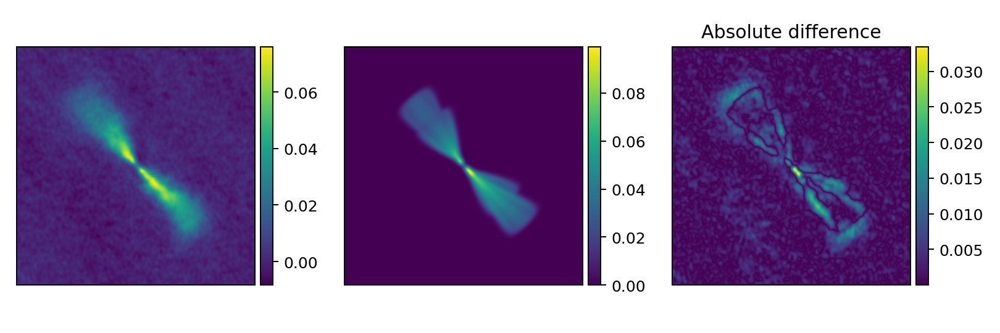

interactive(children=(IntSlider(value=19, description='frame', max=39), Output()), _dom_classes=('widget-inter…

In [7]:
%matplotlib notebook
visualization.slider_frame_comparison(data, images_blurred)

<IPython.core.display.Javascript object>


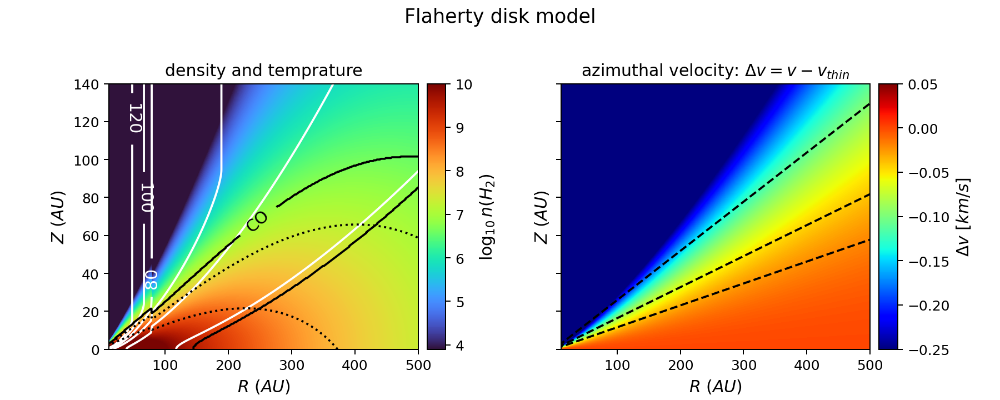

In [8]:
fig, axes = plt.subplots(1,2, figsize=(10,4), sharey=True)
im = axes[0].imshow(np.log10(nd_h2), origin='lower', cmap='turbo', extent=[r_disk.min(), r_disk.max(), z_disk.min(), z_disk.max()], vmin=3.9, vmax=10, aspect=3);

divider = make_axes_locatable(axes[0])
cax = divider.append_axes('right', size='2%', pad=-3.)
cbar = fig.colorbar(im, cax=cax)
cbar.set_label(r'$\log_{10} n(H_2)$', fontsize=12)

levels = [20, 40, 60, 80, 100, 120]
cp = axes[0].contour(r_disk, z_disk, temperature, levels, colors='white')
axes[0].clabel(cp, levels, inline=1, fontsize=12);
cp = axes[0].contour(r_disk, z_disk, abundance_co, levels=[disk.co_abundance/2], colors='black')
axes[0].clabel(cp, levels=[disk.co_abundance/2], fmt='CO', inline=1, fontsize=12);
cp = axes[0].contour(r_disk, z_disk, sigma_h2, levels=[0.01, 0.1], colors='black', linestyles='dotted')


# Plot azimuthal velocity 
v_thin = np.sqrt(parametric_disk.vsq_keplerian_thin_disk(r_disk, disk.M_star))
delta_v = (velocity_az-v_thin)
im = axes[1].imshow(1e-5*delta_v, cmap='jet', vmin=-0.25, vmax=0.05, origin='lower', extent=[r_disk.min(), r_disk.max(), z_disk.min(), z_disk.max()], aspect=3)
divider = make_axes_locatable(axes[1])
cax = divider.append_axes('right', size='2%', pad=-3.)
cbar = fig.colorbar(im, cax=cax)
cbar.set_label(r'$\Delta v~[km/s]$', fontsize=12)
cp = axes[1].contour(r_disk, z_disk, 100*delta_v/velocity_az, levels=[-5, -2, -1], colors='black')
plt.clabel(cp, [-5, -2, -1], inline=True, fontsize=12, fmt=lambda x:'{:.0f} %'.format(x));

for ax in axes:
    ax.set_xlabel(r'$R~(AU)$', fontsize=12)
    ax.set_ylabel(r'$Z~(AU)$', fontsize=12)
    ax.set_xlim(r_disk.min(),500)
    ax.set_ylim(0,140)

axes[0].set_title('density and temprature')
axes[1].set_title(r'azimuthal velocity: $\Delta v = v-v_{thin}$')
plt.suptitle('Flaherty disk model', fontsize=14, y=0.98);
plt.tight_layout()
fig.subplots_adjust(left=-0.2, wspace=-0.3)

In [9]:
data.shape

(40, 502, 502)

# Neural temperature recovery

In [9]:
from jax import jit
from functools import partial
import flax
from datetime import datetime
import grid

@jax.tree_util.register_pytree_node_class
class NeuralTemperatureDisk(object):
    def __init__(self, z_disk, r_disk, bbox, pixel_area, ray_coords, ray_coords_polar, obs_dir, beam, 
                 energy_levels, radiative_transitions, disk):
        self.z_disk = z_disk
        self.r_disk = r_disk
        self.coords = jnp.stack((z_disk, r_disk), axis=-1).reshape(-1,2)
        self.bbox = bbox
        self.pixel_area = pixel_area
        self.ray_coords = ray_coords
        self.ray_coords_polar = ray_coords_polar
        self.obs_dir = obs_dir
        self.beam = beam
        self.energy_levels = energy_levels
        self.radiative_transitions = radiative_transitions
        self.disk = disk
        self.nu0, self.a_ud, self.b_ud, self.b_du = line_rte.einstein_coefficients(energy_levels, radiative_transitions, transition=disk.transition)
        self.disk_shape = z_disk.shape

    @partial(jit, static_argnums=(0, 2))
    def image_prediction(self, params, temp_fn, freqs):
            disk = self.disk
            temperature = temp_fn({'params': params}, self.coords).reshape(self.disk_shape)
        
            nd_h2 = parametric_disk.number_density_profile(
                self.z_disk, self.r_disk, temperature, disk.gamma, disk.r_in, 10**disk.log_r_c, disk.M_gas, disk.M_star, disk.m_mol
            )
            velocity_az = -disk.velocity(self.z_disk, self.r_disk, nd_h2, temperature)
            
            # Compute the column integrated density N(h2) (units of 1/cm^2)
            N_h2 = parametric_disk.surface_density(self.z_disk, nd_h2)
            
            # Compute the relative abundance of co
            abundance_co = disk.co_abundance_profile(N_h2, temperature)
            nd_co = abundance_co * nd_h2
            
            # Interpolate dataset along the ray coordinates
            gas_nd = grid.interpolate_scalar(nd_co, self.ray_coords_polar, self.bbox)
            gas_t  = grid.interpolate_scalar(temperature, self.ray_coords_polar, self.bbox, cval=1e-10)
            gas_v_az = grid.interpolate_scalar(velocity_az, self.ray_coords_polar, self.bbox)
            gas_v = parametric_disk.azimuthal_velocity(self.ray_coords, gas_v_az)
            
            # Einstein coefficient for spontaneous emission from level u to level d
            n_up, n_dn = line_rte.n_up_down(gas_nd, gas_t, self.energy_levels, self.radiative_transitions, transition=disk.transition)
            alpha_tot = line_rte.alpha_total_co(disk.v_turb, gas_t)
        
            model = jnp.nan_to_num(line_rte.compute_spectral_cube(
                freqs, gas_v, alpha_tot, n_up, n_dn, self.a_ud, self.b_ud, self.b_du, self.ray_coords, self.obs_dir, self.nu0, self.pixel_area
            ))
            model = sensor.fftconvolve_vmap(model, self.beam)
            return model
    
    def tree_flatten(self):
        children = (self.z_disk, self.r_disk, self.bbox, self.pixel_area, self.ray_coords, 
                    self.ray_coords_polar, self.obs_dir, self.beam, self.energy_levels, 
                    self.radiative_transitions, self.disk)
        aux_data = {}
        return (children, aux_data)

    @classmethod
    def tree_unflatten(cls, aux_data, children):
        return cls(*children, **aux_data) 


@partial(jit, static_argnums=(4,5))
def loss_fn(params, data, freqs, sigma, image_fn, temp_fn):
    model = image_fn(params, temp_fn, freqs)
    loss = jnp.mean(( (data-model)/sigma )**2)
    return loss
    
@partial(jit, static_argnums=(0, 1))
def gradient_step(loss_fn, image_fn, state, data, freqs, sigma):
    loss, grads = jax.value_and_grad(loss_fn, argnums=(0))(state.params, data, freqs, sigma, image_fn, state.apply_fn)
    grads = jax.lax.pmean(grads, axis_name='batch')
    loss = jax.lax.pmean(loss, axis_name='batch')
    state = state.apply_gradients(grads=grads)
    return loss, state

hparams = dict(
    run_name = 'Len_MAPS_CO_VisMCMC_vlsr_{}ms.no_blur.iso_abundance_{}'.format(vlsr,isotop_abundance),
    datetime = datetime.now().strftime('%Y-%m-%d.%H:%M:%S'),
    disk_name = disk.name,
    num_iters = 60000,
    posenc_deg = 4,
    sigma = sigma_obs,        # 1 mJy is ~1% noise level (peak of 0.1Jy)
#     blur_scale=blur_scale,
    isotop_abundance=isotop_abundance,
    vlsr=vlsr,
    seed = 42,
    max_temp = 400.0,
    min_temp = 5.0,
    offset = 0.0,
    batchsize = 10 * jax.device_count(),
    z_max = z_max, 
    r_max = r_max
)


ray_coords_sph = grid.cartesian_to_spherical(ray_coords)
ray_coords_polar = grid.spherical_to_zr(ray_coords_sph)
energy_levels, radiative_transitions = line_rte.load_molecular_tables(path=disk.molecule_table)
energy_levels, radiative_transitions = jnp.array(energy_levels), jnp.array(radiative_transitions)
 
neural_temp = NeuralTemperatureDisk(
    z_disk, r_disk, bbox_disk, pixel_area, ray_coords, ray_coords_polar, obs_dir, 
    beam, energy_levels, radiative_transitions, disk, 
)
neural_temp.sigma = hparams['sigma'] 

predictor = network.PixelPredictor(
    scale=np.array([hparams['z_max'], hparams['r_max']]), posenc_deg=hparams['posenc_deg'], 
    min_val=hparams['min_temp'], max_val=hparams['max_temp'], offset=hparams['offset']
)
params = predictor.init_params(neural_temp.coords, seed=hparams['seed'])
state = predictor.init_state(params, hparams['num_iters'])

# Replicate state and pmap for multiple gpus
state = flax.jax_utils.replicate(state)
grad_pmap = jax.pmap(gradient_step, axis_name='batch', in_axes=(None, None, 0, 0, 0, None), static_broadcasted_argnums=(0, 1))

  0%|                                                            | 0/60000 [00:00<?, ?it/s]

Saved checkpoint for step 0


<IPython.core.display.Javascript object>


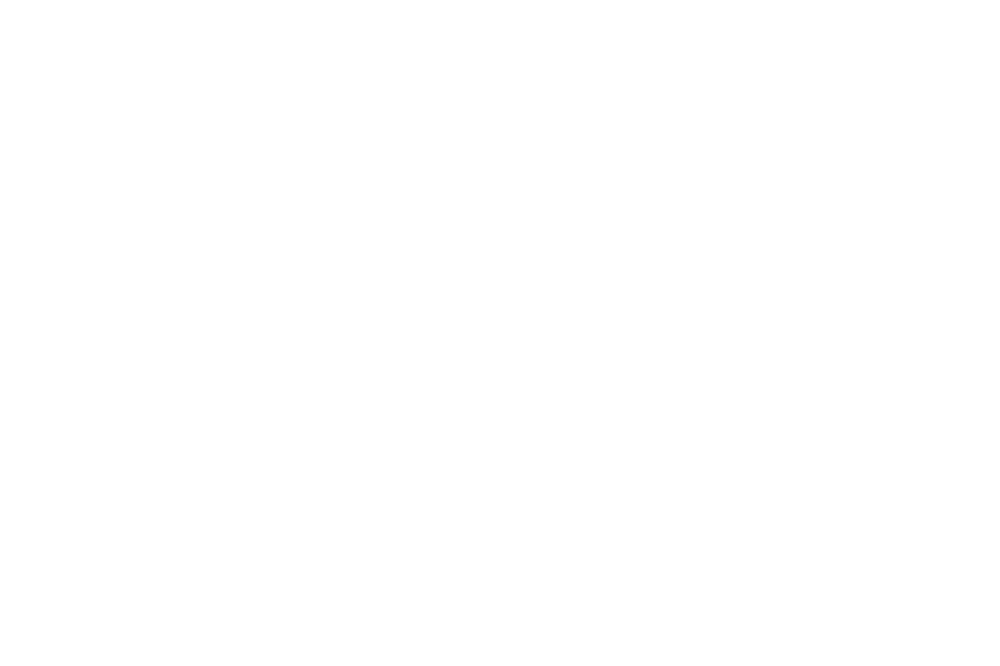

  0%|                                               | 100/60000 [01:25<13:23:19,  1.24it/s]

<IPython.core.display.Javascript object>


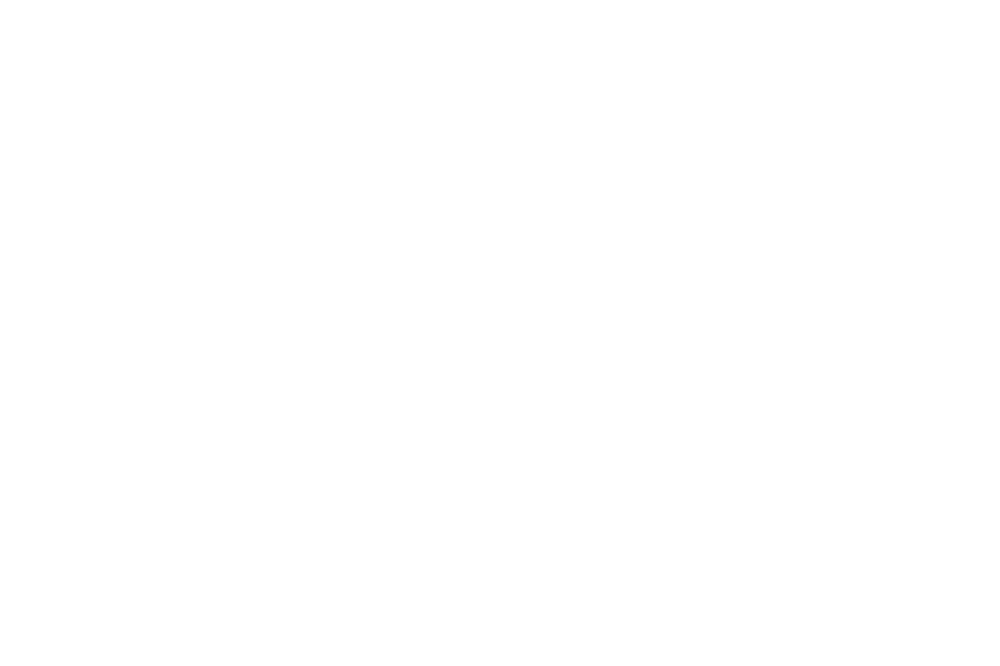

  0%|▏                                              | 200/60000 [02:49<13:32:44,  1.23it/s]

<IPython.core.display.Javascript object>


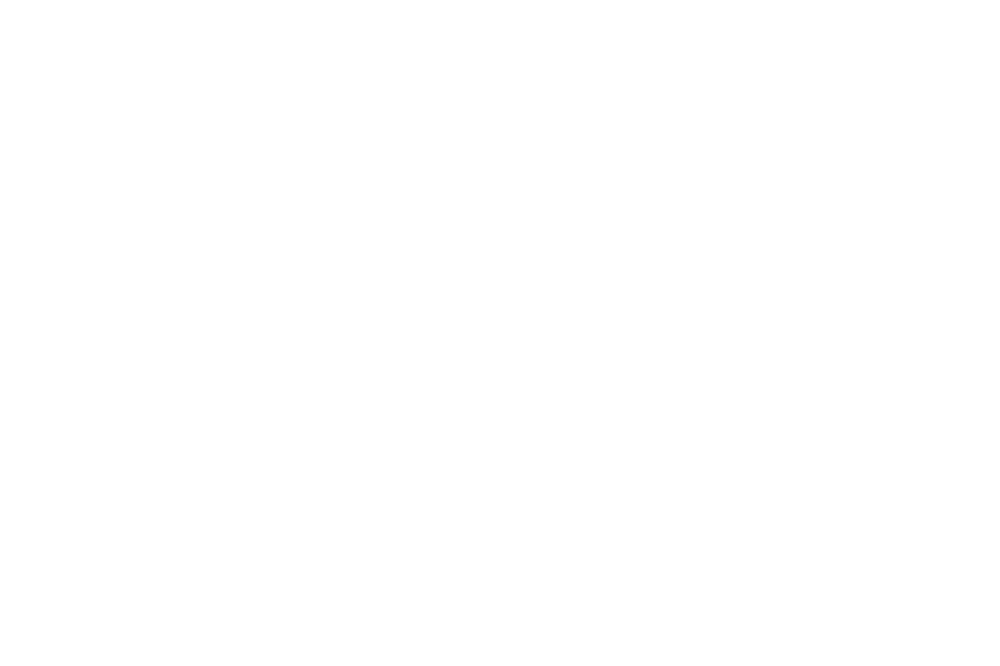

  0%|▏                                              | 300/60000 [04:13<13:32:32,  1.22it/s]

<IPython.core.display.Javascript object>


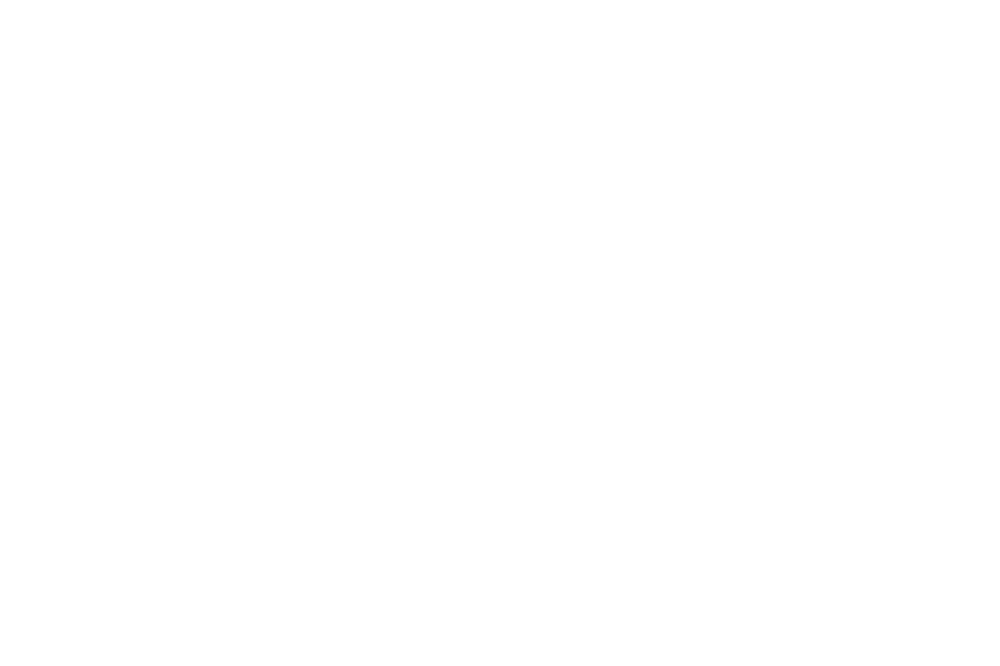

  1%|▎                                              | 400/60000 [05:37<13:31:05,  1.22it/s]

<IPython.core.display.Javascript object>


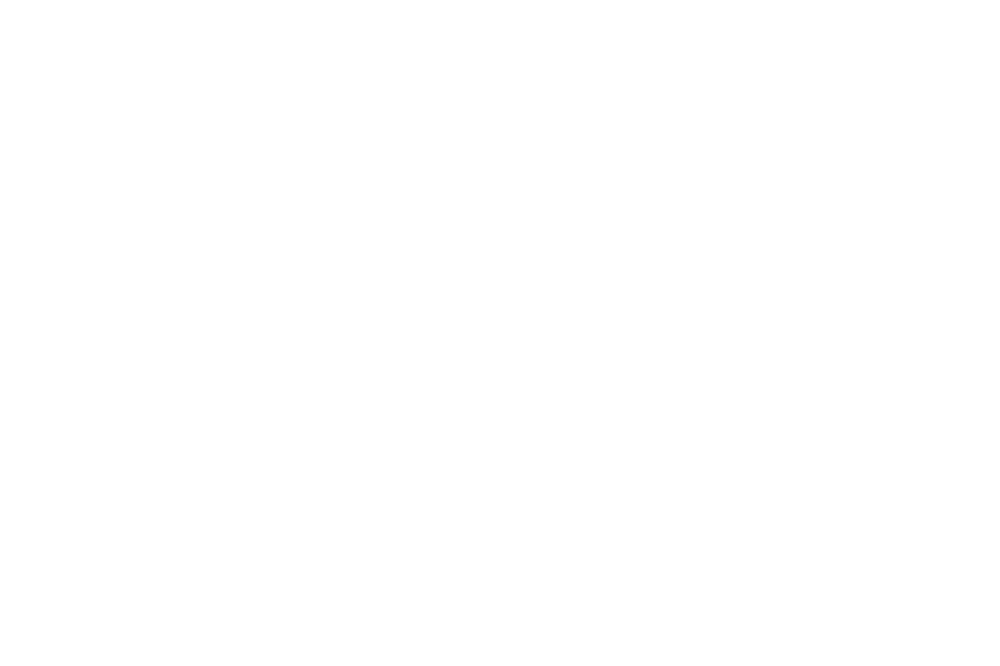

  1%|▍                                              | 500/60000 [07:01<13:26:54,  1.23it/s]

<IPython.core.display.Javascript object>


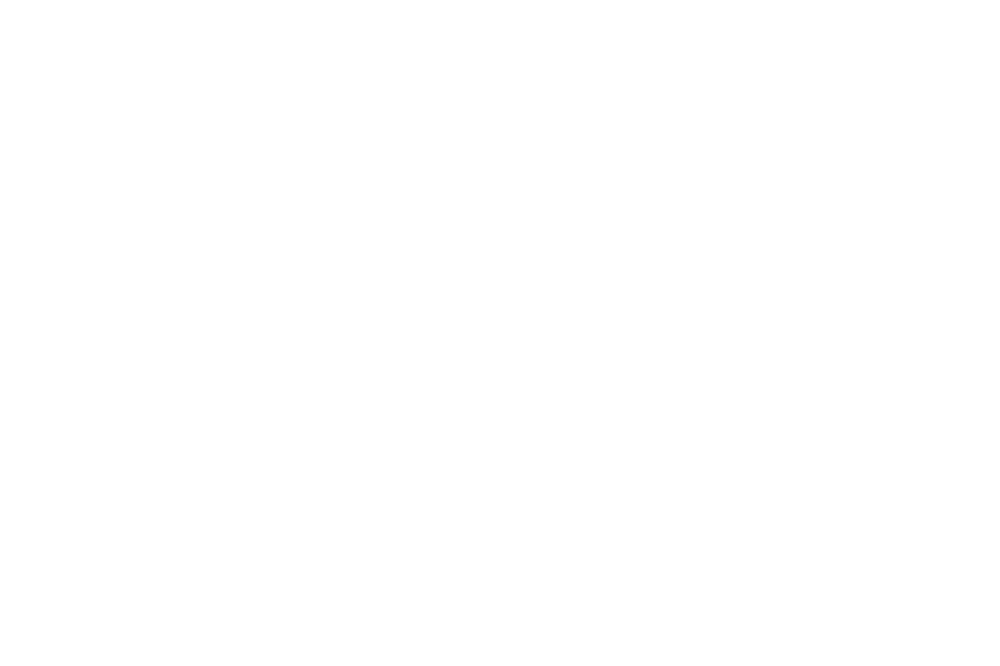

  1%|▍                                              | 600/60000 [08:25<13:26:03,  1.23it/s]

<IPython.core.display.Javascript object>


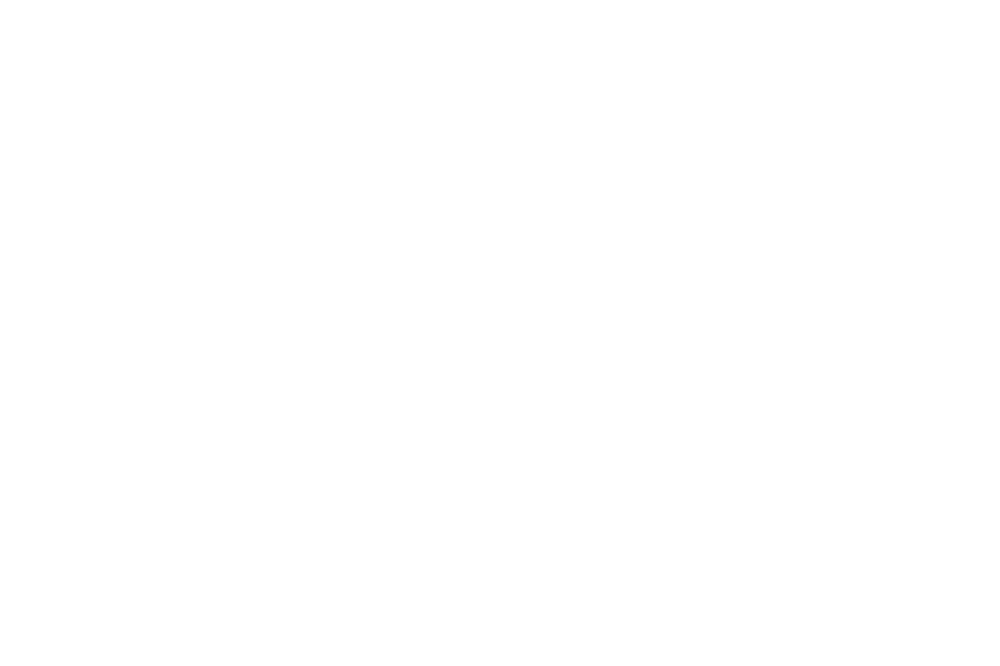

  1%|▌                                              | 700/60000 [09:49<13:25:27,  1.23it/s]

<IPython.core.display.Javascript object>


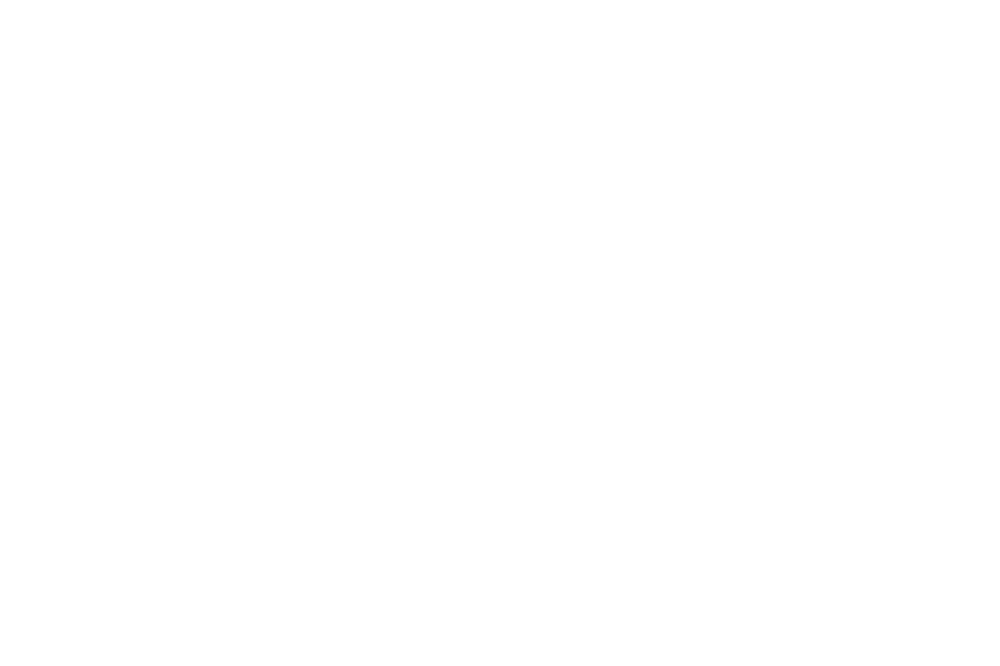

  1%|▋                                              | 800/60000 [11:13<13:24:33,  1.23it/s]

<IPython.core.display.Javascript object>


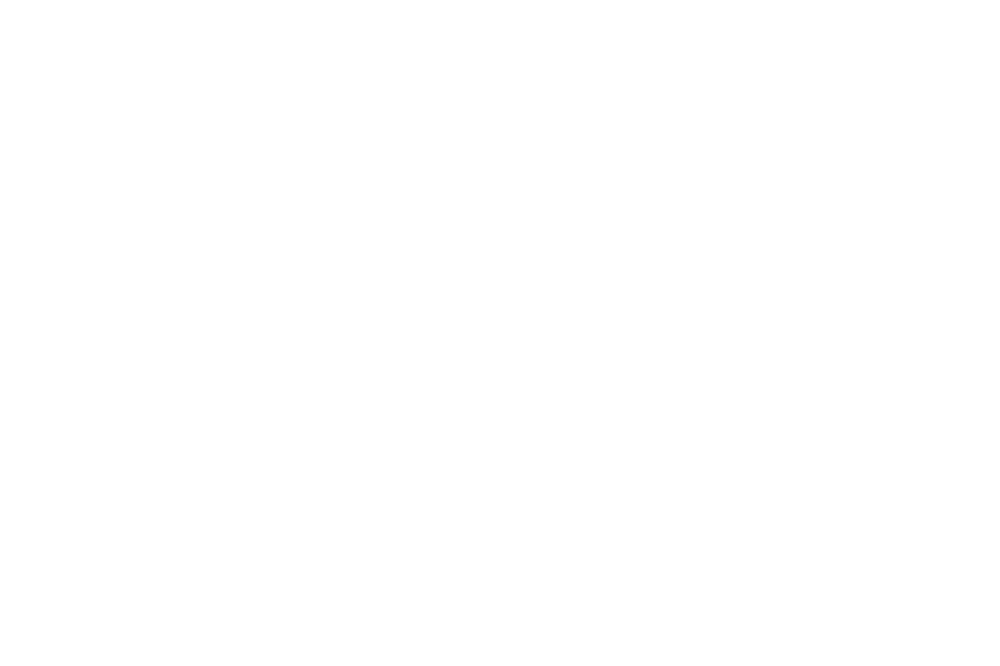

  2%|▋                                              | 900/60000 [12:37<13:22:03,  1.23it/s]

<IPython.core.display.Javascript object>


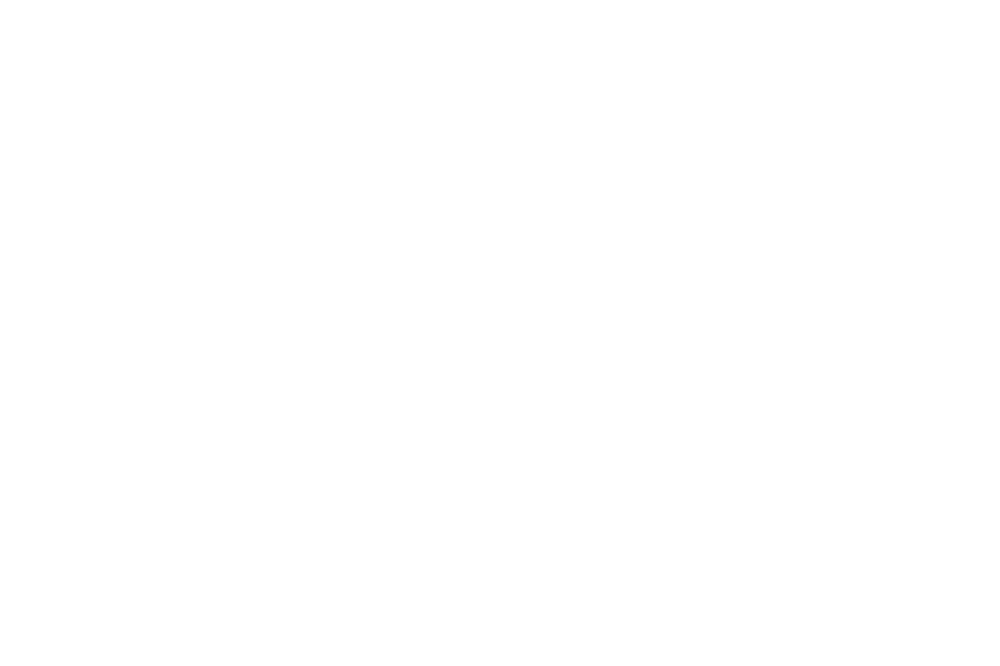

  2%|▊                                             | 1000/60000 [14:01<13:20:48,  1.23it/s]

<IPython.core.display.Javascript object>


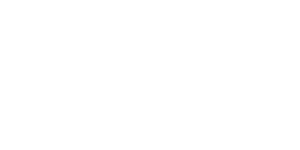

  2%|▊                                             | 1100/60000 [15:25<13:19:23,  1.23it/s]

<IPython.core.display.Javascript object>


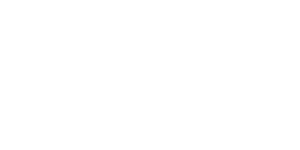

  2%|▉                                             | 1200/60000 [16:49<13:16:33,  1.23it/s]

<IPython.core.display.Javascript object>


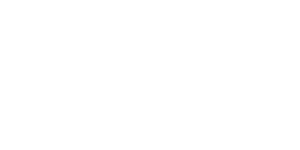

  2%|▉                                             | 1300/60000 [18:13<13:16:56,  1.23it/s]

<IPython.core.display.Javascript object>


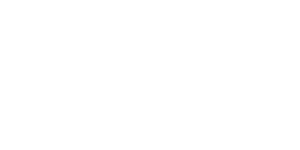

  2%|█                                             | 1400/60000 [19:37<13:16:46,  1.23it/s]

<IPython.core.display.Javascript object>


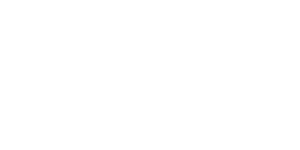

  2%|█▏                                            | 1500/60000 [21:01<13:14:03,  1.23it/s]

<IPython.core.display.Javascript object>


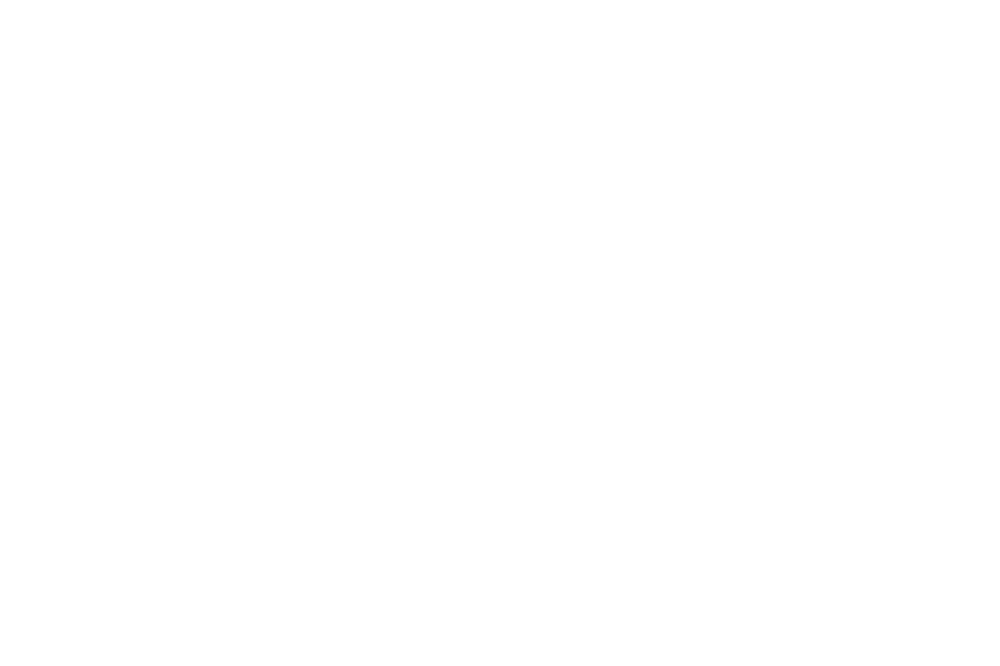

  3%|█▏                                            | 1600/60000 [22:25<13:12:43,  1.23it/s]

<IPython.core.display.Javascript object>


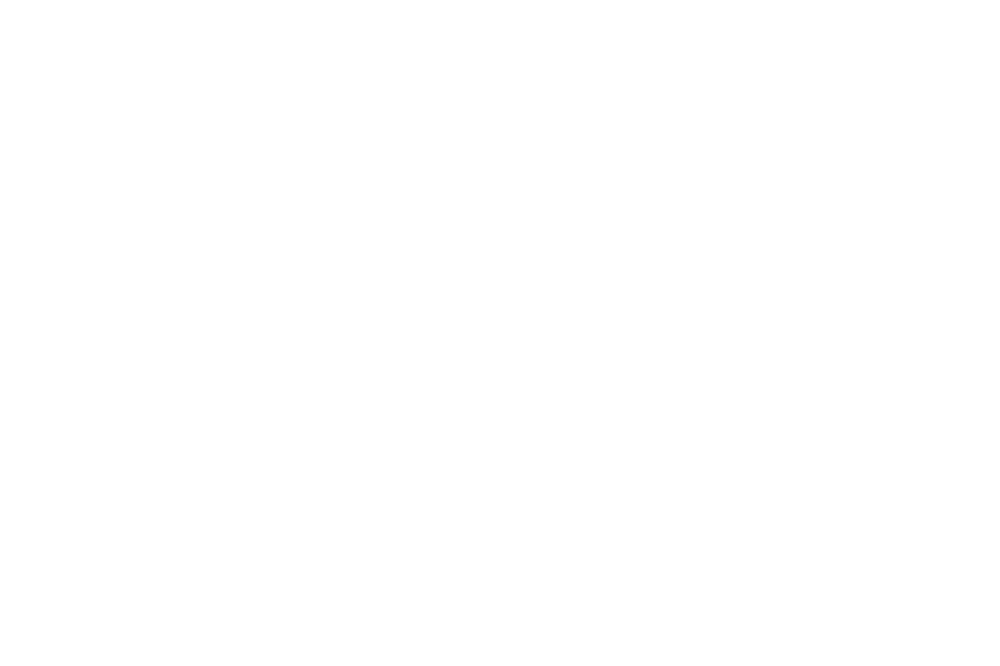

  3%|█▍                                            | 1800/60000 [25:13<13:11:06,  1.23it/s]

<IPython.core.display.Javascript object>


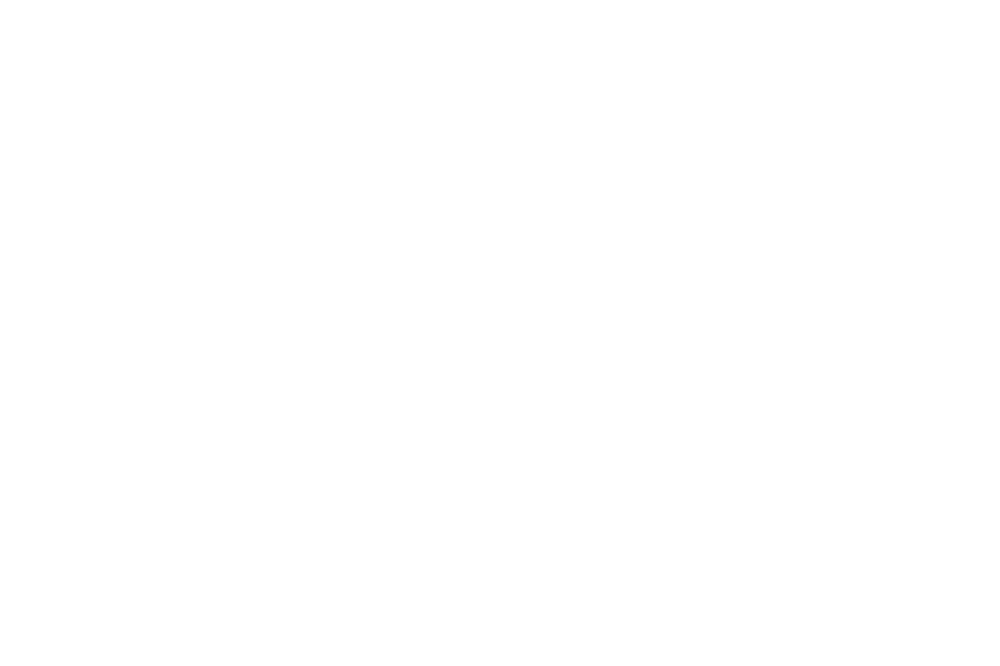

  3%|█▍                                            | 1900/60000 [26:37<13:09:21,  1.23it/s]

<IPython.core.display.Javascript object>


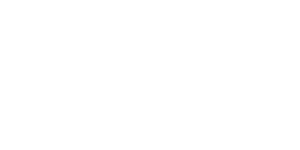

  3%|█▌                                            | 2000/60000 [28:01<13:07:46,  1.23it/s]

<IPython.core.display.Javascript object>


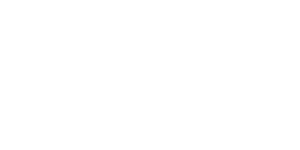

  4%|█▌                                            | 2100/60000 [29:25<13:05:42,  1.23it/s]

<IPython.core.display.Javascript object>


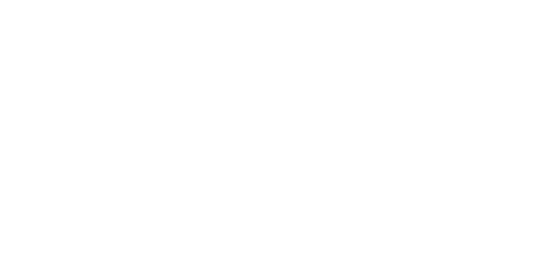

  4%|█▋                                            | 2200/60000 [30:49<13:04:45,  1.23it/s]

<IPython.core.display.Javascript object>


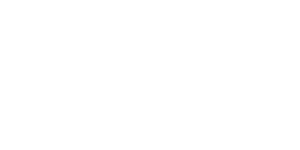

  4%|█▊                                            | 2300/60000 [32:13<13:03:28,  1.23it/s]

<IPython.core.display.Javascript object>


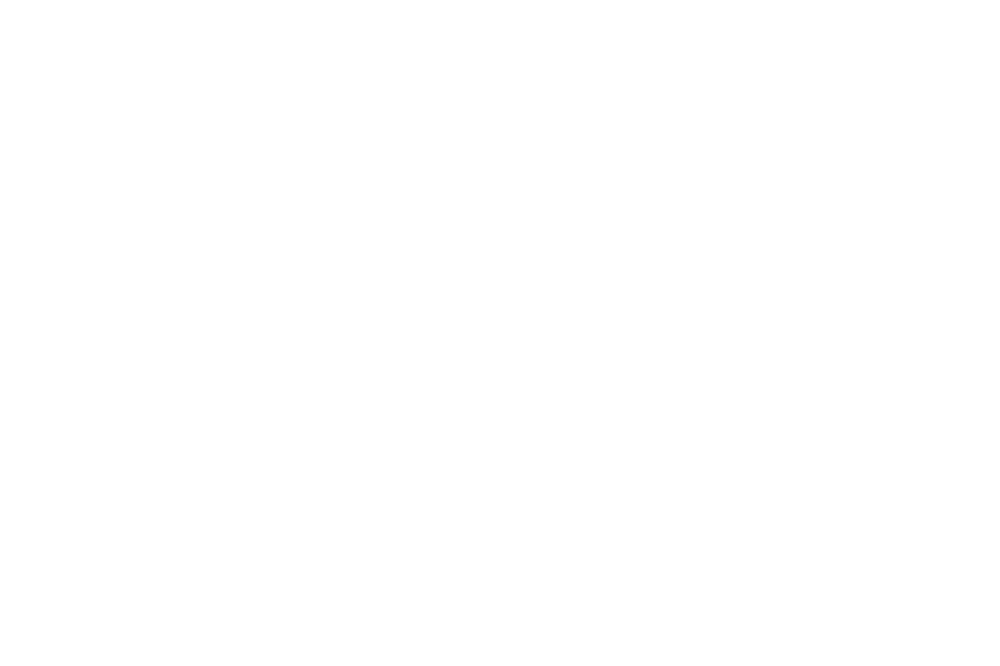

  4%|█▊                                            | 2400/60000 [33:37<13:02:31,  1.23it/s]

<IPython.core.display.Javascript object>


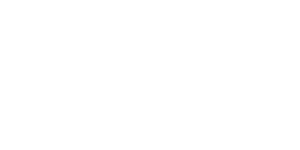

  4%|█▉                                            | 2500/60000 [35:01<13:00:50,  1.23it/s]

<IPython.core.display.Javascript object>


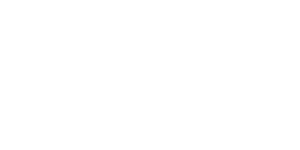

  4%|█▉                                            | 2600/60000 [36:25<12:59:47,  1.23it/s]

<IPython.core.display.Javascript object>


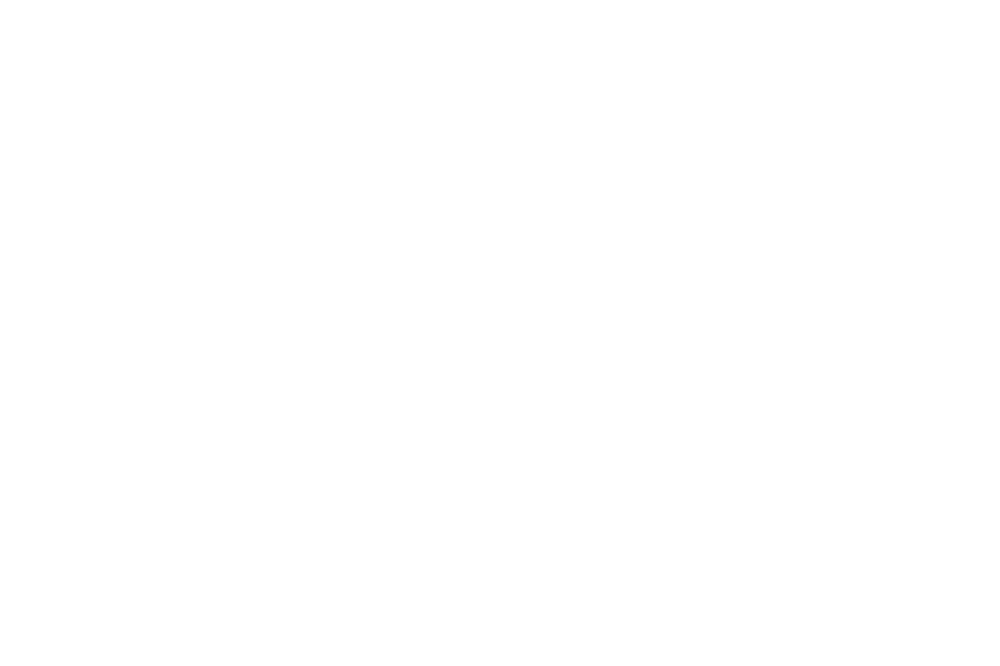

  4%|██                                            | 2700/60000 [37:49<12:58:31,  1.23it/s]

<IPython.core.display.Javascript object>


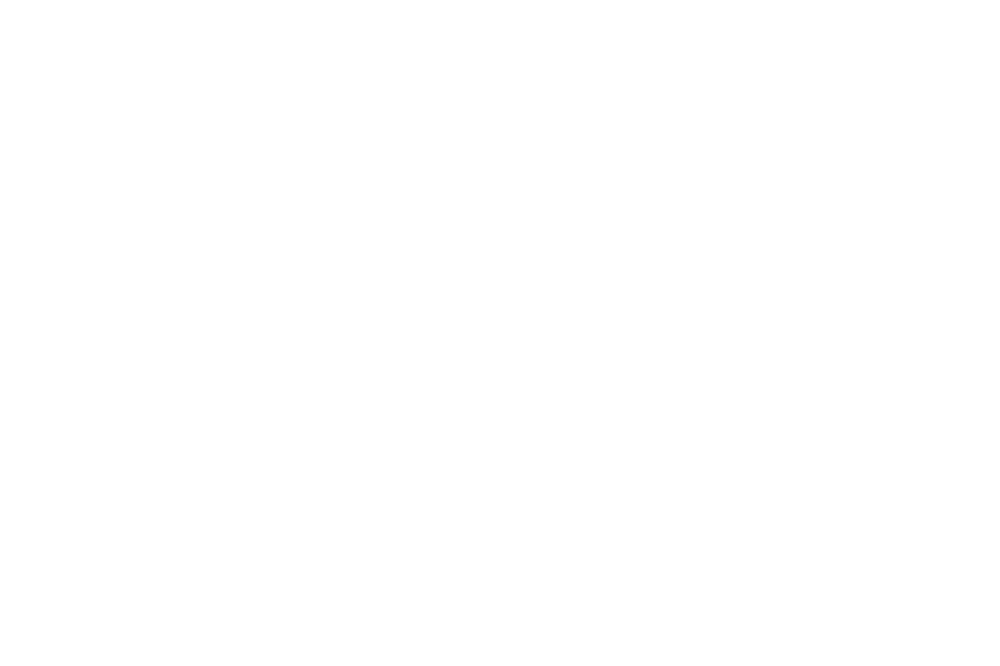

  5%|██▏                                           | 2800/60000 [39:13<12:57:07,  1.23it/s]

<IPython.core.display.Javascript object>


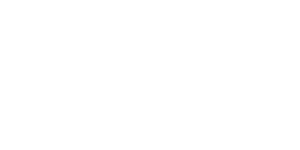

  5%|██▏                                           | 2900/60000 [40:37<12:55:33,  1.23it/s]

<IPython.core.display.Javascript object>


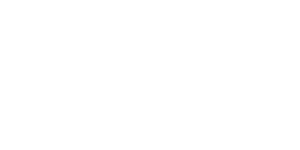

  5%|██▎                                           | 3000/60000 [42:01<12:53:10,  1.23it/s]

<IPython.core.display.Javascript object>


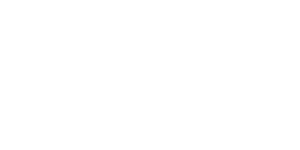

  5%|██▍                                           | 3100/60000 [43:25<12:53:24,  1.23it/s]

<IPython.core.display.Javascript object>


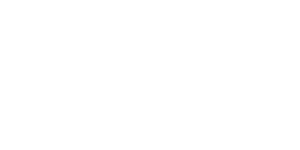

  5%|██▍                                           | 3200/60000 [44:49<12:51:34,  1.23it/s]

<IPython.core.display.Javascript object>


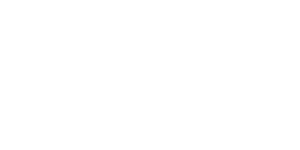

  6%|██▌                                           | 3300/60000 [46:13<12:49:47,  1.23it/s]

<IPython.core.display.Javascript object>


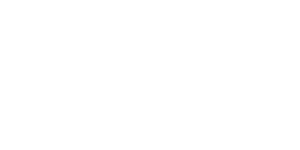

  6%|██▌                                           | 3400/60000 [47:38<12:48:53,  1.23it/s]

<IPython.core.display.Javascript object>


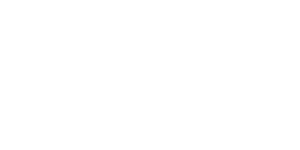

  6%|██▋                                           | 3500/60000 [49:01<12:47:18,  1.23it/s]

<IPython.core.display.Javascript object>


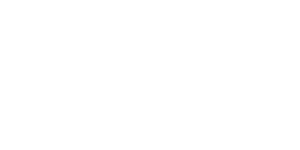

  6%|██▊                                           | 3600/60000 [50:25<12:46:30,  1.23it/s]

<IPython.core.display.Javascript object>


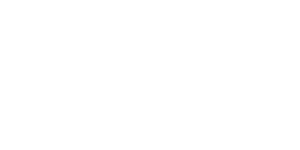

  6%|██▊                                           | 3700/60000 [51:49<12:44:39,  1.23it/s]

<IPython.core.display.Javascript object>


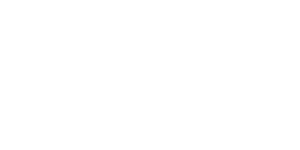

  6%|██▉                                           | 3800/60000 [53:13<12:42:49,  1.23it/s]

<IPython.core.display.Javascript object>


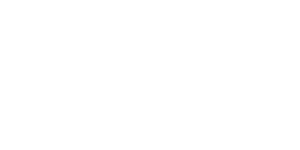

  6%|██▉                                           | 3900/60000 [54:38<12:40:23,  1.23it/s]

<IPython.core.display.Javascript object>


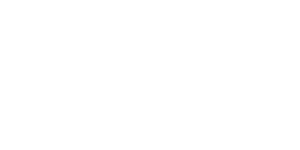

  7%|███                                           | 4000/60000 [56:02<12:40:19,  1.23it/s]

<IPython.core.display.Javascript object>


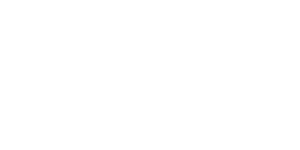

  7%|███▏                                          | 4100/60000 [57:26<12:38:54,  1.23it/s]

<IPython.core.display.Javascript object>


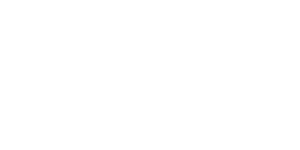

  7%|███▏                                          | 4200/60000 [58:50<12:37:35,  1.23it/s]

<IPython.core.display.Javascript object>


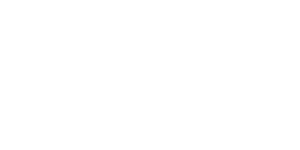

  7%|███▏                                        | 4300/60000 [1:00:14<12:36:34,  1.23it/s]

<IPython.core.display.Javascript object>


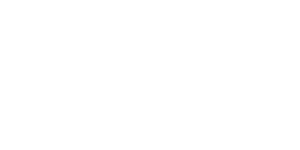

  7%|███▏                                        | 4400/60000 [1:01:37<12:34:59,  1.23it/s]

<IPython.core.display.Javascript object>


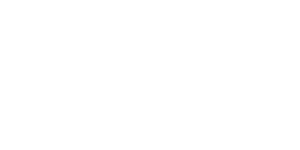

  8%|███▎                                        | 4500/60000 [1:03:01<12:32:58,  1.23it/s]IOPub message rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_msg_rate_limit`.

Current values:
NotebookApp.iopub_msg_rate_limit=1000.0 (msgs/sec)
NotebookApp.rate_limit_window=3.0 (secs)

 21%|████████▉                                  | 12500/60000 [2:55:08<10:44:52,  1.23it/s]

<IPython.core.display.Javascript object>


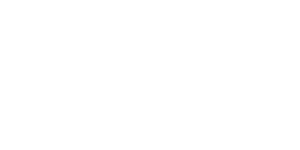

 21%|█████████                                  | 12600/60000 [2:56:32<10:43:28,  1.23it/s]

<IPython.core.display.Javascript object>


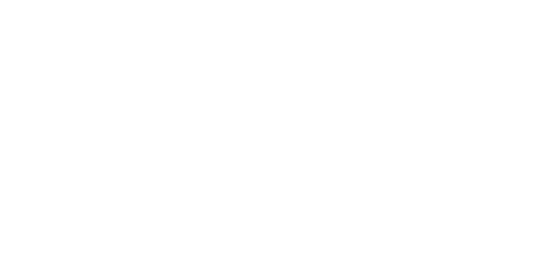

 21%|█████████                                  | 12700/60000 [2:57:56<10:43:02,  1.23it/s]

<IPython.core.display.Javascript object>


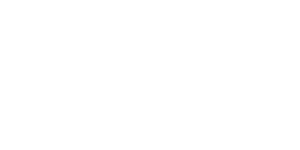

 21%|█████████▏                                 | 12800/60000 [2:59:20<10:39:14,  1.23it/s]

<IPython.core.display.Javascript object>


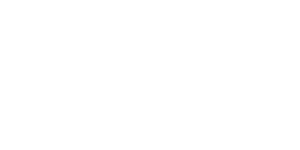

 22%|█████████▏                                 | 12900/60000 [3:00:44<10:39:11,  1.23it/s]

<IPython.core.display.Javascript object>


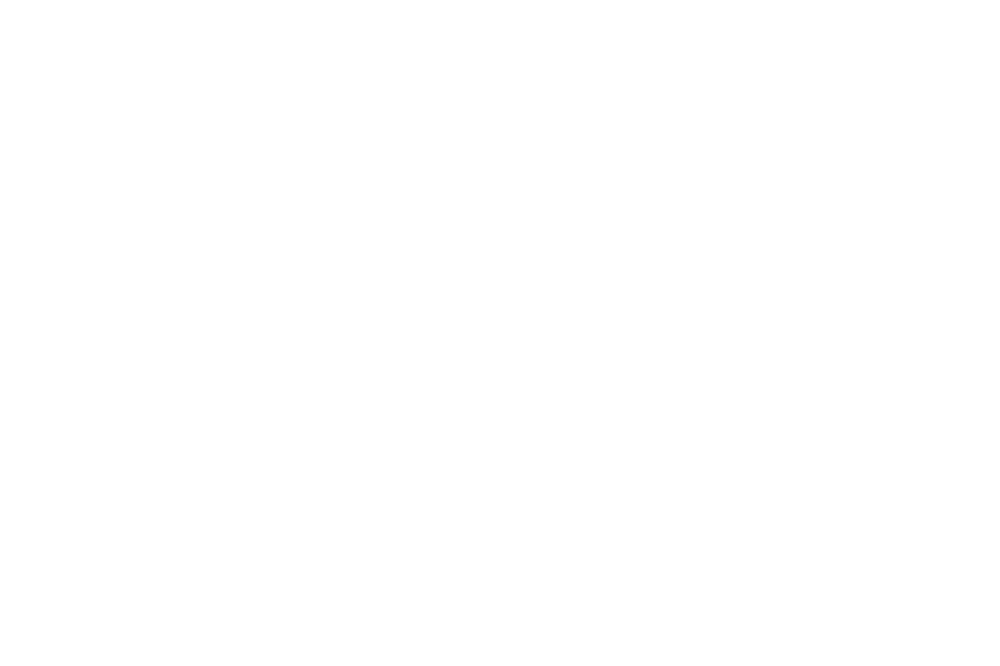

 22%|█████████▎                                 | 13000/60000 [3:02:09<10:38:22,  1.23it/s]

<IPython.core.display.Javascript object>


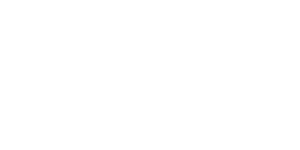

 22%|█████████▍                                 | 13100/60000 [3:03:33<10:36:46,  1.23it/s]

<IPython.core.display.Javascript object>


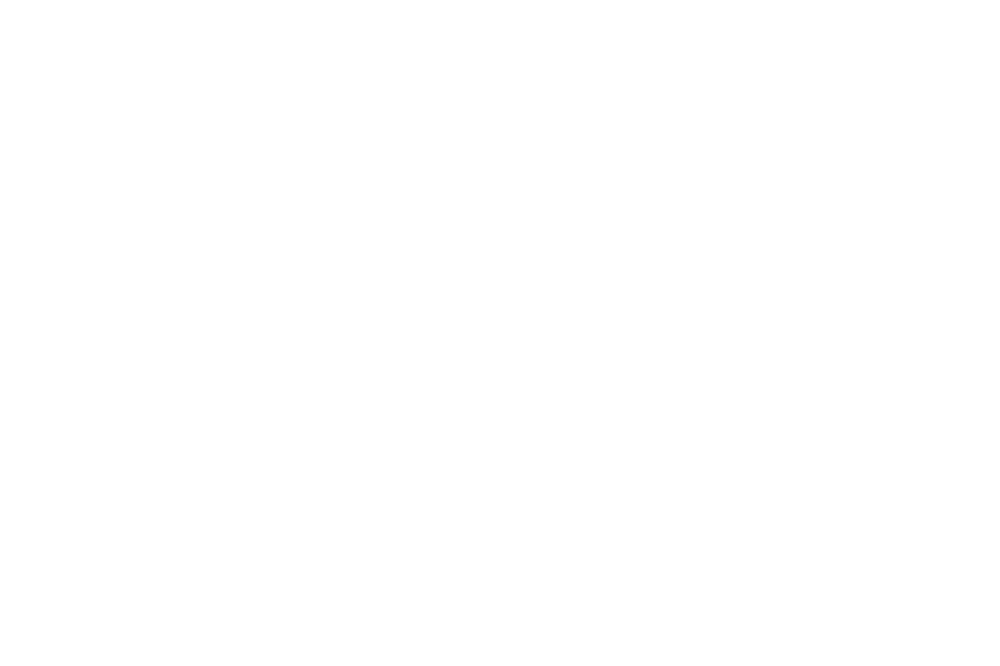

 22%|█████████▍                                 | 13200/60000 [3:04:57<10:36:14,  1.23it/s]

<IPython.core.display.Javascript object>


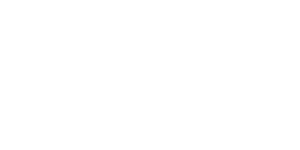

 22%|█████████▌                                 | 13300/60000 [3:06:21<10:34:06,  1.23it/s]

<IPython.core.display.Javascript object>


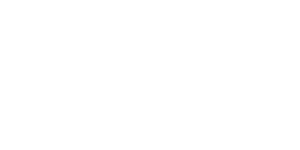

 22%|█████████▌                                 | 13400/60000 [3:07:45<10:32:58,  1.23it/s]

<IPython.core.display.Javascript object>


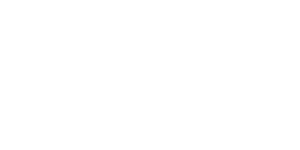

 22%|█████████▋                                 | 13500/60000 [3:09:09<10:31:34,  1.23it/s]

<IPython.core.display.Javascript object>


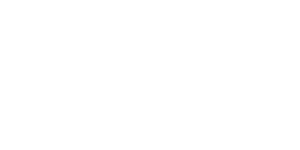

 23%|█████████▋                                 | 13600/60000 [3:10:33<10:30:09,  1.23it/s]

<IPython.core.display.Javascript object>


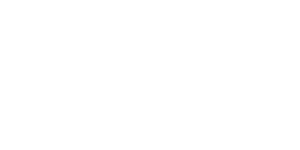

 23%|█████████▊                                 | 13700/60000 [3:11:57<10:29:08,  1.23it/s]

<IPython.core.display.Javascript object>


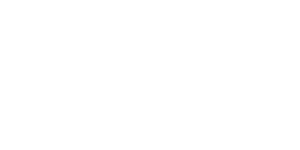

 23%|█████████▉                                 | 13800/60000 [3:13:21<10:27:12,  1.23it/s]

<IPython.core.display.Javascript object>


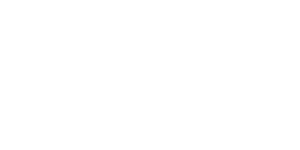

 23%|█████████▉                                 | 13900/60000 [3:14:45<10:25:49,  1.23it/s]

<IPython.core.display.Javascript object>


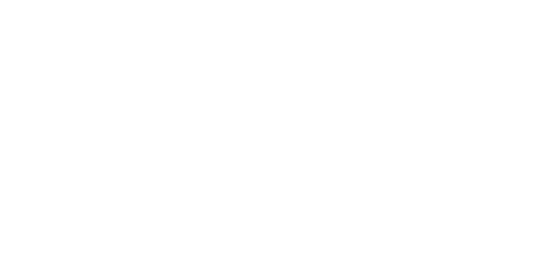

 23%|██████████                                 | 14000/60000 [3:16:10<10:24:56,  1.23it/s]

<IPython.core.display.Javascript object>


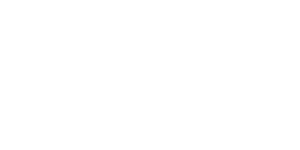

 24%|██████████                                 | 14100/60000 [3:17:34<10:23:52,  1.23it/s]

<IPython.core.display.Javascript object>


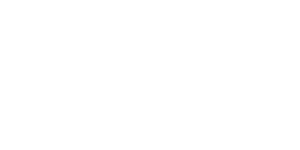

 24%|██████████▏                                | 14200/60000 [3:18:58<10:22:03,  1.23it/s]

<IPython.core.display.Javascript object>


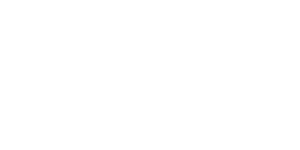

 24%|██████████▏                                | 14300/60000 [3:20:22<10:21:07,  1.23it/s]

<IPython.core.display.Javascript object>


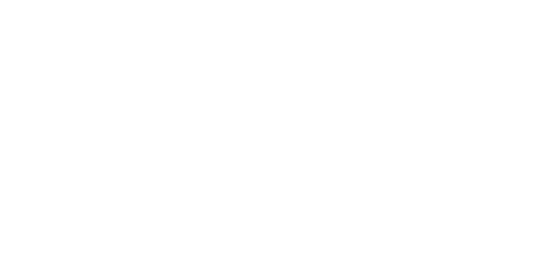

 24%|██████████▎                                | 14400/60000 [3:21:46<10:18:25,  1.23it/s]

<IPython.core.display.Javascript object>


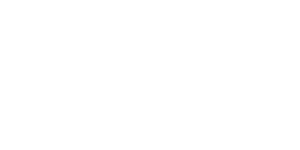

 24%|██████████▍                                | 14500/60000 [3:23:10<10:18:52,  1.23it/s]

<IPython.core.display.Javascript object>


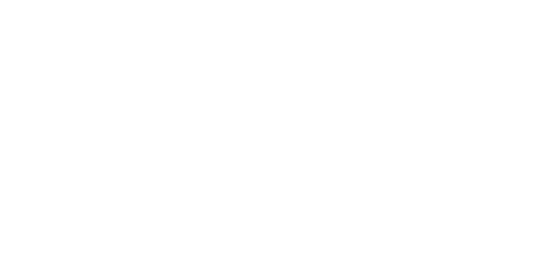

 24%|██████████▍                                | 14600/60000 [3:24:35<10:17:27,  1.23it/s]

<IPython.core.display.Javascript object>


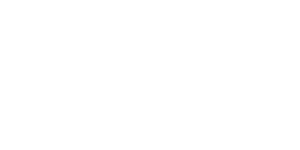

 24%|██████████▌                                | 14700/60000 [3:25:59<10:14:55,  1.23it/s]

<IPython.core.display.Javascript object>


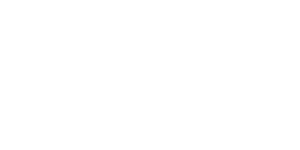

 25%|██████████▌                                | 14800/60000 [3:27:23<10:14:20,  1.23it/s]

<IPython.core.display.Javascript object>


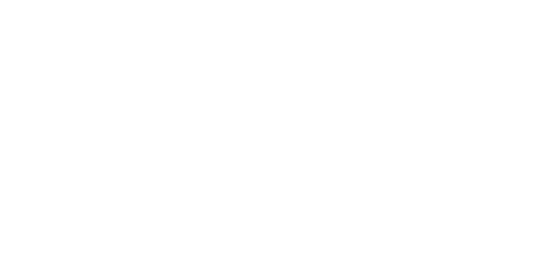

 25%|██████████▋                                | 14900/60000 [3:28:47<10:12:30,  1.23it/s]

<IPython.core.display.Javascript object>


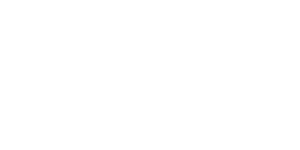

 25%|██████████▊                                | 15000/60000 [3:30:11<10:11:35,  1.23it/s]

<IPython.core.display.Javascript object>


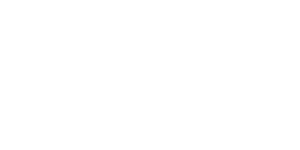

 25%|██████████▊                                | 15100/60000 [3:31:35<10:09:49,  1.23it/s]

<IPython.core.display.Javascript object>


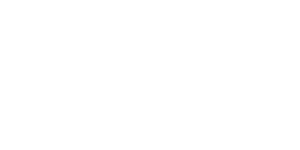

 25%|██████████▊                                | 15146/60000 [3:32:15<10:08:33,  1.23it/s]IOPub message rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_msg_rate_limit`.

Current values:
NotebookApp.iopub_msg_rate_limit=1000.0 (msgs/sec)
NotebookApp.rate_limit_window=3.0 (secs)

 39%|█████████████████                           | 23200/60000 [5:25:09<8:19:04,  1.23it/s]

<IPython.core.display.Javascript object>


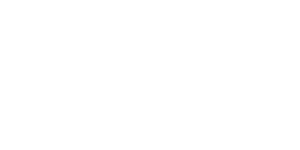

 39%|█████████████████                           | 23300/60000 [5:26:33<8:18:06,  1.23it/s]

<IPython.core.display.Javascript object>


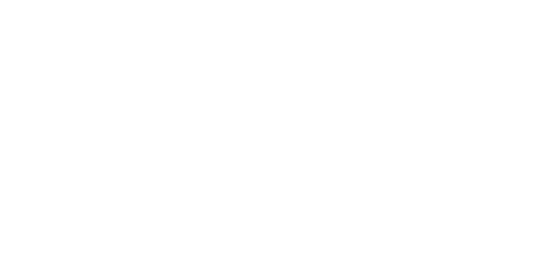

 39%|█████████████████▏                          | 23400/60000 [5:27:57<8:16:14,  1.23it/s]

<IPython.core.display.Javascript object>


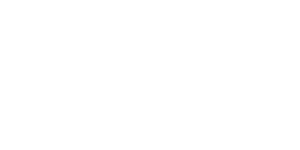

 39%|█████████████████▏                          | 23500/60000 [5:29:21<8:15:36,  1.23it/s]

<IPython.core.display.Javascript object>


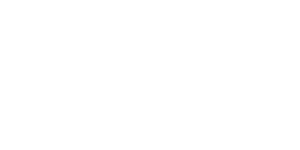

 39%|█████████████████▎                          | 23600/60000 [5:30:46<8:12:55,  1.23it/s]

<IPython.core.display.Javascript object>


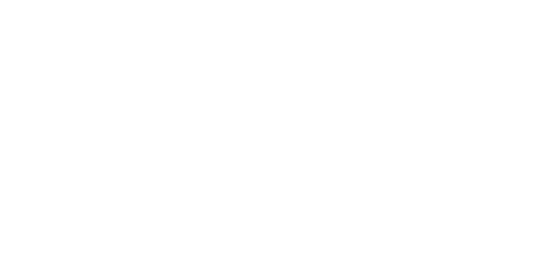

 40%|█████████████████▍                          | 23700/60000 [5:32:09<8:12:28,  1.23it/s]

<IPython.core.display.Javascript object>


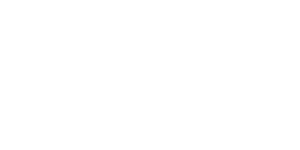

 40%|█████████████████▍                          | 23800/60000 [5:33:34<8:10:59,  1.23it/s]

<IPython.core.display.Javascript object>


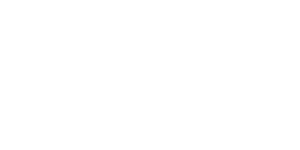

 40%|█████████████████▌                          | 23900/60000 [5:34:58<8:10:01,  1.23it/s]

<IPython.core.display.Javascript object>


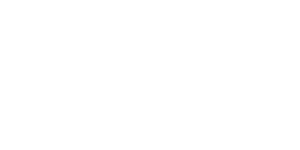

 40%|█████████████████▌                          | 24000/60000 [5:36:22<8:08:16,  1.23it/s]

<IPython.core.display.Javascript object>


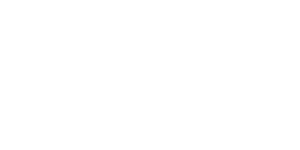

 40%|█████████████████▋                          | 24100/60000 [5:37:46<8:06:50,  1.23it/s]

<IPython.core.display.Javascript object>


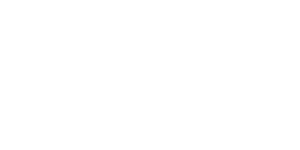

 40%|█████████████████▋                          | 24200/60000 [5:39:11<8:05:37,  1.23it/s]

<IPython.core.display.Javascript object>


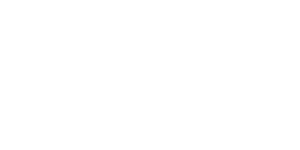

 40%|█████████████████▊                          | 24300/60000 [5:40:35<8:04:15,  1.23it/s]

<IPython.core.display.Javascript object>


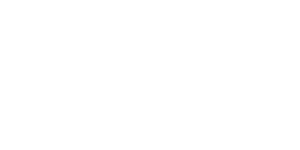

 41%|█████████████████▉                          | 24400/60000 [5:41:59<8:02:37,  1.23it/s]

<IPython.core.display.Javascript object>


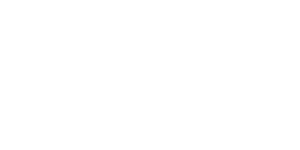

 41%|█████████████████▉                          | 24500/60000 [5:43:23<8:02:03,  1.23it/s]

<IPython.core.display.Javascript object>


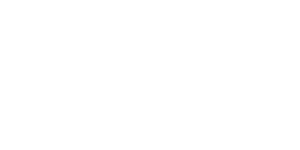

 41%|██████████████████                          | 24600/60000 [5:44:47<7:59:26,  1.23it/s]

<IPython.core.display.Javascript object>


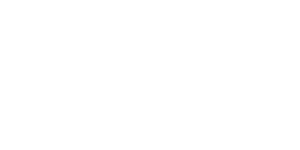

 41%|██████████████████                          | 24700/60000 [5:46:11<7:58:36,  1.23it/s]

<IPython.core.display.Javascript object>


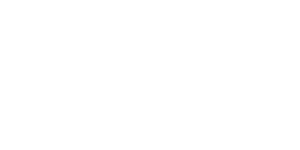

 41%|██████████████████▏                         | 24800/60000 [5:47:35<7:58:05,  1.23it/s]

<IPython.core.display.Javascript object>


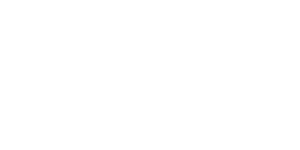

 42%|██████████████████▎                         | 24900/60000 [5:48:59<7:55:35,  1.23it/s]

<IPython.core.display.Javascript object>


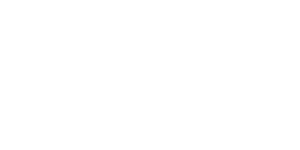

 42%|██████████████████▎                         | 25000/60000 [5:50:23<7:54:59,  1.23it/s]

<IPython.core.display.Javascript object>


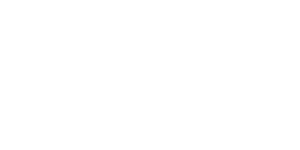

 42%|██████████████████▍                         | 25100/60000 [5:51:47<7:53:11,  1.23it/s]

<IPython.core.display.Javascript object>


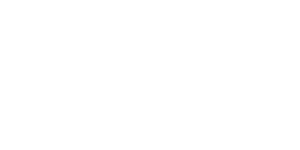

 42%|██████████████████▍                         | 25200/60000 [5:53:11<7:52:25,  1.23it/s]

<IPython.core.display.Javascript object>


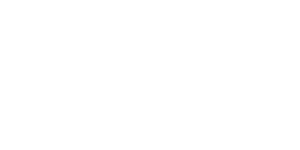

 42%|██████████████████▌                         | 25300/60000 [5:54:35<7:50:44,  1.23it/s]

<IPython.core.display.Javascript object>


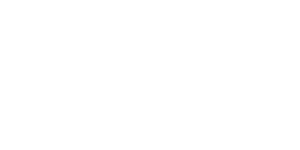

 42%|██████████████████▋                         | 25400/60000 [5:55:59<7:49:40,  1.23it/s]

<IPython.core.display.Javascript object>


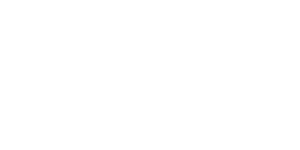

 42%|██████████████████▋                         | 25500/60000 [5:57:23<7:48:04,  1.23it/s]

<IPython.core.display.Javascript object>


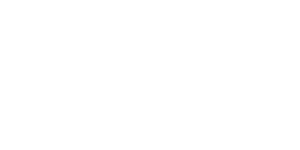

 43%|██████████████████▊                         | 25600/60000 [5:58:48<7:46:43,  1.23it/s]

<IPython.core.display.Javascript object>


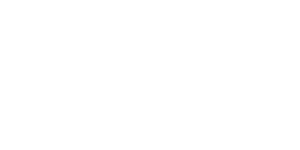

 43%|██████████████████▊                         | 25700/60000 [6:00:12<7:45:42,  1.23it/s]

<IPython.core.display.Javascript object>


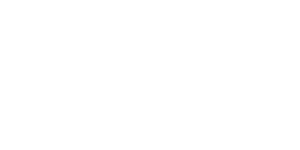

 43%|██████████████████▉                         | 25800/60000 [6:01:36<7:44:10,  1.23it/s]

<IPython.core.display.Javascript object>


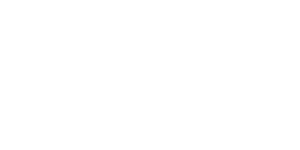

 43%|██████████████████▉                         | 25870/60000 [6:02:36<7:42:44,  1.23it/s]IOPub message rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_msg_rate_limit`.

Current values:
NotebookApp.iopub_msg_rate_limit=1000.0 (msgs/sec)
NotebookApp.rate_limit_window=3.0 (secs)

 56%|████████████████████████▊                   | 33800/60000 [7:53:47<5:55:03,  1.23it/s]

<IPython.core.display.Javascript object>


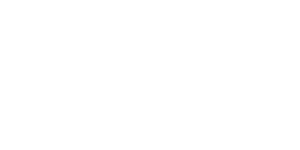

 56%|████████████████████████▊                   | 33900/60000 [7:55:11<5:53:51,  1.23it/s]

<IPython.core.display.Javascript object>


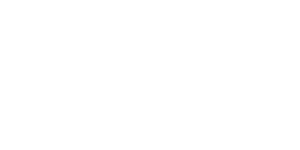

 57%|████████████████████████▉                   | 34000/60000 [7:56:35<5:52:39,  1.23it/s]

<IPython.core.display.Javascript object>


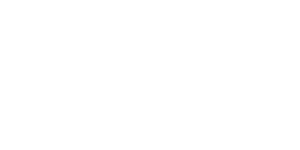

 57%|█████████████████████████                   | 34100/60000 [7:57:59<5:51:00,  1.23it/s]

<IPython.core.display.Javascript object>


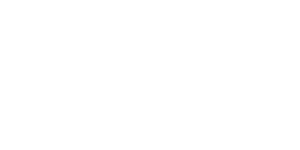

 57%|█████████████████████████                   | 34200/60000 [7:59:24<5:49:40,  1.23it/s]

<IPython.core.display.Javascript object>


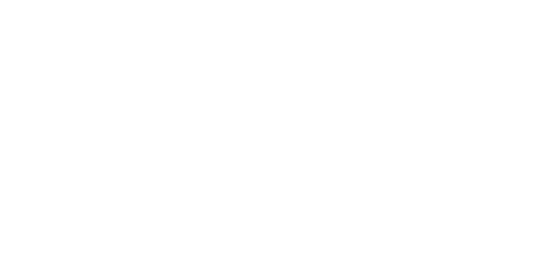

 57%|█████████████████████████▏                  | 34300/60000 [8:00:48<5:48:53,  1.23it/s]

<IPython.core.display.Javascript object>


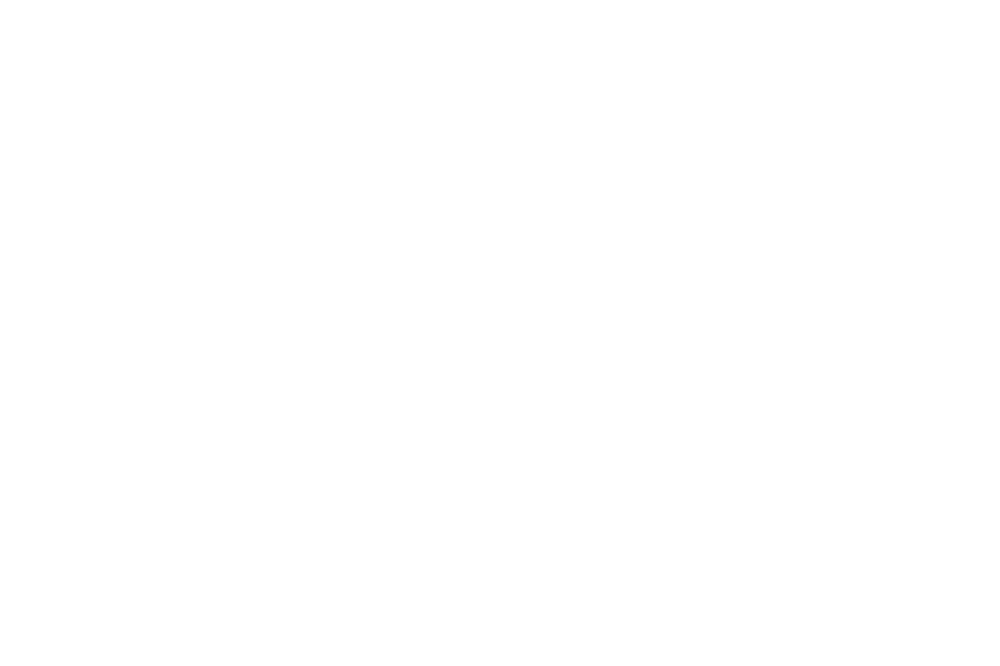

 57%|█████████████████████████▏                  | 34400/60000 [8:02:12<5:47:20,  1.23it/s]

<IPython.core.display.Javascript object>


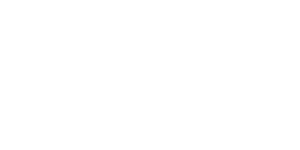

 57%|█████████████████████████▎                  | 34500/60000 [8:03:36<5:46:05,  1.23it/s]

<IPython.core.display.Javascript object>


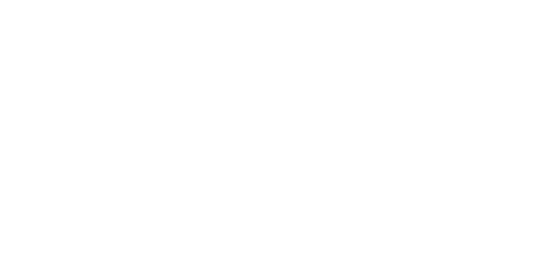

 58%|█████████████████████████▎                  | 34600/60000 [8:05:00<5:44:14,  1.23it/s]

<IPython.core.display.Javascript object>


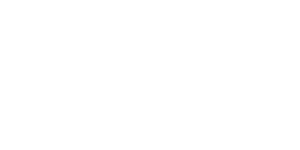

 58%|█████████████████████████▍                  | 34700/60000 [8:06:25<5:42:51,  1.23it/s]

<IPython.core.display.Javascript object>


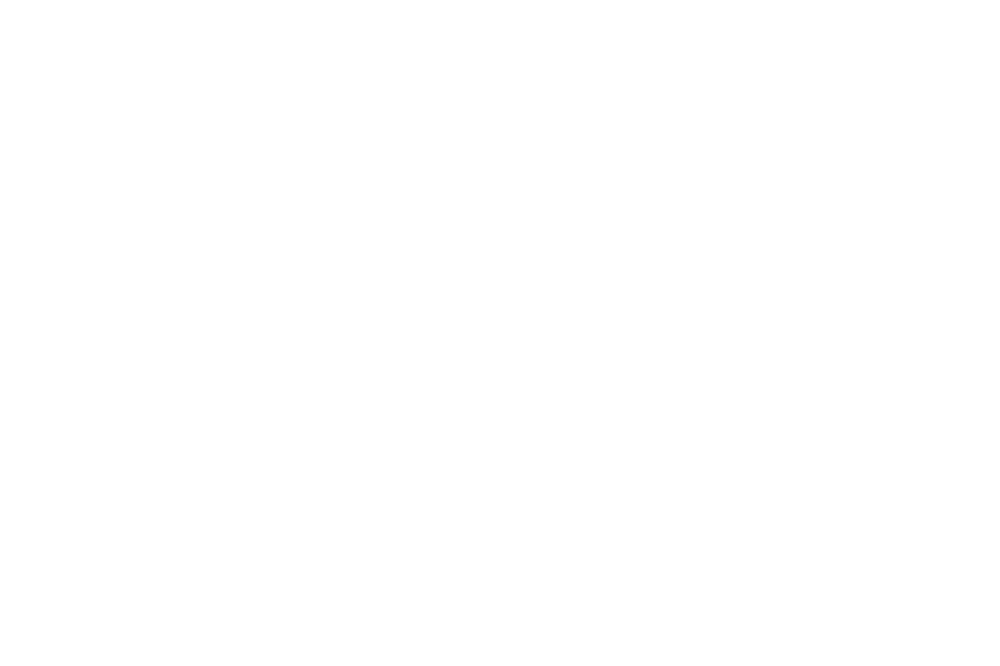

 58%|█████████████████████████▌                  | 34800/60000 [8:07:49<5:41:39,  1.23it/s]

<IPython.core.display.Javascript object>


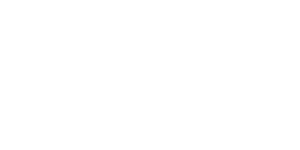

 58%|█████████████████████████▌                  | 34900/60000 [8:09:13<5:40:11,  1.23it/s]

<IPython.core.display.Javascript object>


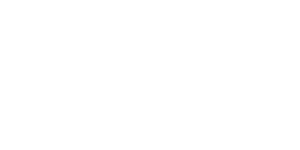

 58%|█████████████████████████▋                  | 35000/60000 [8:10:37<5:39:28,  1.23it/s]

<IPython.core.display.Javascript object>


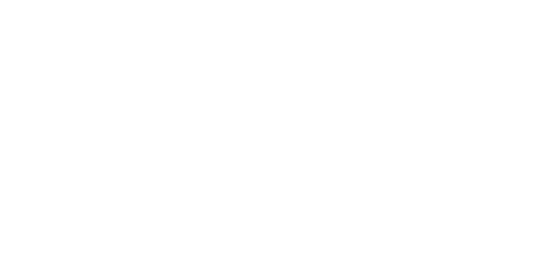

 58%|█████████████████████████▋                  | 35100/60000 [8:12:01<5:37:45,  1.23it/s]

<IPython.core.display.Javascript object>


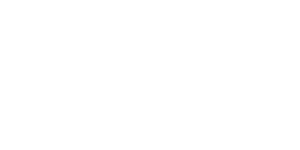

 59%|█████████████████████████▊                  | 35200/60000 [8:13:25<5:36:43,  1.23it/s]

<IPython.core.display.Javascript object>


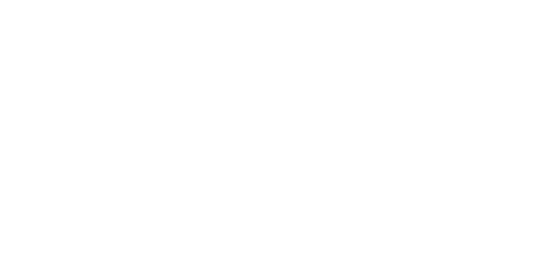

 59%|█████████████████████████▉                  | 35300/60000 [8:14:49<5:35:11,  1.23it/s]

<IPython.core.display.Javascript object>


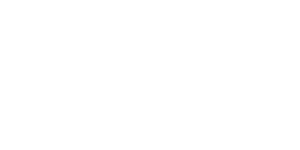

 59%|█████████████████████████▉                  | 35400/60000 [8:16:13<5:33:32,  1.23it/s]

<IPython.core.display.Javascript object>


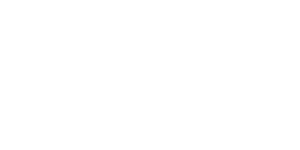

 59%|██████████████████████████                  | 35500/60000 [8:17:37<5:32:01,  1.23it/s]

<IPython.core.display.Javascript object>


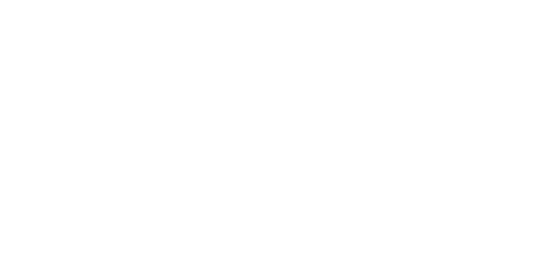

 59%|██████████████████████████                  | 35600/60000 [8:19:02<5:31:12,  1.23it/s]

<IPython.core.display.Javascript object>


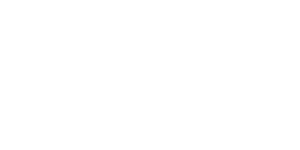

 60%|██████████████████████████▏                 | 35700/60000 [8:20:26<5:29:16,  1.23it/s]

<IPython.core.display.Javascript object>


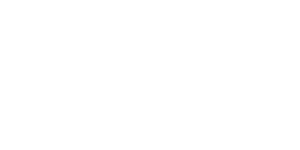

 60%|██████████████████████████▎                 | 35800/60000 [8:21:50<5:27:55,  1.23it/s]

<IPython.core.display.Javascript object>


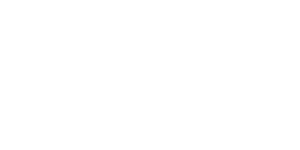

 60%|██████████████████████████▎                 | 35900/60000 [8:23:14<5:26:44,  1.23it/s]

<IPython.core.display.Javascript object>


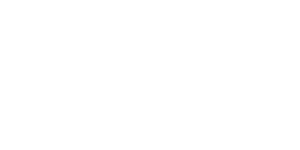

 60%|██████████████████████████▍                 | 36000/60000 [8:24:38<5:25:13,  1.23it/s]

<IPython.core.display.Javascript object>


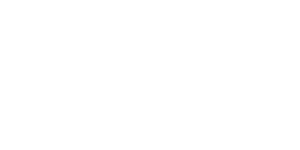

 60%|██████████████████████████▍                 | 36100/60000 [8:26:02<5:24:15,  1.23it/s]

<IPython.core.display.Javascript object>


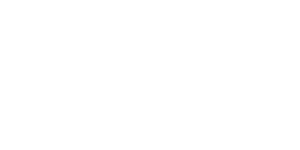

 60%|██████████████████████████▌                 | 36200/60000 [8:27:26<5:22:49,  1.23it/s]

<IPython.core.display.Javascript object>


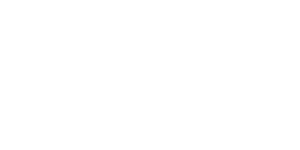

 60%|██████████████████████████▌                 | 36300/60000 [8:28:50<5:21:24,  1.23it/s]

<IPython.core.display.Javascript object>


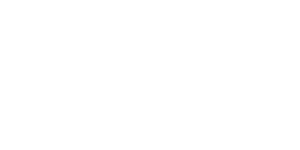

 61%|██████████████████████████▋                 | 36400/60000 [8:30:14<5:19:43,  1.23it/s]

<IPython.core.display.Javascript object>


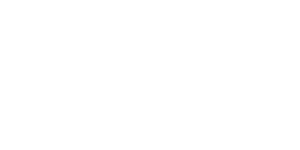

 61%|██████████████████████████▋                 | 36412/60000 [8:30:27<5:25:48,  1.21it/s]IOPub message rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_msg_rate_limit`.

Current values:
NotebookApp.iopub_msg_rate_limit=1000.0 (msgs/sec)
NotebookApp.rate_limit_window=3.0 (secs)

 73%|███████████████████████████████▍           | 43900/60000 [10:15:28<3:38:31,  1.23it/s]

<IPython.core.display.Javascript object>


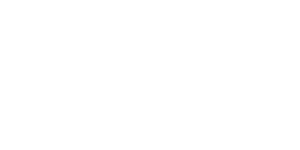

 73%|███████████████████████████████▌           | 44000/60000 [10:16:52<3:37:09,  1.23it/s]

<IPython.core.display.Javascript object>


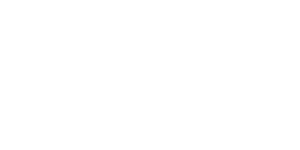

 74%|███████████████████████████████▌           | 44100/60000 [10:18:16<3:35:25,  1.23it/s]

<IPython.core.display.Javascript object>


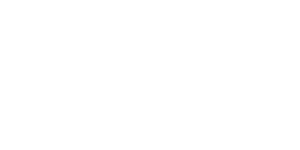

 74%|███████████████████████████████▋           | 44200/60000 [10:19:40<3:34:13,  1.23it/s]

<IPython.core.display.Javascript object>


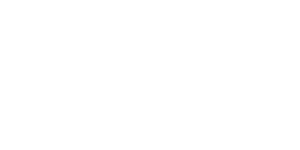

 74%|███████████████████████████████▋           | 44300/60000 [10:21:04<3:33:08,  1.23it/s]

<IPython.core.display.Javascript object>


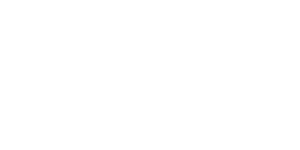

 74%|███████████████████████████████▊           | 44400/60000 [10:22:28<3:31:32,  1.23it/s]

<IPython.core.display.Javascript object>


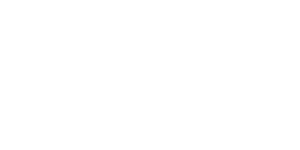

 74%|███████████████████████████████▉           | 44500/60000 [10:23:52<3:29:58,  1.23it/s]

<IPython.core.display.Javascript object>


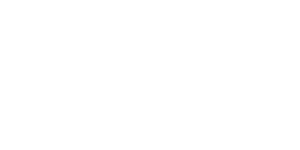

 74%|███████████████████████████████▉           | 44600/60000 [10:25:17<3:28:39,  1.23it/s]

<IPython.core.display.Javascript object>


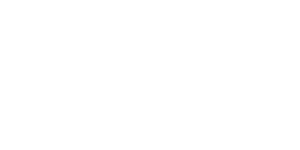

 74%|████████████████████████████████           | 44700/60000 [10:26:41<3:27:19,  1.23it/s]

<IPython.core.display.Javascript object>


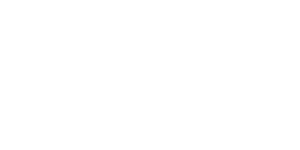

 75%|████████████████████████████████           | 44800/60000 [10:28:05<3:25:54,  1.23it/s]

<IPython.core.display.Javascript object>


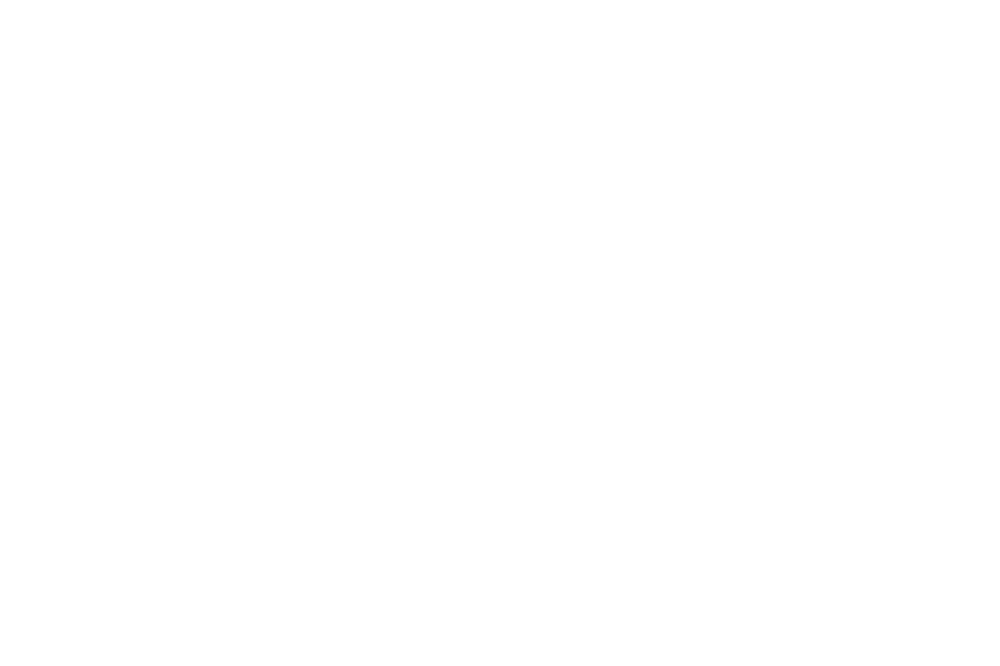

 75%|████████████████████████████████▏          | 44900/60000 [10:29:29<3:24:46,  1.23it/s]

<IPython.core.display.Javascript object>


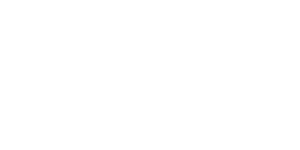

 75%|████████████████████████████████▎          | 45000/60000 [10:30:54<3:23:22,  1.23it/s]

<IPython.core.display.Javascript object>


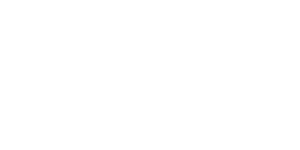

 75%|████████████████████████████████▎          | 45100/60000 [10:32:18<3:22:02,  1.23it/s]

<IPython.core.display.Javascript object>


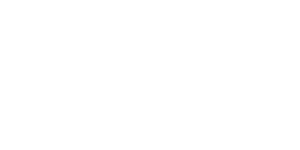

 75%|████████████████████████████████▍          | 45200/60000 [10:33:42<3:20:53,  1.23it/s]

<IPython.core.display.Javascript object>


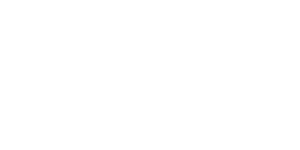

 76%|████████████████████████████████▍          | 45300/60000 [10:35:06<3:19:27,  1.23it/s]

<IPython.core.display.Javascript object>


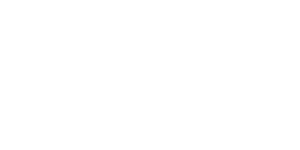

 76%|████████████████████████████████▌          | 45400/60000 [10:36:30<3:17:52,  1.23it/s]

<IPython.core.display.Javascript object>


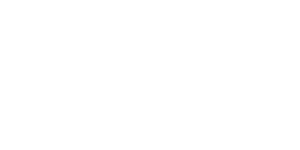

 76%|████████████████████████████████▌          | 45500/60000 [10:37:54<3:16:35,  1.23it/s]

<IPython.core.display.Javascript object>


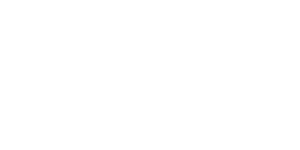

 76%|████████████████████████████████▋          | 45600/60000 [10:39:18<3:15:15,  1.23it/s]

<IPython.core.display.Javascript object>


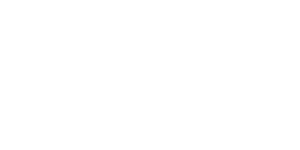

 76%|████████████████████████████████▊          | 45700/60000 [10:40:43<3:13:51,  1.23it/s]

<IPython.core.display.Javascript object>


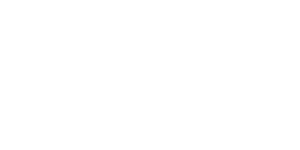

 76%|████████████████████████████████▊          | 45800/60000 [10:42:07<3:12:46,  1.23it/s]

<IPython.core.display.Javascript object>


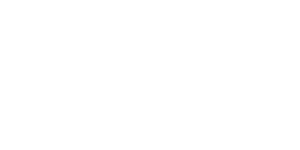

 76%|████████████████████████████████▉          | 45900/60000 [10:43:31<3:11:23,  1.23it/s]

<IPython.core.display.Javascript object>


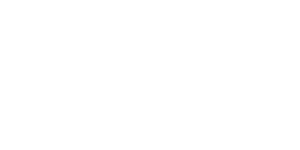

 77%|████████████████████████████████▉          | 46000/60000 [10:44:55<3:09:53,  1.23it/s]

<IPython.core.display.Javascript object>


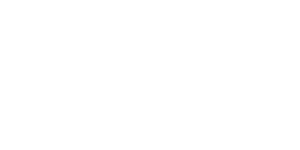

 77%|█████████████████████████████████          | 46100/60000 [10:46:19<3:08:26,  1.23it/s]

<IPython.core.display.Javascript object>


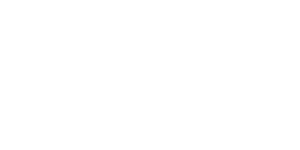

 77%|█████████████████████████████████          | 46200/60000 [10:47:43<3:07:16,  1.23it/s]

<IPython.core.display.Javascript object>


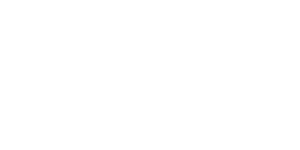

 77%|█████████████████████████████████▏         | 46300/60000 [10:49:08<3:05:49,  1.23it/s]

<IPython.core.display.Javascript object>


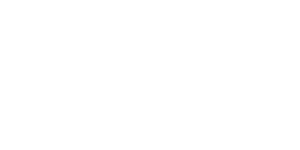

 77%|█████████████████████████████████▎         | 46400/60000 [10:50:32<3:04:22,  1.23it/s]

<IPython.core.display.Javascript object>


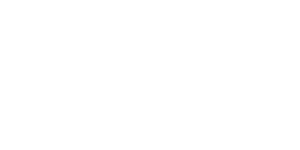

 78%|█████████████████████████████████▎         | 46500/60000 [10:51:56<3:02:59,  1.23it/s]

<IPython.core.display.Javascript object>


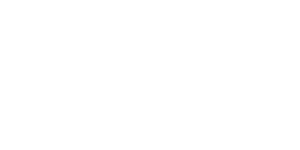

 78%|█████████████████████████████████▍         | 46597/60000 [10:53:17<3:01:39,  1.23it/s]IOPub message rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_msg_rate_limit`.

Current values:
NotebookApp.iopub_msg_rate_limit=1000.0 (msgs/sec)
NotebookApp.rate_limit_window=3.0 (secs)

 91%|███████████████████████████████████████▏   | 54600/60000 [12:45:36<1:13:09,  1.23it/s]

<IPython.core.display.Javascript object>


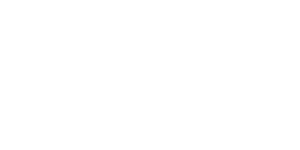

 91%|███████████████████████████████████████▏   | 54700/60000 [12:47:01<1:11:45,  1.23it/s]

<IPython.core.display.Javascript object>


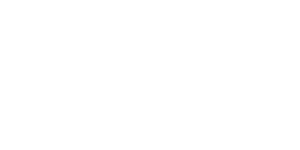

 91%|███████████████████████████████████████▎   | 54800/60000 [12:48:25<1:10:31,  1.23it/s]

<IPython.core.display.Javascript object>


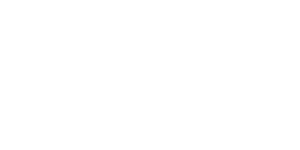

 92%|███████████████████████████████████████▎   | 54900/60000 [12:49:49<1:09:02,  1.23it/s]

<IPython.core.display.Javascript object>


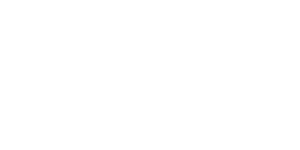

 92%|███████████████████████████████████████▍   | 55000/60000 [12:51:13<1:07:47,  1.23it/s]

<IPython.core.display.Javascript object>


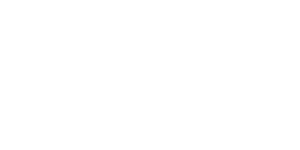

 92%|███████████████████████████████████████▍   | 55100/60000 [12:52:37<1:06:24,  1.23it/s]

<IPython.core.display.Javascript object>


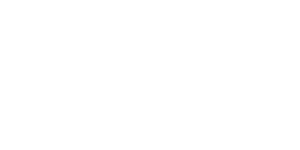

 92%|███████████████████████████████████████▌   | 55200/60000 [12:54:01<1:05:04,  1.23it/s]

<IPython.core.display.Javascript object>


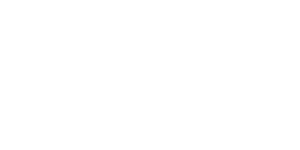

 92%|███████████████████████████████████████▋   | 55300/60000 [12:55:25<1:03:41,  1.23it/s]

<IPython.core.display.Javascript object>


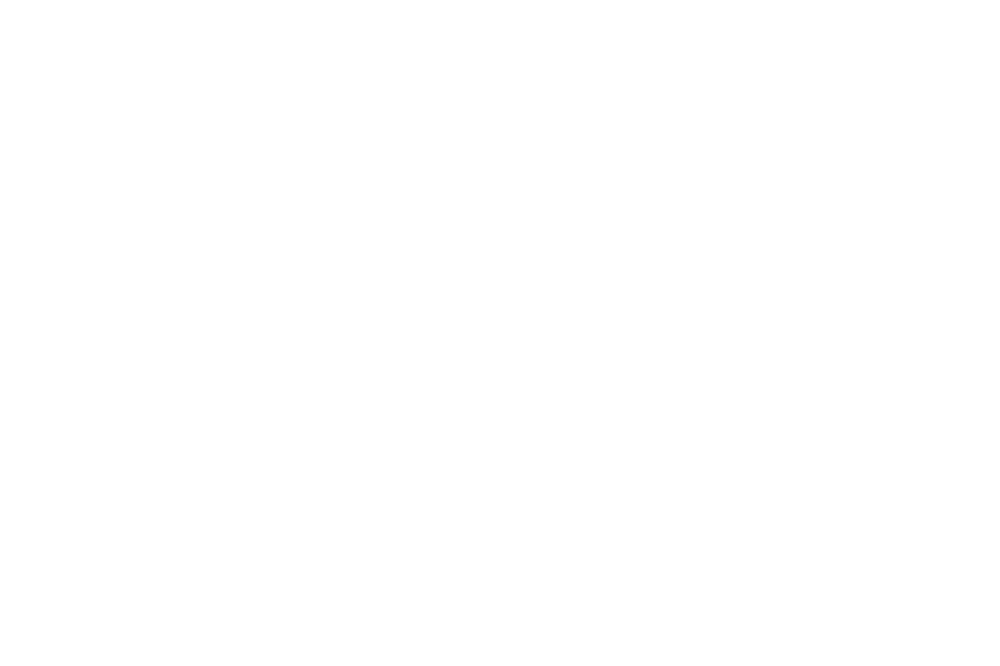

 92%|███████████████████████████████████████▋   | 55400/60000 [12:56:49<1:02:15,  1.23it/s]

<IPython.core.display.Javascript object>


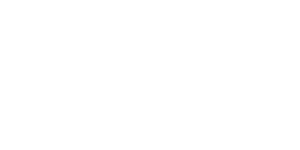

 92%|███████████████████████████████████████▊   | 55500/60000 [12:58:14<1:01:00,  1.23it/s]

<IPython.core.display.Javascript object>


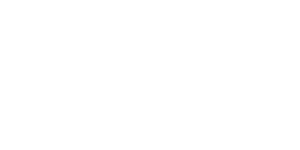

 93%|█████████████████████████████████████████▋   | 55600/60000 [12:59:38<59:40,  1.23it/s]

<IPython.core.display.Javascript object>


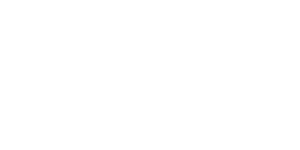

 93%|█████████████████████████████████████████▊   | 55700/60000 [13:01:02<58:13,  1.23it/s]

<IPython.core.display.Javascript object>


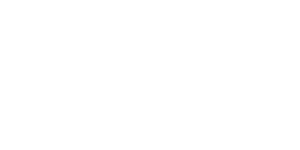

 93%|█████████████████████████████████████████▊   | 55800/60000 [13:02:27<56:51,  1.23it/s]

<IPython.core.display.Javascript object>


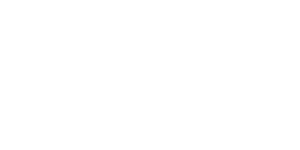

 93%|█████████████████████████████████████████▉   | 55900/60000 [13:03:51<55:30,  1.23it/s]

<IPython.core.display.Javascript object>


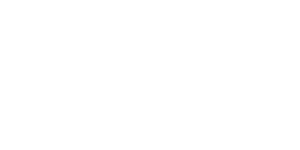

 93%|██████████████████████████████████████████   | 56000/60000 [13:05:15<54:13,  1.23it/s]

<IPython.core.display.Javascript object>


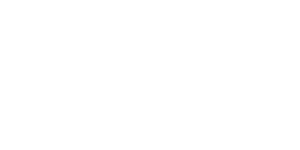

 94%|██████████████████████████████████████████   | 56100/60000 [13:06:39<52:51,  1.23it/s]

<IPython.core.display.Javascript object>


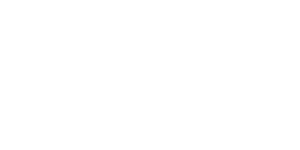

 94%|██████████████████████████████████████████▏  | 56200/60000 [13:08:03<51:30,  1.23it/s]

<IPython.core.display.Javascript object>


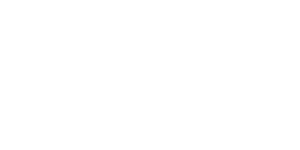

 94%|██████████████████████████████████████████▏  | 56300/60000 [13:09:27<50:10,  1.23it/s]

<IPython.core.display.Javascript object>


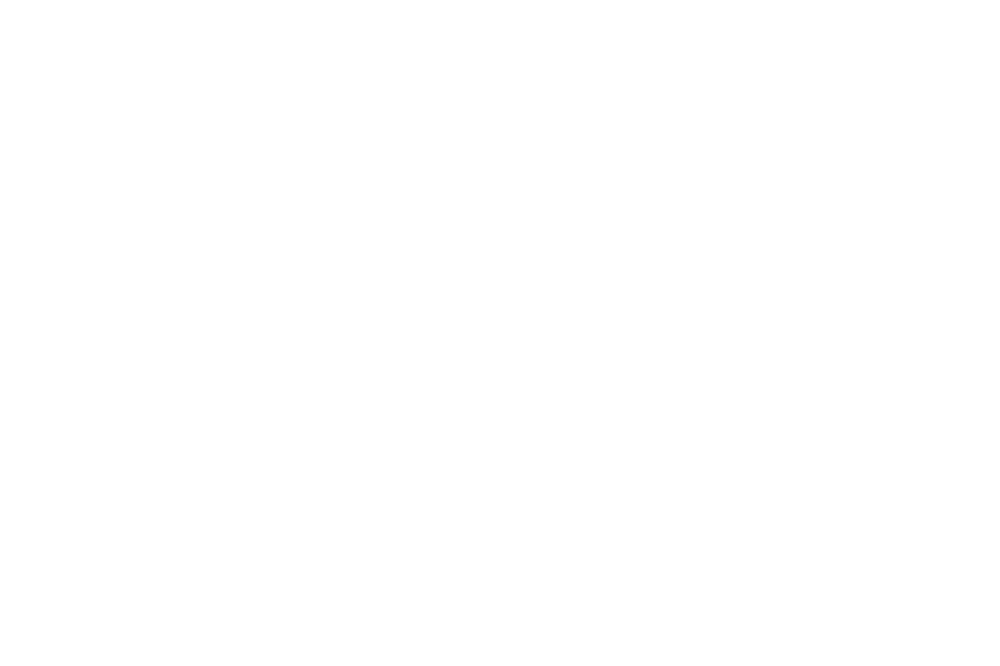

 94%|██████████████████████████████████████████▎  | 56400/60000 [13:10:52<48:47,  1.23it/s]

<IPython.core.display.Javascript object>


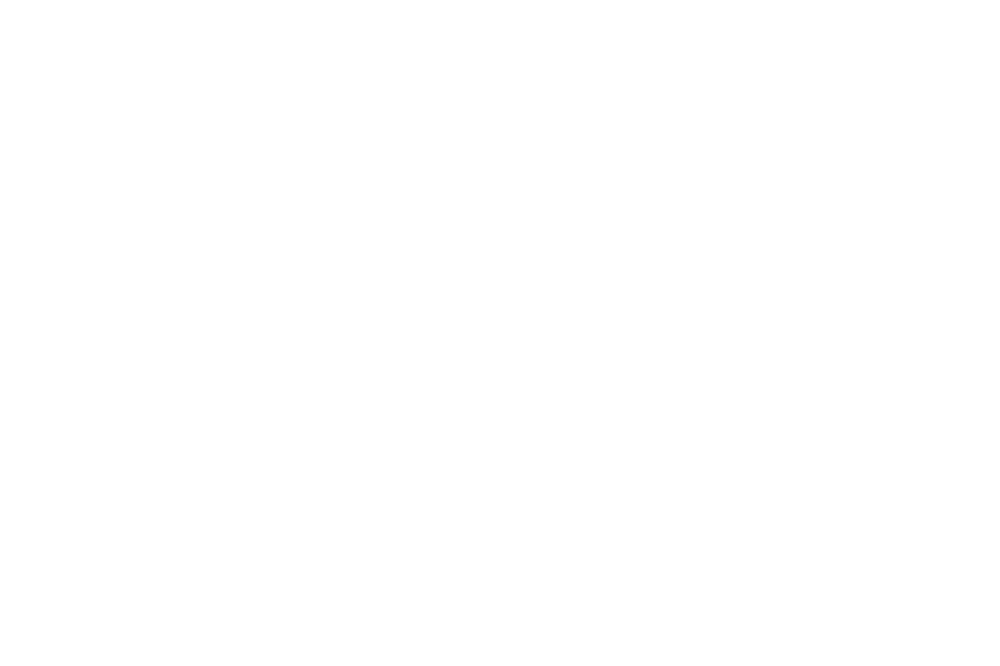

 94%|██████████████████████████████████████████▍  | 56500/60000 [13:12:16<47:25,  1.23it/s]

<IPython.core.display.Javascript object>


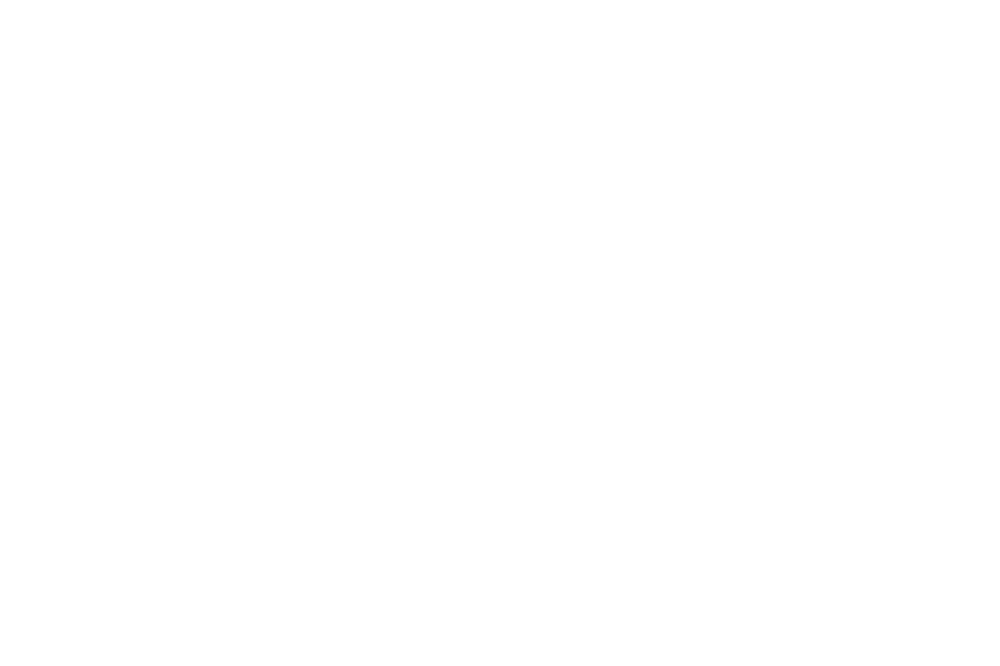

 94%|██████████████████████████████████████████▍  | 56600/60000 [13:13:40<46:06,  1.23it/s]

<IPython.core.display.Javascript object>


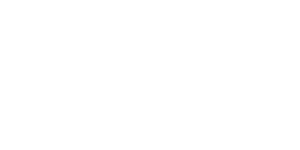

 94%|██████████████████████████████████████████▌  | 56700/60000 [13:15:04<44:43,  1.23it/s]

<IPython.core.display.Javascript object>


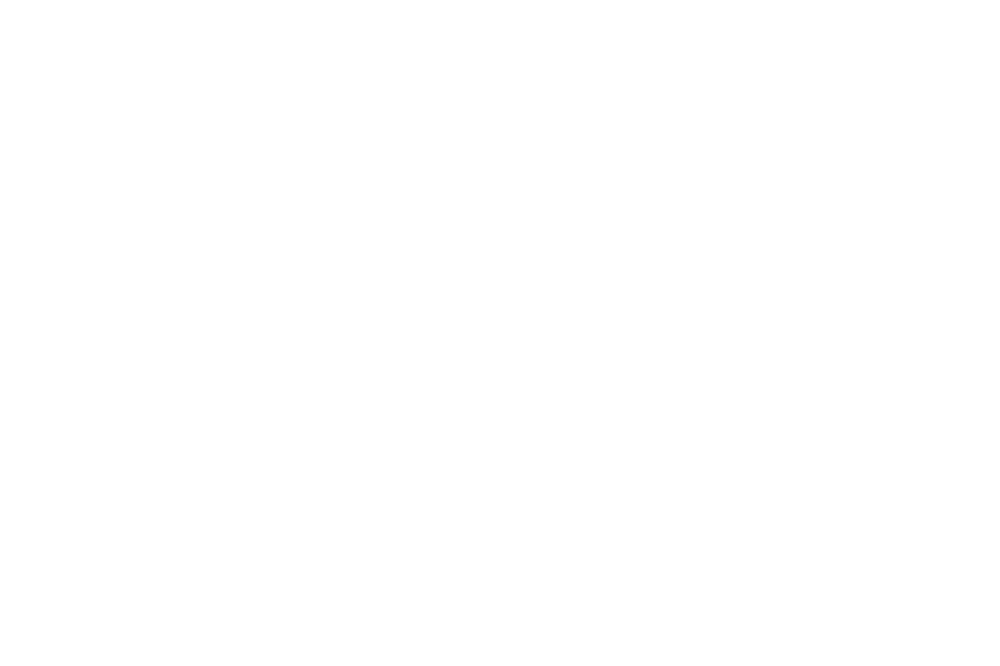

 95%|██████████████████████████████████████████▌  | 56800/60000 [13:16:28<43:21,  1.23it/s]

<IPython.core.display.Javascript object>


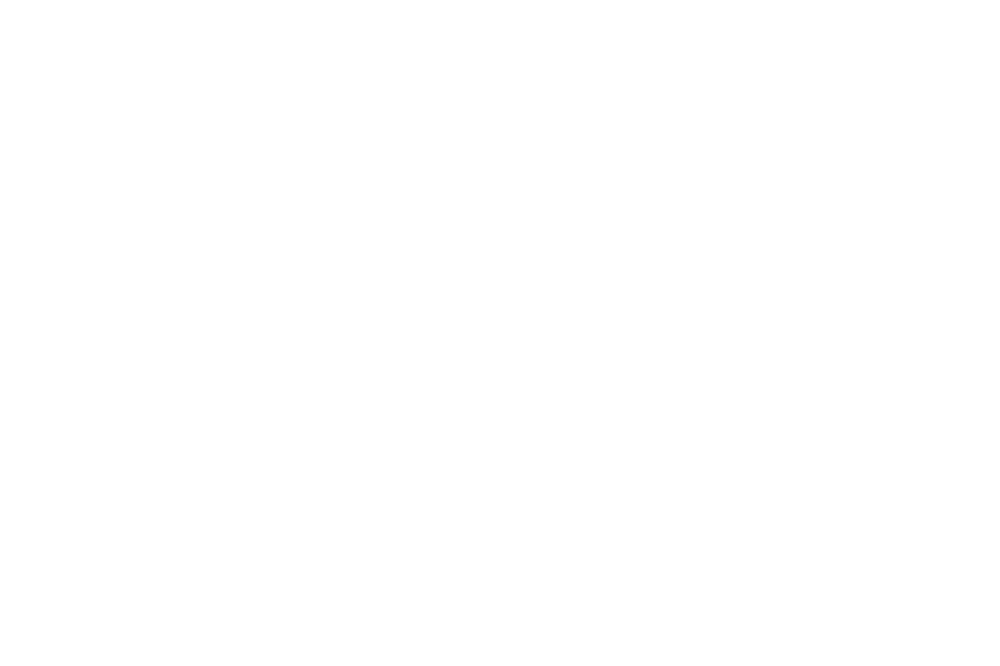

 95%|██████████████████████████████████████████▋  | 56900/60000 [13:17:52<42:04,  1.23it/s]

<IPython.core.display.Javascript object>


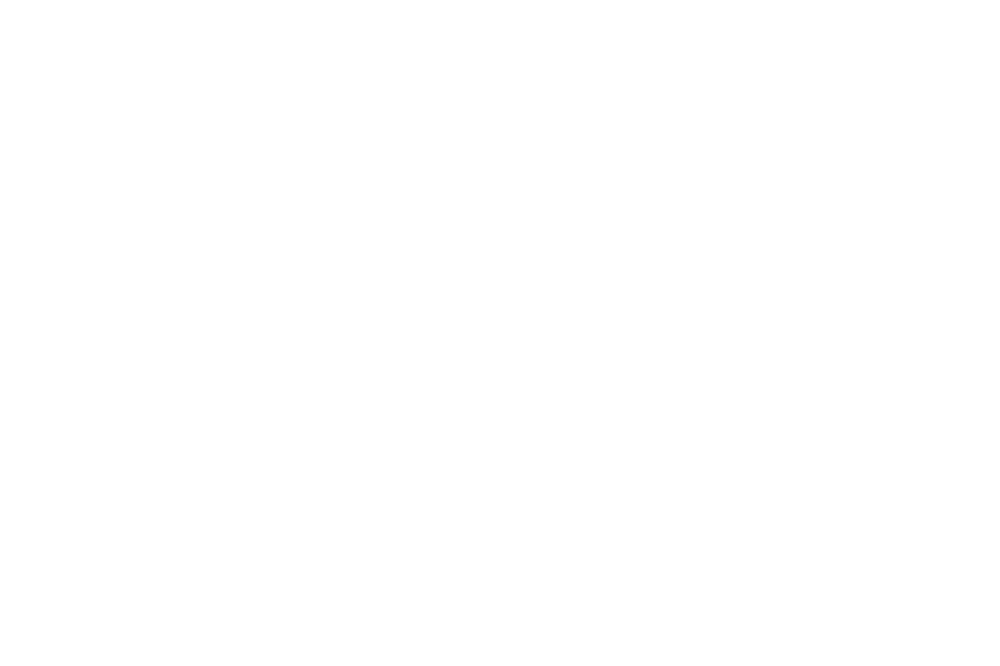

 95%|██████████████████████████████████████████▊  | 57000/60000 [13:19:16<40:40,  1.23it/s]

<IPython.core.display.Javascript object>


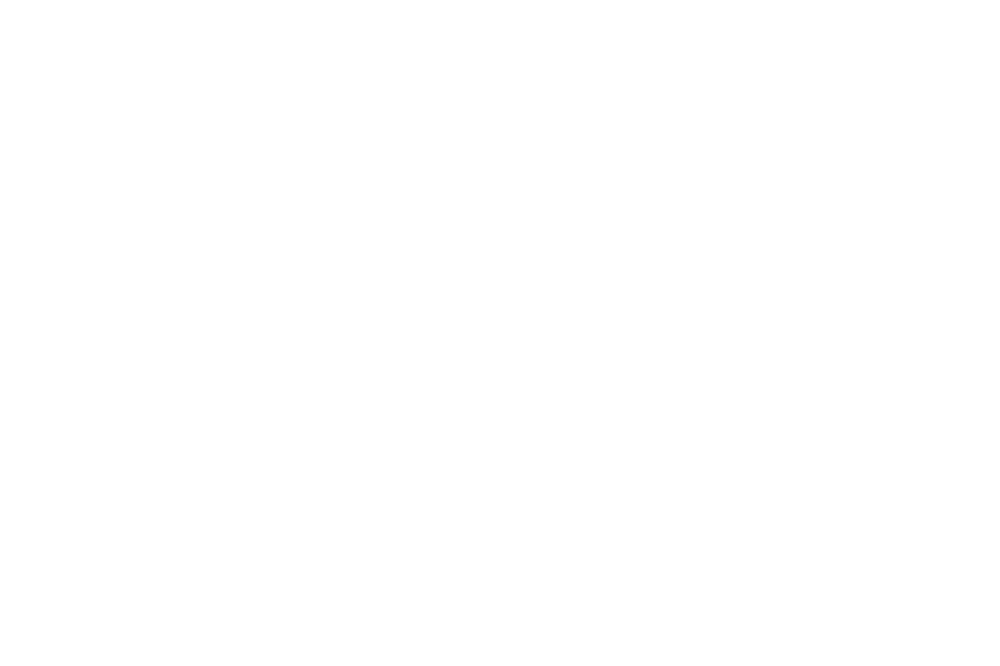

 95%|██████████████████████████████████████████▊  | 57100/60000 [13:20:40<39:19,  1.23it/s]

<IPython.core.display.Javascript object>


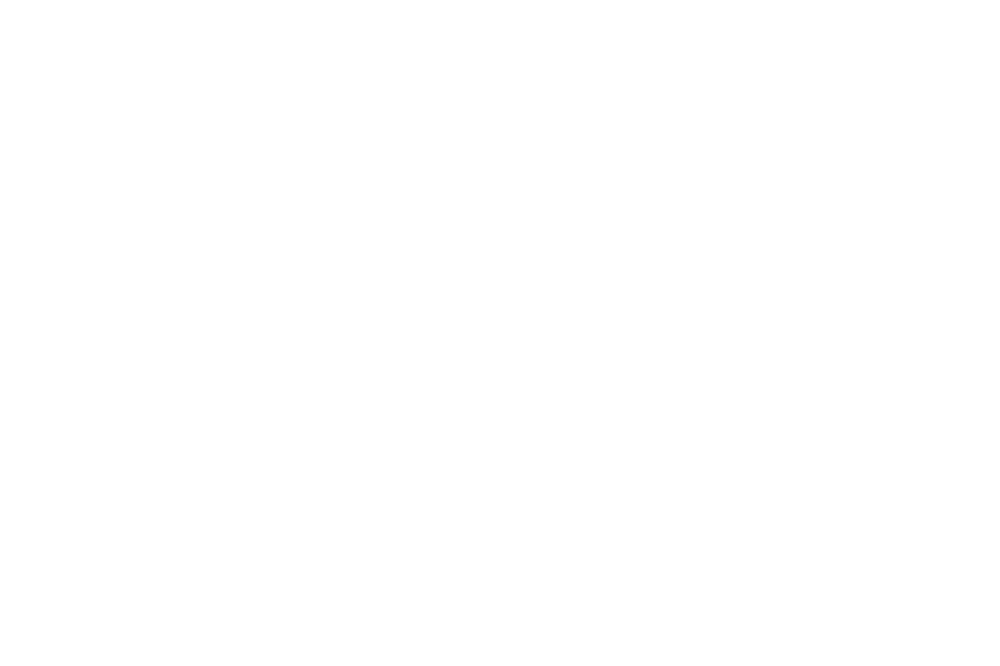

 95%|██████████████████████████████████████████▉  | 57200/60000 [13:22:05<37:57,  1.23it/s]

<IPython.core.display.Javascript object>


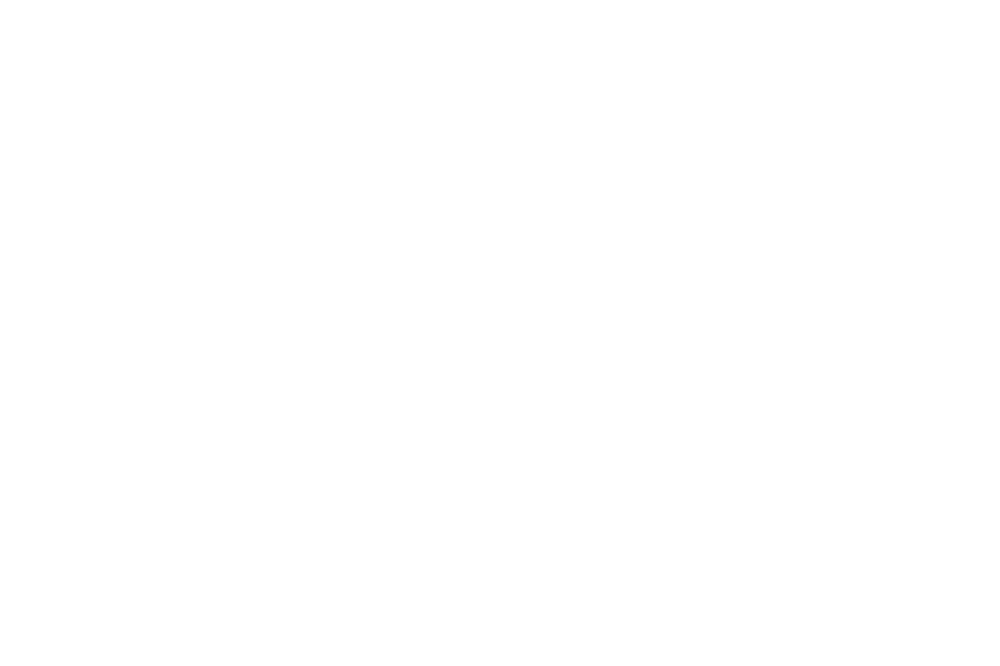

 96%|██████████████████████████████████████████▉  | 57300/60000 [13:23:29<36:35,  1.23it/s]

<IPython.core.display.Javascript object>


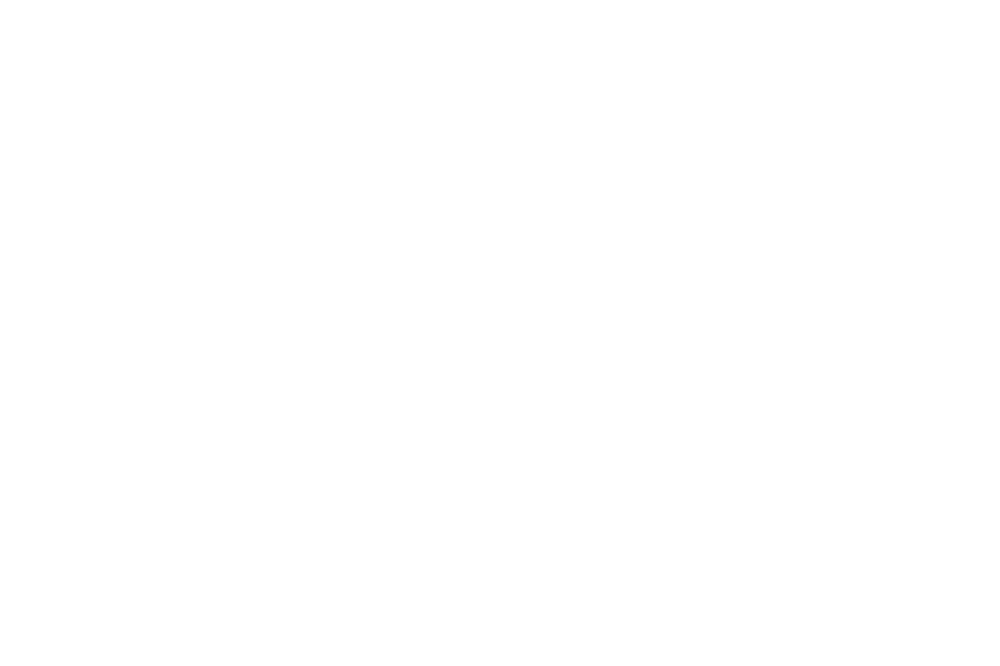

 96%|███████████████████████████████████████████  | 57400/60000 [13:24:53<35:11,  1.23it/s]

<IPython.core.display.Javascript object>


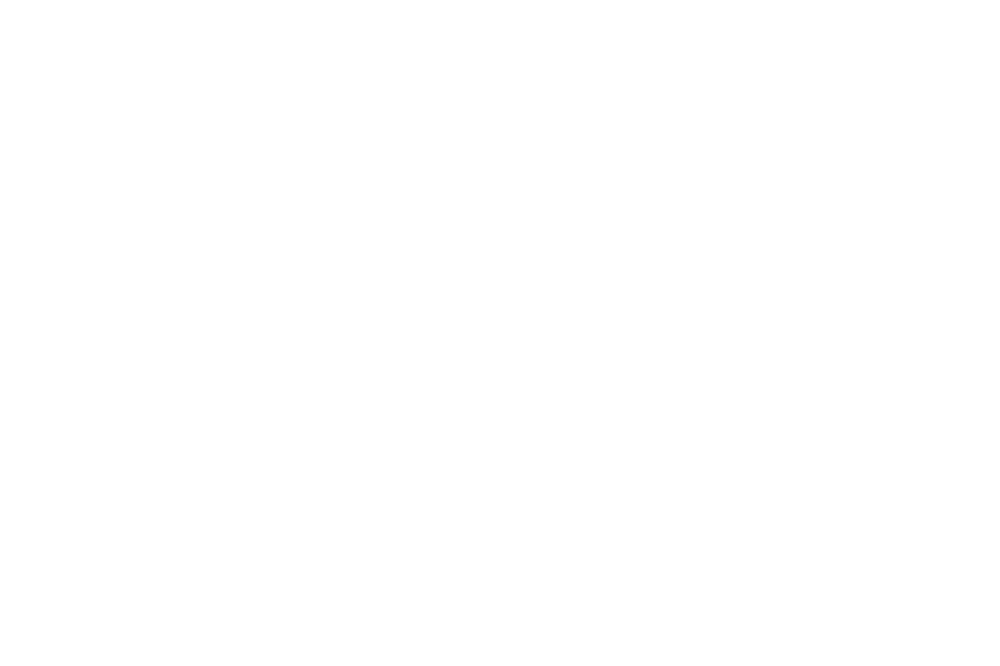

 96%|███████████████████████████████████████████▏ | 57500/60000 [13:26:17<33:51,  1.23it/s]

<IPython.core.display.Javascript object>


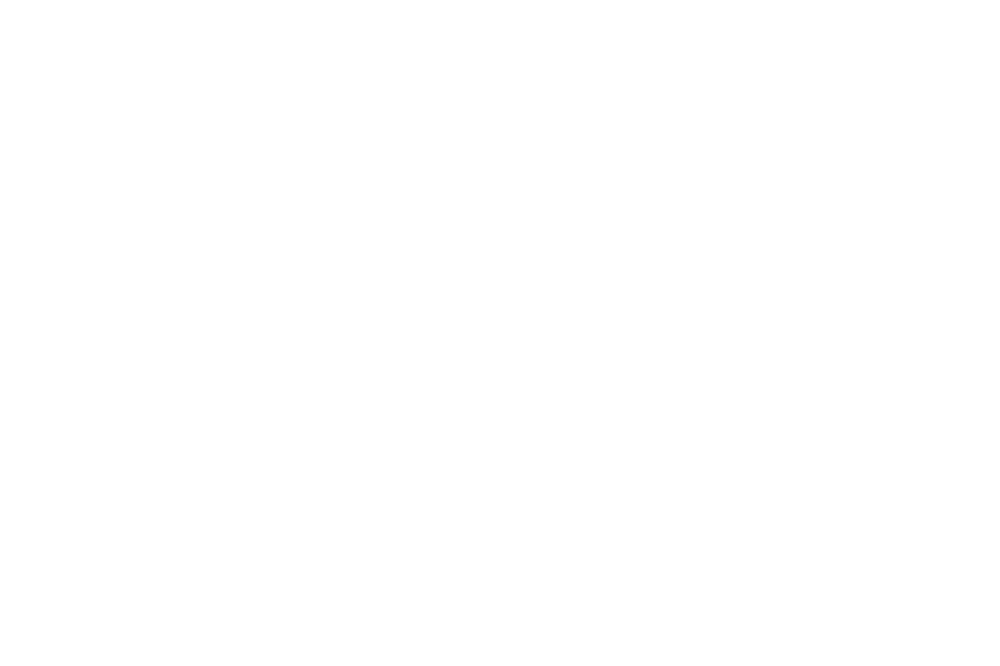

 96%|███████████████████████████████████████████▏ | 57600/60000 [13:27:41<32:29,  1.23it/s]

<IPython.core.display.Javascript object>


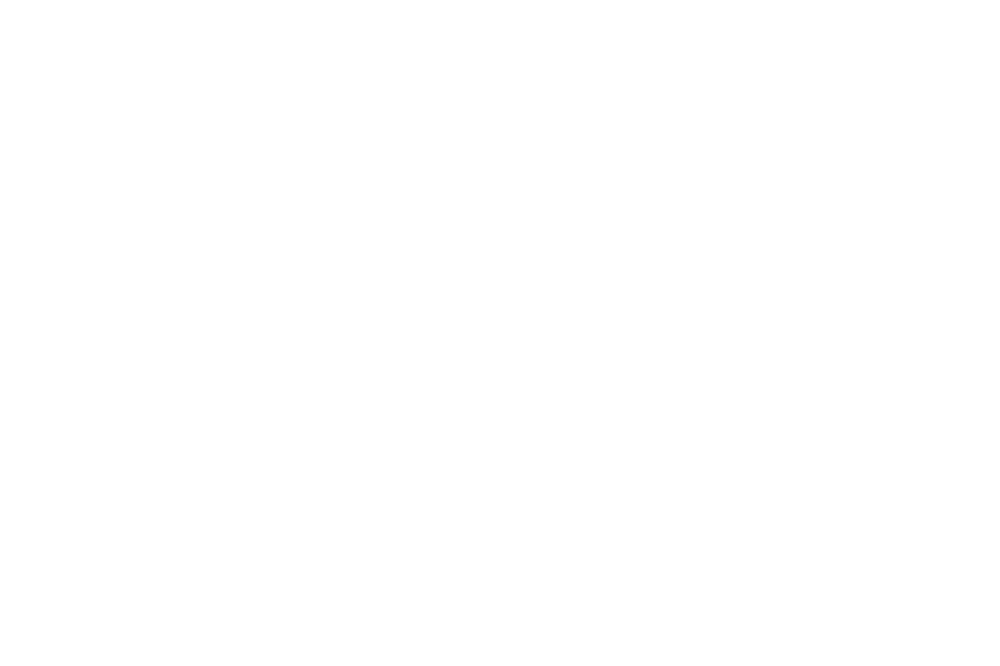

 96%|███████████████████████████████████████████▎ | 57700/60000 [13:29:06<31:11,  1.23it/s]

<IPython.core.display.Javascript object>


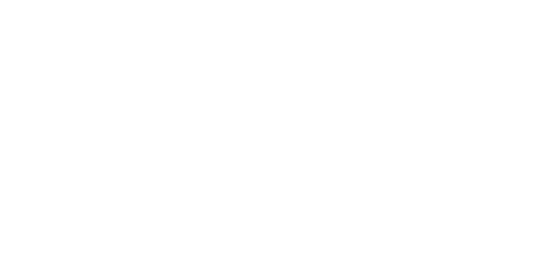

 96%|███████████████████████████████████████████▎ | 57800/60000 [13:30:30<29:46,  1.23it/s]

<IPython.core.display.Javascript object>


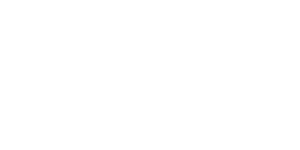

 96%|███████████████████████████████████████████▍ | 57900/60000 [13:31:54<28:26,  1.23it/s]

<IPython.core.display.Javascript object>


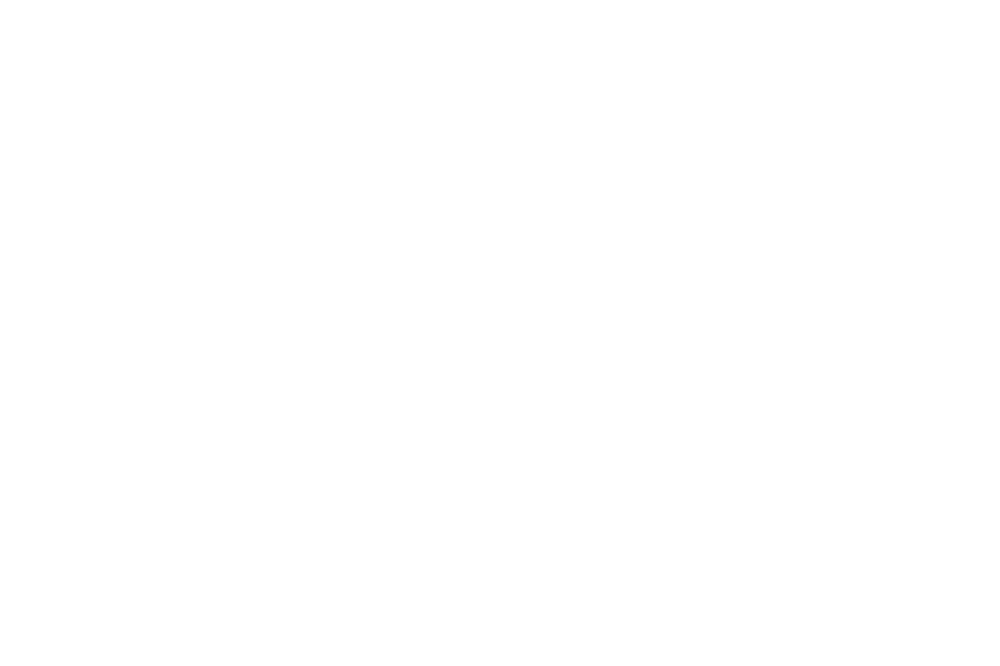

 97%|███████████████████████████████████████████▌ | 58000/60000 [13:33:18<27:04,  1.23it/s]

<IPython.core.display.Javascript object>


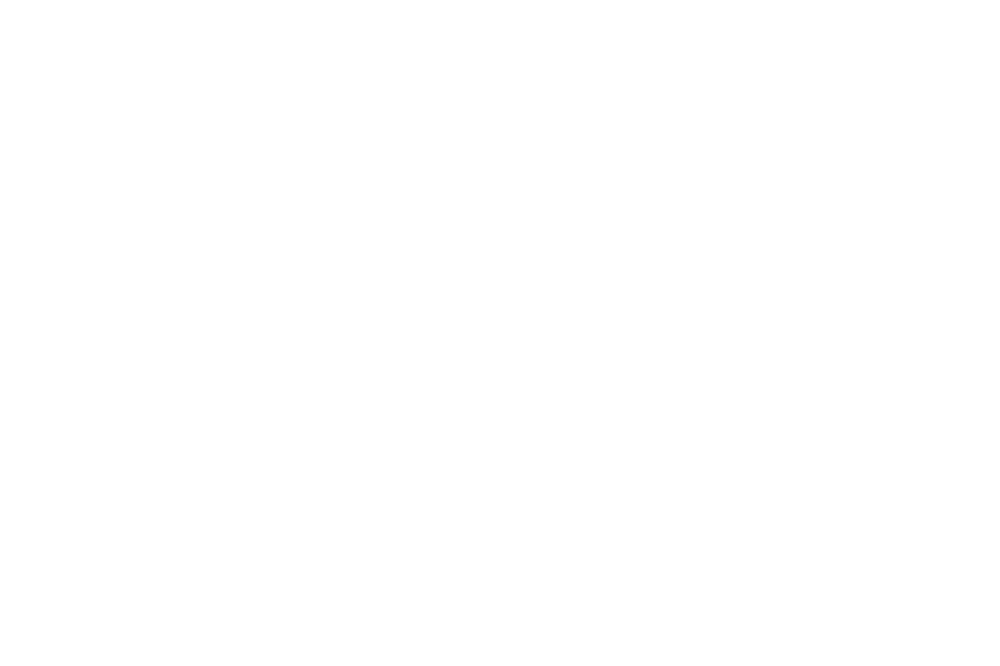

 97%|███████████████████████████████████████████▌ | 58100/60000 [13:34:43<25:43,  1.23it/s]

<IPython.core.display.Javascript object>


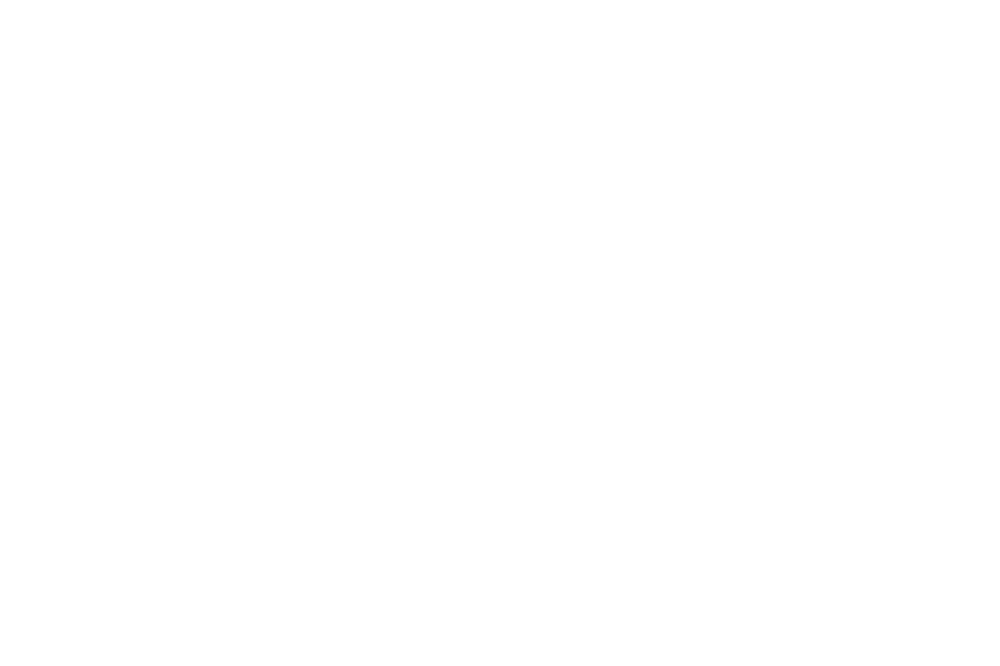

 97%|███████████████████████████████████████████▋ | 58200/60000 [13:36:07<24:21,  1.23it/s]

<IPython.core.display.Javascript object>


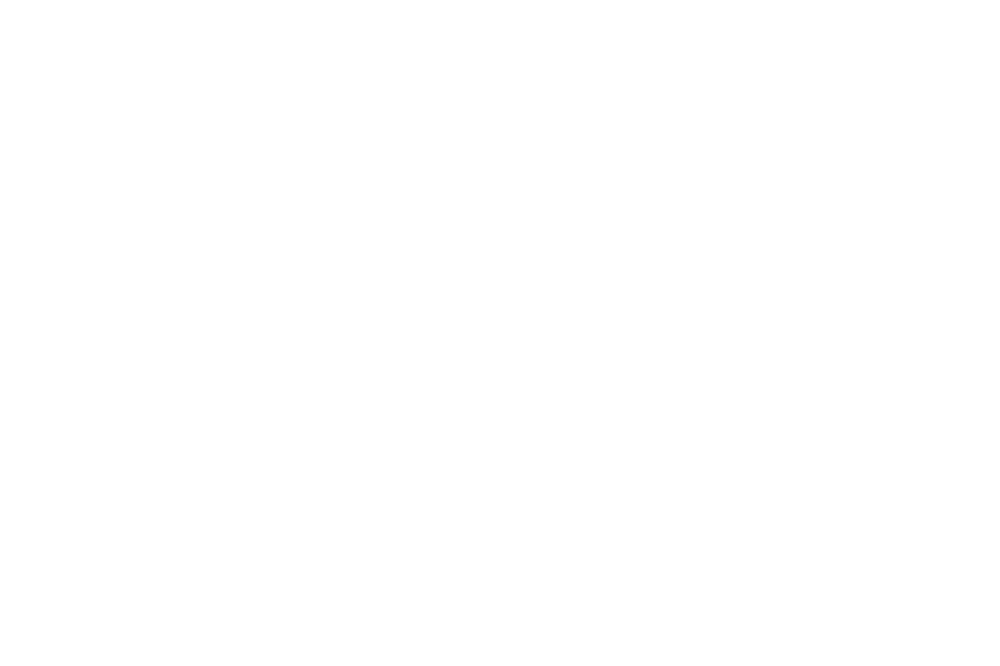

 97%|███████████████████████████████████████████▋ | 58300/60000 [13:37:31<23:01,  1.23it/s]

<IPython.core.display.Javascript object>


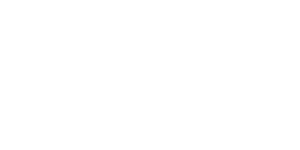

 97%|███████████████████████████████████████████▊ | 58400/60000 [13:38:55<21:39,  1.23it/s]

<IPython.core.display.Javascript object>


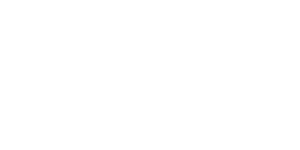

 98%|███████████████████████████████████████████▉ | 58500/60000 [13:40:19<20:18,  1.23it/s]

<IPython.core.display.Javascript object>


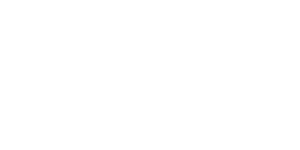

 98%|███████████████████████████████████████████▉ | 58600/60000 [13:41:43<18:56,  1.23it/s]

<IPython.core.display.Javascript object>


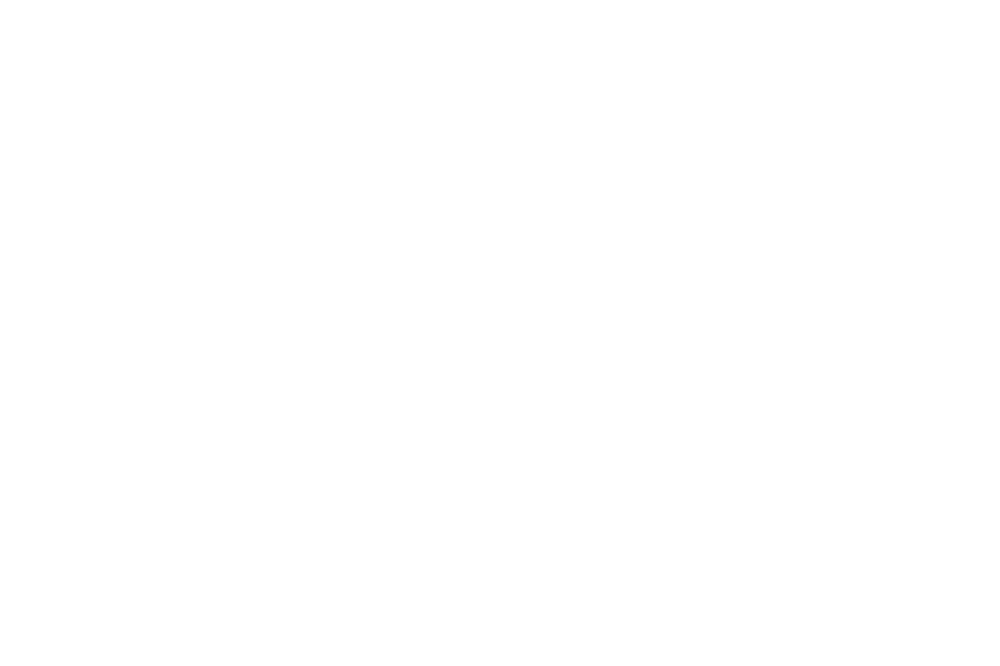

 98%|████████████████████████████████████████████ | 58700/60000 [13:43:08<17:36,  1.23it/s]

<IPython.core.display.Javascript object>


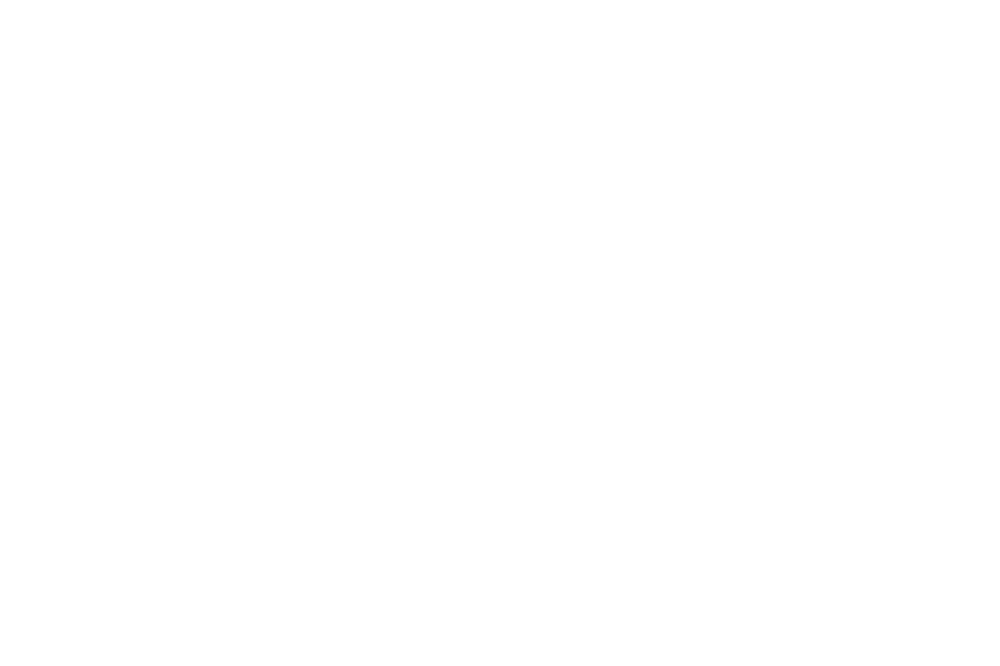

 98%|████████████████████████████████████████████ | 58800/60000 [13:44:32<16:15,  1.23it/s]

<IPython.core.display.Javascript object>


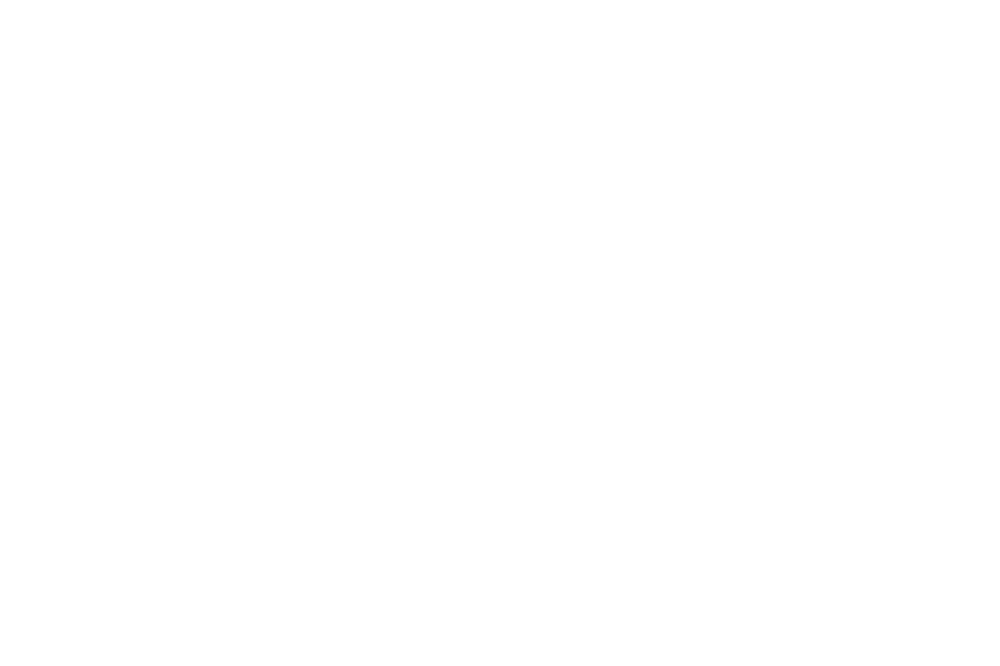

 98%|████████████████████████████████████████████▏| 58900/60000 [13:45:56<14:53,  1.23it/s]

<IPython.core.display.Javascript object>


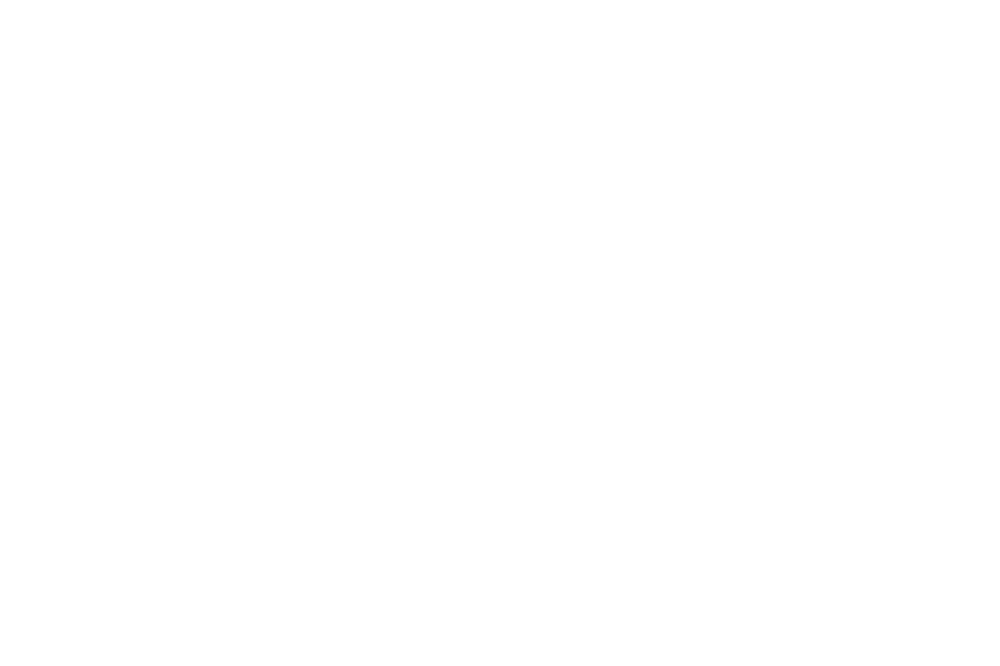

 98%|████████████████████████████████████████████▎| 59000/60000 [13:47:20<13:32,  1.23it/s]

<IPython.core.display.Javascript object>


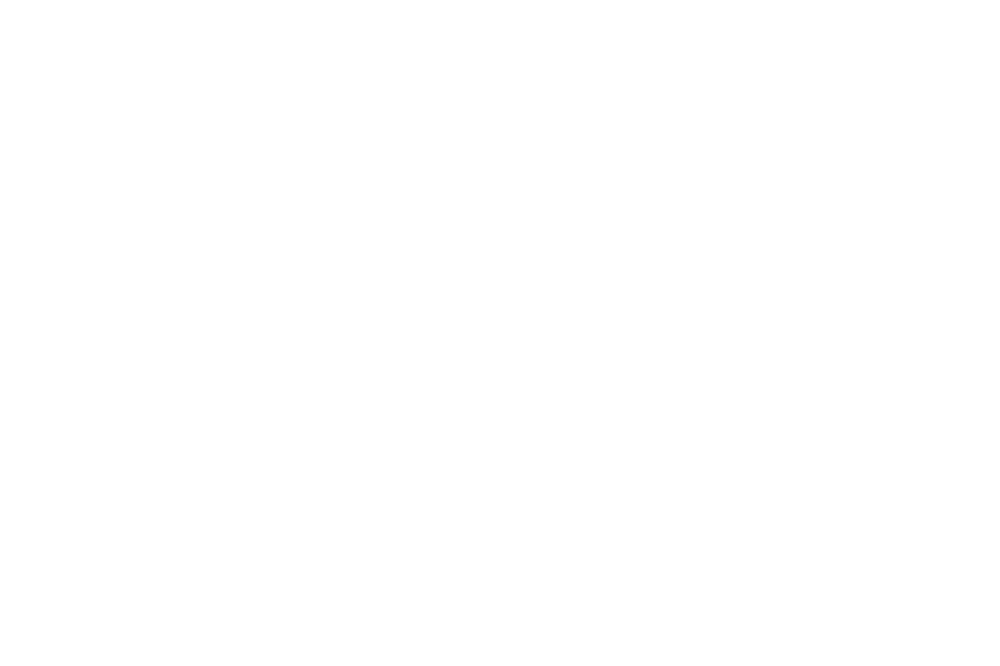

 98%|████████████████████████████████████████████▎| 59100/60000 [13:48:44<12:12,  1.23it/s]

<IPython.core.display.Javascript object>


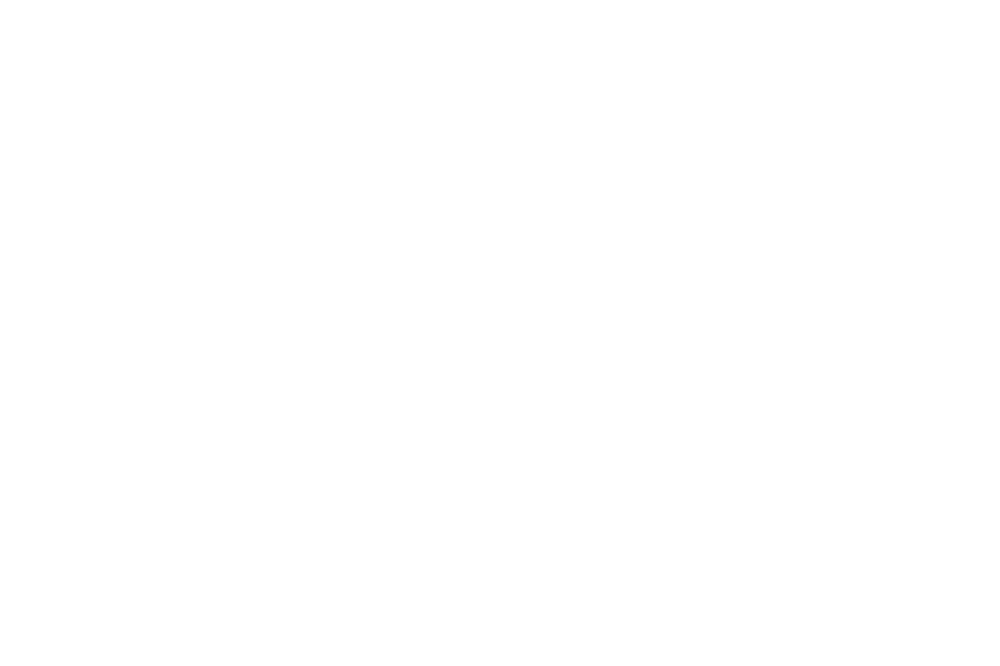

 99%|████████████████████████████████████████████▍| 59200/60000 [13:50:08<10:50,  1.23it/s]

<IPython.core.display.Javascript object>


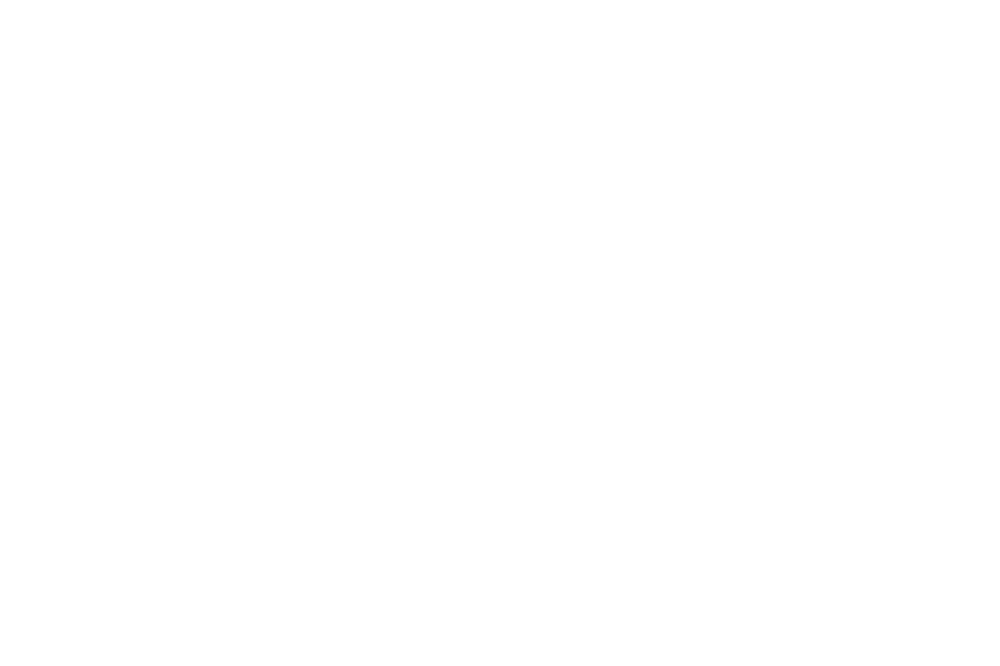

 99%|████████████████████████████████████████████▍| 59300/60000 [13:51:33<09:29,  1.23it/s]

<IPython.core.display.Javascript object>


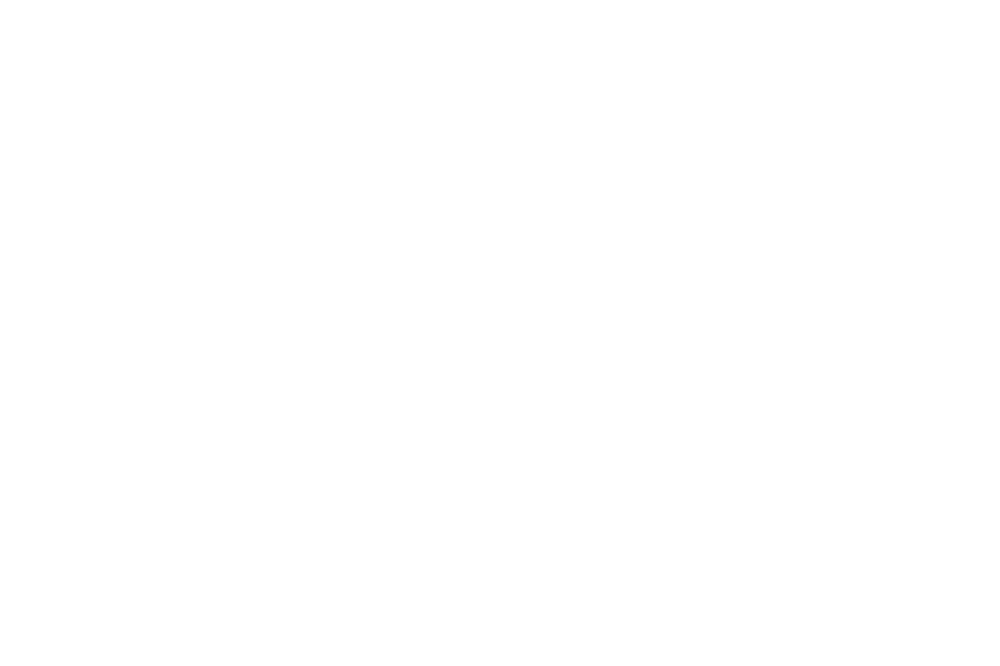

 99%|████████████████████████████████████████████▌| 59400/60000 [13:52:57<08:07,  1.23it/s]

<IPython.core.display.Javascript object>


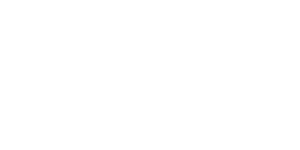

 99%|████████████████████████████████████████████▋| 59500/60000 [13:54:21<06:46,  1.23it/s]

<IPython.core.display.Javascript object>


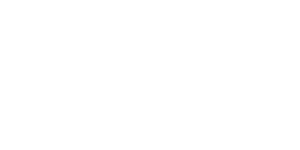

 99%|████████████████████████████████████████████▋| 59600/60000 [13:55:45<05:25,  1.23it/s]

<IPython.core.display.Javascript object>


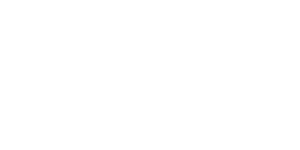

100%|████████████████████████████████████████████▊| 59700/60000 [13:57:09<04:04,  1.23it/s]

<IPython.core.display.Javascript object>


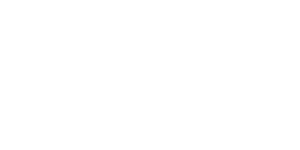

100%|████████████████████████████████████████████▊| 59800/60000 [13:58:34<02:42,  1.23it/s]

<IPython.core.display.Javascript object>


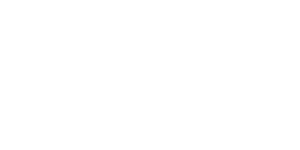

100%|████████████████████████████████████████████▉| 59900/60000 [13:59:58<01:21,  1.23it/s]

<IPython.core.display.Javascript object>


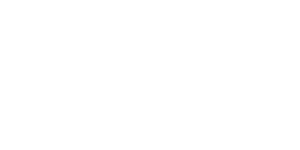

100%|█████████████████████████████████████████████| 60000/60000 [14:01:23<00:00,  1.19it/s]


'/scratch/ondemand28/len/data/radjax/MAPS/recovery_Len/MAPS_CO_VisMCMC/HD163296_CO(2-1)/Len_MAPS_CO_VisMCMC_vlsr_5760ms.no_blur.iso_abundance_1.2025-04-23.00:40:28/checkpoint_60000'

In [12]:
log_cadance = 100
ckpt_cadance = 10000
num_test_images = 10

key = jax.random.key(hparams['seed'])
batch_indices = jax.random.randint(key, (hparams['num_iters'], hparams['batchsize']), minval=0, maxval=num_freqs)
test_indices = np.arange(0, num_freqs, num_freqs // num_test_images)[:num_test_images]

# Initialize logging and checkpoint directories
logdir = data_dir.joinpath('recovery_Len/MAPS_CO_VisMCMC/{}/{}.{}'.format(hparams['disk_name'], hparams['run_name'], hparams['datetime']))
checkpoint_dir = logdir.absolute()
writer = tensorboardX.SummaryWriter(logdir=logdir)

yaml = YAML(typ='safe')
yaml.default_flow_style = False
with open(logdir.joinpath('hparams.yaml'), 'w') as file:
    yaml.dump(hparams, file)
    
# Add some intial logging of data, parametric residuals etc
i_min, i_max = data[test_indices].min(),  data[test_indices].max()
t_min, t_max = temperature.min(), temperature.max()
writer.add_image('temperature/parametric', intensity_to_nchw(temperature, t_min, t_max), global_step=0)
writer.add_images('fluxes/data', intensity_to_nchw(data[test_indices], i_min, i_max), global_step=0)
writer.add_images('fluxes/parametric', intensity_to_nchw(images_blurred[test_indices], i_min, i_max), global_step=0)
writer.add_images('fluxes/parametric_residual', intensity_to_nchw(np.abs(data[test_indices]-images_blurred[test_indices]), cmap='inferno'), global_step=0)

train_steps = []
train_losses = []

from tqdm import trange
for step in trange(len(batch_indices)):
    batch = batch_indices[step]
    if (step % log_cadance) == 0:
        current_state = jax.device_get(flax.jax_utils.unreplicate(state))
        current_params = current_state.params

        temperature_nn = np.array(predictor.apply({'params': current_params}, neural_temp.coords).reshape(neural_temp.disk_shape))
        test_images = np.array(neural_temp.image_prediction(current_params, predictor.apply, freqs[test_indices]))
        writer.add_image('temperature/neural', intensity_to_nchw(temperature_nn, t_min, t_max), global_step=step)
        writer.add_images('fluxes/neural', intensity_to_nchw(test_images, i_min, i_max), global_step=step)
        writer.add_images('fluxes/neural_residual', intensity_to_nchw(np.abs(data[test_indices]-test_images), cmap='inferno'), global_step=step)
        writer.add_scalar('test_datafit/neural', np.mean((data[test_indices]-test_images)**2), global_step=step)
        writer.add_scalar('test_datafit/parametric', np.mean((data[test_indices]-images_blurred[test_indices])**2), global_step=step)

    if (step % ckpt_cadance) == 0:
        print("Saved checkpoint for step", step)
        current_state = jax.device_get(flax.jax_utils.unreplicate(state))
        checkpoints.save_checkpoint(checkpoint_dir, current_state, step, keep=3, overwrite=True)

    loss, state = grad_pmap(loss_fn, neural_temp.image_prediction, state, shard(data[batch]), shard(freqs[batch]), hparams['sigma'])
    writer.add_scalar('log_loss', np.log10(np.mean(loss)), global_step=step)
    train_steps.append(step)
    train_losses.append(loss)
    
    if (step % log_cadance) == 0:
        plt.figure("training loss", figsize=(6,4))
        plt.plot(train_steps, train_losses, "-o", ms=2, label="train")
        plt.xlabel("step")
        plt.ylabel("loss")
        plt.yscale("log")
        plt.legend(loc="upper right")
        plt.tight_layout()
        plt.savefig("./current_NERF_run_loss.png")
        plt.close()
    

# Save final state
current_state = jax.device_get(flax.jax_utils.unreplicate(state))
checkpoints.save_checkpoint(checkpoint_dir, current_state, step+1, keep=3)

In [14]:
logdir

PosixPath('/scratch/ondemand28/len/data/radjax/MAPS/recovery_Len/neural_temperature_uncertainty/HD163296_CO(2-1)/Len_uncertainty_SGD_with_full_cube.vlsr_5760ms.no_blur.iso_abundance_1.2025-04-17.08:21:46')

# Analyze checkpoint

In [11]:
import glob
# '/scratch/ondemand28/len/data/radjax/MAPS/recovery_Len/neural_temperature_uncertainty/HD163296_CO(2-1)/Len_uncertainty_SGD_with_full_cube.vlsr_5760ms.no_blur.iso_abundance_1.2025-04-17.08:21:46'
checkpoint_dir = Path('/scratch/ondemand28/len/data/radjax/MAPS/recovery_Len/MAPS_CO_VisMCMC/HD163296_CO(2-1)/Len_MAPS_CO_VisMCMC_vlsr_5760ms.no_blur.iso_abundance_1.2025-04-23.00:40:28/')
ckpt_iter = np.max([int(Path(ckpt).name.split('_')[-1]) for ckpt in glob.glob(str(checkpoint_dir.joinpath('checkpoint_*')))])

with open(checkpoint_dir.joinpath('hparams.yaml'), 'r') as stream:
    hparams = YAML(typ='safe').load(stream)

predictor = network.PixelPredictor(
    scale=np.array([hparams['z_max'], hparams['r_max']]), posenc_deg=hparams['posenc_deg'], 
    min_val=hparams['min_temp'], max_val=hparams['max_temp'], offset=hparams['offset']
)

coords = jnp.stack((z_disk, r_disk), axis=-1).reshape(-1,2)
checkpoint_params = checkpoints.restore_checkpoint(checkpoint_dir, None)['params']
temperature_nn = np.array(predictor.apply({'params': checkpoint_params}, coords).reshape(resolution, resolution))

nd_h2_nn = parametric_disk.number_density_profile(
    z_disk, r_disk, temperature_nn, disk.gamma, disk.r_in, 10**disk.log_r_c, disk.M_gas, disk.M_star, disk.m_mol
)
velocity_az_nn = disk.velocity(z_disk, r_disk, nd_h2_nn, temperature_nn)

# Compute the column integrated density N(h2) (units of 1/cm^2)
N_h2_nn = parametric_disk.surface_density(z_disk, nd_h2_nn)

# Compute the relative abundance of co
abundance_co_nn = disk.co_abundance_profile(N_h2_nn, temperature_nn)
nd_co_nn = abundance_co_nn * nd_h2_nn

sigma_h2_nn = N_h2_nn * m_h

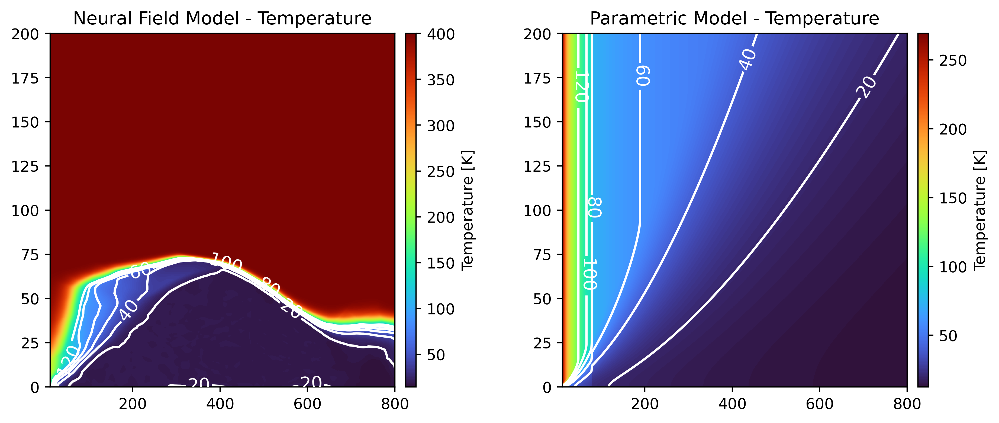

In [278]:
# %matplotlib notebook
levels = [20, 40, 60, 80, 100, 120]
fig, axes = plt.subplots(1, 2, figsize=(9,4), dpi=400)
titles = ['Neural Field Model - Temperature', 'Parametric Model - Temperature']
images = [temperature_nn, temperature]
for ax, img, title in zip(axes, images, titles):
    im = ax.imshow(img, origin='lower', extent=extent_pos, cmap='turbo', aspect='auto')
    divider = make_axes_locatable(ax)
    cax = divider.append_axes('right', size='3%', pad=0.1)
    cbar = fig.colorbar(im, cax=cax, label='Temperature [K]')
    cp = ax.contour(r_disk, z_disk, img, levels=levels, colors='white')
    ax.clabel(cp, levels, inline=1, fontsize=12);
    ax.set_title(title.format(disk.name))
plt.tight_layout()
fig.subplots_adjust(left=0.05, right=0.95, wspace=0.4)


<IPython.core.display.Javascript object>


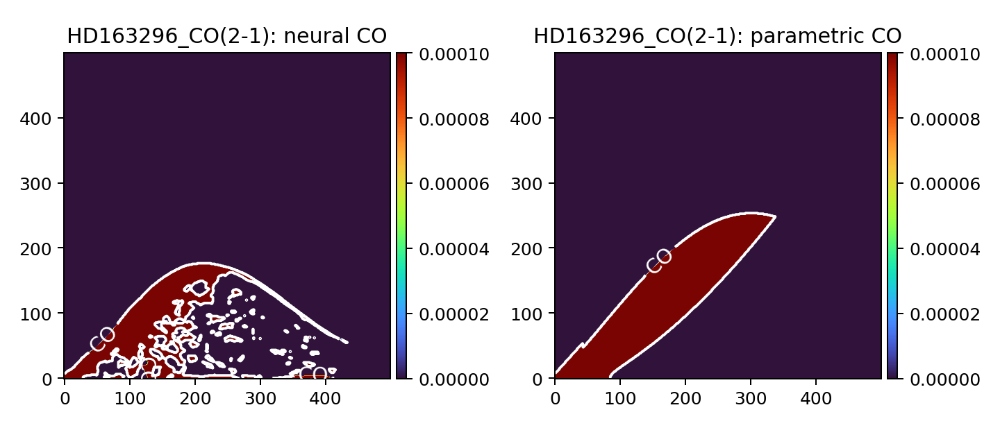

In [15]:
%matplotlib notebook
fig, axes = plt.subplots(1, 2, figsize=(8,3.5))
titles = ['{}: neural CO', '{}: parametric CO']
images = images = [abundance_co_nn, abundance_co]
for ax, img, title in zip(axes, images, titles):
    im = ax.imshow(img, origin='lower', cmap='turbo')
    divider = make_axes_locatable(ax)
    cax = divider.append_axes('right', size='3%', pad=0.05)
    cbar = fig.colorbar(im, cax=cax)
    cp = ax.contour(img, levels=[disk.co_abundance/2], colors='white')
    ax.clabel(cp, levels=[disk.co_abundance/2], fmt='CO', inline=1, fontsize=12);
    ax.set_title(title.format(disk.name))
plt.tight_layout()

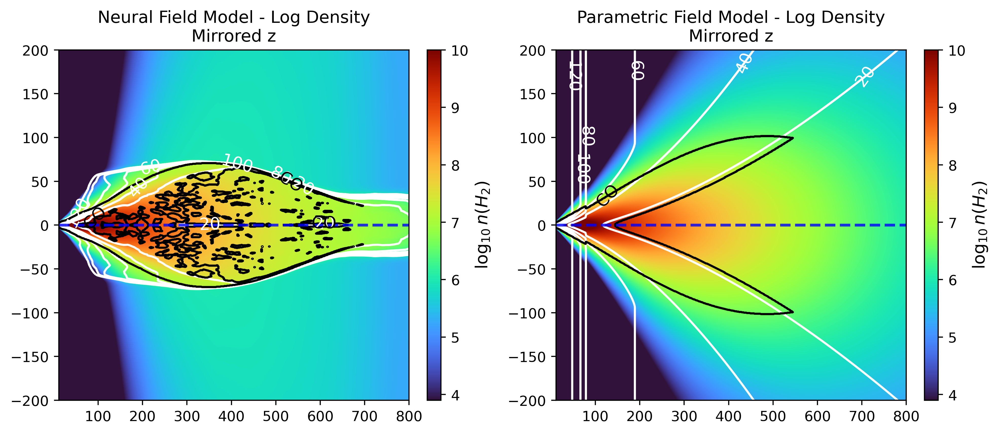

In [282]:
# %matplotlib notebook
fig, axes = plt.subplots(1,2, figsize=(10,4), dpi=400,  )
im = axes[0].imshow(np.log10(nd_h2_nn), origin='lower', cmap='turbo', extent=[r_disk.min(), r_disk.max(), z_disk.min(), z_disk.max()], vmin=3.9, vmax=10, aspect=3);
divider = make_axes_locatable(axes[0])
cax = divider.append_axes('right', size='2%', pad=-1.5)
cbar = fig.colorbar(im, cax=cax)
cbar.set_label(r'$\log_{10} n(H_2)$', fontsize=12)

levels = [20, 40, 60, 80, 100, 120]
cp = axes[0].contour(r_disk, z_disk, temperature_nn, levels, colors='white')
axes[0].clabel(cp, levels, inline=1, fontsize=12);
cp = axes[0].contour(r_disk, z_disk, abundance_co_nn, levels=[disk.co_abundance/2], colors='black')
axes[0].clabel(cp, levels=[disk.co_abundance/2], fmt='CO', inline=1, fontsize=12);
# cp = axes[0].contour(r_disk, z_disk, sigma_h2_nn, levels=[0.01, 0.1], colors='black', linestyles='dotted')

im = axes[1].imshow(np.log10(nd_h2), origin='lower', cmap='turbo', extent=[r_disk.min(), r_disk.max(), z_disk.min(), z_disk.max()], vmin=3.9, vmax=10, aspect=3);
divider = make_axes_locatable(axes[1])
cax = divider.append_axes('right', size='2%', pad=-1.5)
cbar = fig.colorbar(im, cax=cax)
cbar.set_label(r'$\log_{10} n(H_2)$', fontsize=12)

cp = axes[1].contour(r_disk, z_disk, temperature, levels, colors='white')
axes[1].clabel(cp, levels, inline=1, fontsize=12);
cp = axes[1].contour(r_disk, z_disk, abundance_co, levels=[disk.co_abundance/2], colors='black')
axes[1].clabel(cp, levels=[disk.co_abundance/2], fmt='CO', inline=1, fontsize=12);
# cp = axes[1].contour(r_disk, z_disk, sigma_h2, levels=[0.01, 0.1], colors='black', linestyles='dotted')

# 1) choose the channel
f_idx = 8  # <-- the frequency channel you care about

# 2) get that channel's sky‐image
# sky_slice = images[f_idx]        # shape (ny, nx)

# # 3) pick some pixels to plot rays for:
# #    e.g. only those above, say, 20% of the peak flux
threshold = 0 * sky_slice.max()
mask = sky_slice > threshold     # boolean (ny,nx)

# # 4) optionally, collect their indices and limit to at most 25 rays
coords = np.column_stack(np.where(mask))
if len(coords) > 5:
#     sel = np.random.choice(len(coords), 5, replace=False)
    sel = [2000, -1]
    coords = coords[sel]

zmax = z_disk.max()
rmin, rmax = r_disk.min(), r_disk.max()
levels = [20,40,60,80,100,120]
# 5) plot them on top of your z–r axes

ax = axes[0]

# 1) clear the old image and set the new extent
#    show z from -zmax to +zmax:
extent_pos = [rmin, rmax, 0,      zmax]
extent_neg = [rmin, rmax, -zmax,  0   ]

# 2) plot the top half (z>0) as before
im1 = ax.imshow(np.log10(nd_h2_nn), origin='lower', cmap='turbo',
                extent=extent_pos, vmin=3.9, vmax=10, aspect=(rmax-rmin)/(2*zmax))
# 3) plot the bottom half by flipping vertically
im2 = ax.imshow(np.log10(nd_h2_nn[::-1,:]), origin='lower', cmap='turbo',
                extent=extent_neg, vmin=3.9, vmax=10, aspect=(rmax-rmin)/(2*zmax))

ax.set_title("Neural Field Model - Log Density\nMirrored z")
# 4) now overlay your contours twice
#    top half:
ax.contour(r_disk,  z_disk, temperature_nn,  levels, colors='white')
ax.contour(r_disk,  z_disk, abundance_co_nn, levels=[disk.co_abundance/2], colors='black')
# ax.contour(r_disk,  z_disk, sigma_h2_nn, levels=[0.01,0.1],           colors='black', linestyles='dotted')
#    bottom half (mirror z→−z)
ax.contour(r_disk, -z_disk, temperature_nn,  levels, colors='white')
ax.contour(r_disk, -z_disk, abundance_co_nn, levels=[disk.co_abundance/2], colors='black')
# ax.contour(r_disk, -z_disk, sigma_h2_nn, levels=[0.01,0.1],           colors='black', linestyles='dotted')

ax.set_xlim(rmin, rmax)
ax.set_ylim(-zmax, zmax)


    
ax = axes[1]   # or whichever panel you want

ax.set_title("Parametric Field Model - Log Density\nMirrored z")

im1 = ax.imshow(np.log10(nd_h2), origin='lower', cmap='turbo',
                extent=extent_pos, vmin=3.9, vmax=10, aspect=(rmax-rmin)/(2*zmax))
# 3) plot the bottom half by flipping vertically
im2 = ax.imshow(np.log10(nd_h2[::-1,:]), origin='lower', cmap='turbo',
                extent=extent_neg, vmin=3.9, vmax=10, aspect=(rmax-rmin)/(2*zmax))

# 4) now overlay your contours twice
#    top half:
ax.contour(r_disk,  z_disk, temperature,  levels, colors='white')
ax.contour(r_disk,  z_disk, abundance_co, levels=[disk.co_abundance/2], colors='black')
# ax.contour(r_disk,  z_disk, sigma_h2, levels=[0.01,0.1],           colors='black', linestyles='dotted')
#    bottom half (mirror z→−z)
ax.contour(r_disk, -z_disk, temperature,  levels, colors='white')
ax.contour(r_disk, -z_disk, abundance_co, levels=[disk.co_abundance/2], colors='black')
# ax.contour(r_disk, -z_disk, sigma_h2, levels=[0.01,0.1],           colors='black', linestyles='dotted')

for ax in axes:
    ax.axhline(0, color='blue', linestyle='--', linewidth=2, alpha=0.8)

plt.tight_layout()
fig.subplots_adjust(left=-0.1, wspace=-0.1)


In [12]:
images_nn = render_cube(ray_coords, pixel_area, disk, nd_co_nn, temperature_nn, -velocity_az_nn, bbox_disk, freqs, nu0)
images_blurred_nn = sensor.fftconvolve_vmap(images_nn, beam)

# Save output cube: the header flips the .fits frequency. I guess its because of the way go-fish loads the data.
# from astropy.io import fits
# out_path = checkpoint_dir.joinpath('spectral_cube_iter30000_blurred.fits')
# fits.writeto(out_path, images_blurred_nn.astype('float32'), data_cube.header)
np.save(checkpoint_dir.joinpath('data_cube_' + hparams['disk_name'] + '.npy'), data)
np.save(checkpoint_dir.joinpath('recovered_cube_iter{}_blurred.npy'.format(ckpt_iter)), images_blurred_nn)

In [18]:
def slider_frame_comparison(frames1, frames2, axis=0, scale='amp', vmin=None, vmax=None, cmap='viridis'):
    """
    Slider comparison of two 3D xr.DataArray along a chosen dimension.
    Parameters
    ----------
    frames1: xr.DataArray
        A 3D array with 'axis' dimension to compare along
    frames2:  xr.DataArray
        A 3D array with 'axis' dimension to compare along
    scale: 'amp' or 'log', default='amp'
        Compare absolute values or log of the fractional deviation.
    """
    from ipywidgets import interact
    frames1 = np.array(frames1)
    frames2 = np.array(frames2)
    fig, axes = plt.subplots(1, 3, figsize=(9, 3))
    plt.tight_layout()
    mean_images = [frames1.mean(axis=axis), frames2.mean(axis=axis),
                   (np.abs(frames1 - frames2)).mean(axis=axis)]
    cbars = []
    titles = [None]*3
    if scale == 'amp':
        titles[2] = 'Absolute difference'
    elif scale == 'log':
        titles[2] = 'Log relative difference'

    for ax, image in zip(axes, mean_images):
        im = ax.imshow(image, origin='lower', cmap=cmap)
        im.set_clim(vmin, vmax)
        ax.get_xaxis().set_visible(False)
        ax.get_yaxis().set_visible(False)
        divider = make_axes_locatable(ax)
        cax = divider.append_axes('right', size='5%', pad=0.05)
        cbars.append(fig.colorbar(im, cax=cax))

    def imshow_frame(frame):
        image1 = np.take(frames1, frame, axis=axis)
        image2 = np.take(frames2, frame, axis=axis)

        if scale == 'amp':
            image3 = np.abs(np.take(frames1, frame, axis=axis) - np.take(frames2, frame, axis=axis))
        elif scale == 'log':
            image3 = np.log(np.abs(np.take(frames1, frame, axis=axis) / np.take(frames2, frame, axis=axis)))

        for ax, img, title, cbar in zip(axes, [image1, image2, image3], titles, cbars):
            im = ax.imshow(img, origin='lower', cmap=cmap)
            im.set_clim(vmin, vmax)
            ax.set_title(title)
            cbar.mappable.set_clim([vmin, vmax])

    num_frames = min(frames1.shape[axis], frames2.shape[axis])
    plt.tight_layout()
    interact(imshow_frame, frame=(0, num_frames-1));

<IPython.core.display.Javascript object>


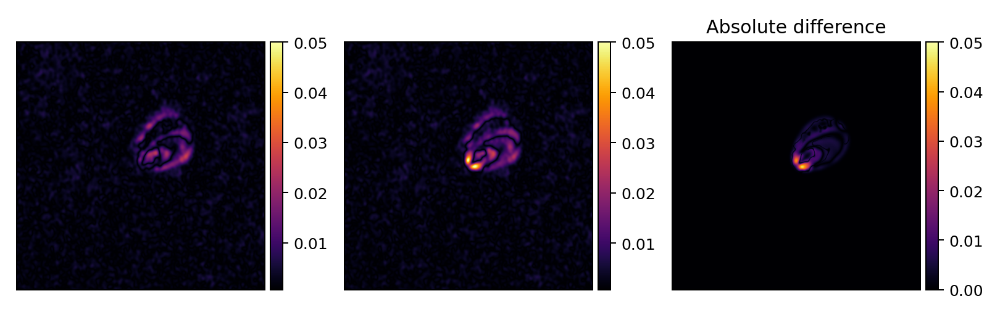

interactive(children=(IntSlider(value=19, description='frame', max=39), Output()), _dom_classes=('widget-inter…

In [19]:
slider_frame_comparison(np.abs(data - images_blurred_nn), np.abs(data - images_blurred), vmax=0.05, cmap='inferno')

In [72]:
%matplotlib notebook
plt.imshow(images_blurred_nn[15])

<IPython.core.display.Javascript object>


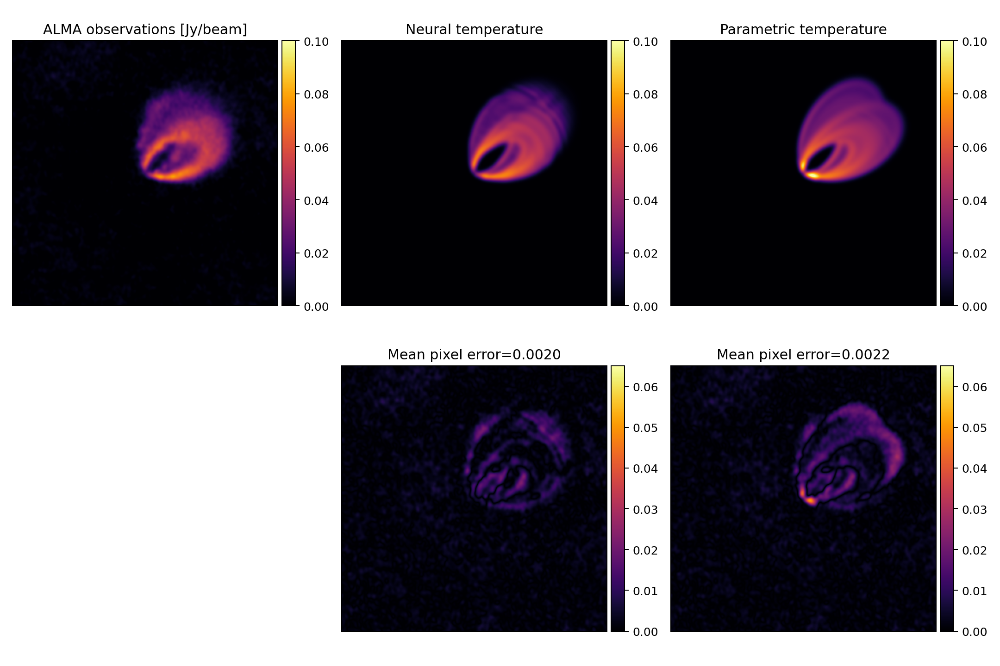

In [20]:
output = checkpoint_dir.joinpath('spectral_cubes_comparison_iter{}.gif'.format(ckpt_iter))

# Save a gif/plot for the data cube for quick visualization
%matplotlib notebook
fig, axes = plt.subplots(2,3,figsize=(12,8))
axes[1,0].axis("off")
axes_list = list(axes[0]) + list(axes[1,1:])

data_fit = np.abs(data - images_blurred).mean()
data_fit_nn = np.abs(data - images_blurred_nn).mean()
titles = [r'ALMA observations [Jy/beam]', 'Neural temperature', 'Parametric temperature',
          r'Mean pixel error={:1.4f}'.format(data_fit_nn), r'Mean pixel error={:1.4f}'.format(data_fit)]
movies = [data, np.array(images_blurred_nn), np.array(images_blurred),
         np.abs(data - images_blurred_nn), np.abs(data - images_blurred)]
visualization.animate_movies_synced(
    movies, axes_list, vmin=[0,0,0,0,0,0], vmax=[0.1,0.1,0.1,0.065,0.065], 
    titles=titles, cmaps='inferno', fps=3, writer='ffmpeg', output=output
)

In [16]:
residual_nn = images_blurred_nn - data
chi2_nn = np.sum(((residual_nn) / 0.007)**2)
reduced_chi2_nn = chi2_nn / images_blurred_nn.size
residual_mean_flaherty = np.mean(np.abs(residual_nn))

residual_mcmc = images_blurred - data
chi2_mcmc = np.sum(((residual_mcmc) / 0.007)**2)
reduced_chi2_mcmc = chi2_mcmc / images_blurred.size
residual_mean_mcmc = np.mean(np.abs(residual_mcmc))

reduced_chi2_nn, reduced_chi2_mcmc

(Array(0.2003255, dtype=float64), Array(0.30255637, dtype=float64))

In [23]:
def plot_data_cube_comparison(data_cube, images_nn, images_mcmc, channel):
    """
    Plots a comparison for a given channel from four image cubes:
      - Row 0: Data, Flaherty image, |Data–Flaherty| residual (with mean abs in title)
      - Row 1: Data, Image‐Domain MCMC image,     |Data–MCMC| residual
      - Row 2: Data, Spectral‐Domain MCMC image, |Data–MCMC+vis| residual
    All panels are square, have no axis ticks/labels, and only the residual titles
    include the mean absolute residual.
    """
    data_slice = data_cube[channel]
    freq_ghz   = freqs[channel] * 1e-9

    rows = [
        ("Spectral-Domain MCMC",  images_mcmc[channel]),
        ("Neural Temperature Field",           images_nn[channel]),
    ]

    fig, ax = plt.subplots(2, 3, figsize=(12, 8))

    for i, (label, model_sl) in enumerate(rows):
        # Common vmin/vmax for data & model
        vmin, vmax = data_slice.min(), data_slice.max()

        # Column 0: Data
        im0 = ax[i, 0].imshow(
            data_slice,
            origin="lower",
            cmap="inferno",
            vmin=vmin,
            vmax=vmax,
            aspect="equal",
        )
        ax[i, 0].set_title(f"Data\n({freq_ghz:.4f} GHz)")
        ax[i, 0].set_xticks([])
        ax[i, 0].set_yticks([])
        plt.colorbar(im0, ax=ax[i, 0], fraction=0.046, pad=0.04)

        # Column 1: Model
        im1 = ax[i, 1].imshow(
            model_sl,
            origin="lower",
            cmap="inferno",
            vmin=vmin,
            vmax=vmax,
            aspect="equal",
        )
        ax[i, 1].set_title(label)
        ax[i, 1].set_xticks([])
        ax[i, 1].set_yticks([])
        plt.colorbar(im1, ax=ax[i, 1], fraction=0.046, pad=0.04)

        # Column 2: Absolute residual
        abs_res = np.abs(data_slice - model_sl)
        mean_abs = abs_res.mean()
        im2 = ax[i, 2].imshow(
            abs_res,
            origin="lower",
            cmap="inferno",
            vmin=0,
            vmax=abs_res.max(),
            aspect="equal",
        )
        ax[i, 2].set_title(f"|Data – {label}|\nmean={mean_abs:.2e}")
        ax[i, 2].set_xticks([])
        ax[i, 2].set_yticks([])
        plt.colorbar(im2, ax=ax[i, 2], fraction=0.046, pad=0.04)

    plt.tight_layout()
    plt.show()

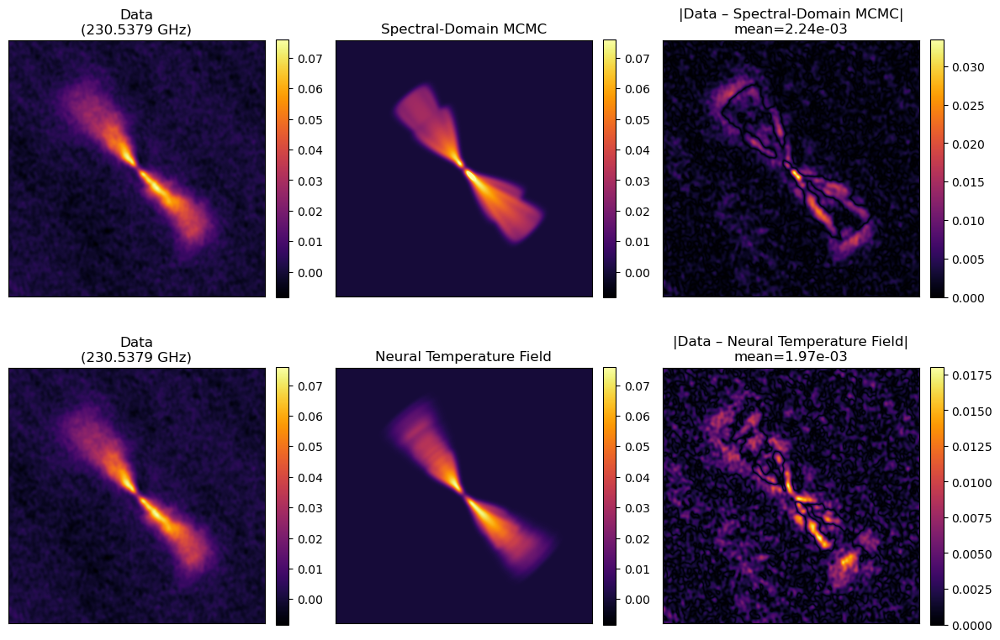

In [30]:
channel = 19
plot_data_cube_comparison(data, images_blurred_nn, images_blurred, channel)

# Uncertainty quantification with Bayes' Rays

In [172]:
from tqdm import trange

# ──────────────────────────────────────────────────────────────────────
# 1.  Lightweight 2‑D deformation lattice
# ──────────────────────────────────────────────────────────────────────
@jax.tree_util.register_pytree_node_class
class Deformation2D:
    def __init__(self, vec_flat, M=None):
        if vec_flat.ndim == 1:                  # flattened input
            assert M is not None, "Need M for a flat vector"
            self.M   = M
            self.vec = vec_flat.reshape(M + 1, M + 1, 2)
        else:                                   # grid input
            self.vec = vec_flat
            self.M   = vec_flat.shape[0] - 1

    # pytree helpers (tells JAX how to treat this object)
    def tree_flatten(self):
        return (self.vec,), None
    @classmethod
    def tree_unflatten(cls, aux, children):
        (vec,) = children
        return cls(vec)

    # bilinear interpolation at arbitrary (z,r) points
    def bilerp(self, z, r, z_max, r_max):
        u = jnp.clip(z / z_max * self.M, 0, self.M - 1e-6)
        v = jnp.clip(r / r_max * self.M, 0, self.M - 1e-6)

        i  = u.astype(jnp.int32)
        j  = v.astype(jnp.int32)
        du = u - i
        dv = v - j

        v00 = self.vec[i    , j    ]        # (N,2)
        v10 = self.vec[i + 1, j    ]
        v01 = self.vec[i    , j + 1]
        v11 = self.vec[i + 1, j + 1]

        # ---------- NEW: widen the weights for broadcasting ----------
        w00 = ((1 - du) * (1 - dv))[..., None]   # (N,1)
        w10 = (du * (1 - dv))[..., None]
        w01 = ((1 - du) * dv)[..., None]
        w11 = (du * dv)[..., None]
        # --------------------------------------------------------------

        return w00 * v00 + w10 * v10 + w01 * v01 + w11 * v11

def new_deform(M, dtype=jnp.float32):
    """Return a zero deformation on an (M+1)×(M+1) lattice."""
    return Deformation2D(jnp.zeros((M+1, M+1, 2), dtype))

# ──────────────────────────────────────────────────────────────────────
# 2.  Temperature prediction *with* deformation
# ──────────────────────────────────────────────────────────────────────
def temperature_with_deform(params, coords, predict_fn, deform,
                            z_max, r_max):
    """
    coords: (...,2)  in AU
    returns: temperature at deformed coords
    """
    δ = deform.bilerp(coords[...,0], coords[...,1], z_max, r_max)
    return predict_fn({'params': params}, coords + δ)

# ──────────────────────────────────────────────────────────────────────
# 3.  Per‑batch Fisher diagonal contribution
# ──────────────────────────────────────────────────────────────────────
@partial(jax.jit, static_argnums=(5,6,7))
def fisher_diag(deform, params, batch_freqs, batch_cube,
                neural_temp, predict_fn, sigma, λ=1e-6):
    """
    Return diag(Fisher) for one mini‑batch
    """
    M = deform.M                      # <- re‑use the known grid size

    def temperature_with_deform(params, coords, predict_fn, deform,
                                z_max, r_max):
        δ = deform.bilerp(coords[...,0], coords[...,1], z_max, r_max)
        variables = params if ('params' in params) else {'params': params}

        return predict_fn(variables, coords + δ)

    def loss_fn(φ_vec):
        _deform = Deformation2D(φ_vec, M=M)
        model   = neural_temp.image_prediction(
            params,
            lambda p, x: temperature_with_deform(
                p, x, predict_fn, _deform,
                hparams['z_max'], hparams['r_max']),
            batch_freqs
        )
        return 0.5 * jnp.sum(((batch_cube - model) / sigma) ** 2) 

    g = jax.grad(loss_fn)(deform.vec)          # ∂ℒ/∂φ
    return jnp.square(g) + 2*λ

# ──────────────────────────────────────────────────────────────────────
# 4.  Accumulate Fisher over many mini‑batches
# ──────────────────────────────────────────────────────────────────────
M          = temperature.shape[0]                      # grid resolution  (change as desired)
N_batches  = 500                      # number of mini‑batches
σ_obs      = hparams['sigma']         # noise level used in training

deform = new_deform(M)
F_diag = jnp.zeros_like(deform.vec)   # running Fisher diagonal

key = jax.random.key(hparams['seed'])
batch_indices = jax.random.randint(key, (hparams['num_iters'], hparams['batchsize']), minval=0, maxval=num_freqs)

rng = np.random.default_rng(0)
batch_idxs = rng.choice(len(batch_indices),
                        size=N_batches, replace=False)

for k in trange(N_batches, desc="Accumulating Fisher"):
    idx = batch_indices[batch_idxs[k]]
    F_diag += fisher_diag(
        deform,
        checkpoint_params,
        jax.device_put(freqs[idx]),
        jax.device_put(data[idx]),
        neural_temp,
        predictor.apply,
        σ_obs
    )

# F_diag /= N_batches  
Σ_diag = 1.0 / F_diag                 # Laplace covariance diagonal
σ_grid  = jnp.sqrt(Σ_diag).block_until_ready()
grid_save_path = checkpoint_dir.joinpath(f'sigma_grid.npy')
grid_save_path
print("Done  ✓  —  σ grid shape:", σ_grid.shape)

# ──────────────────────────────────────────────────────────────────────
# 5.  Visualise the spatial uncertainty map
# ──────────────────────────────────────────────────────────────────────
σ_show = np.array(σ_grid[...,0])       # magnitude   (M+1 × M+1)

plt.figure(figsize=(5,4))
im = plt.imshow(σ_show, origin='lower',
                cmap='inferno')
plt.xlabel('z  [au]')
plt.ylabel('r  [au]')
plt.title('BayesRays uncertainty  σ(T)')
plt.colorbar(im, label='AU?')
plt.tight_layout(); plt.show()

In [360]:
# grid_save_path = checkpoint_dir.joinpath(f'sigma_grid_v1.npy')
# np.save(grid_save_path, σ_grid)

In [341]:
deform.M # 2 channels (r,z), uncertainty at each vertex NOT cells

500

"""
## Propagating coordinate‑space uncertainty into temperature uncertainty

After the BayesRays pass you **do not** get an uncertainty on the temperature
field directly.  
What you obtain is an uncertainty on the **input coordinates**:

$$
\Sigma_{\text{coord}}(r,z)=
\begin{pmatrix}
\sigma_r^{2} & 0\\
0 & \sigma_z^{2}
\end{pmatrix},
$$

i.e. how much each location $(r,z)$ can be “wiggled” without changing the
data‑fit.  
Your trained MLP behaves like a deterministic map

$$
T = f(r, z).
$$

So we must ask:

> *If the inputs $(r,z)$ are uncertain, how uncertain is the output
> $T$*

### First‑order (linear) error propagation  

For a scalar function of **independent** variables the variance is, to first
order,

$$
\sigma_T^{2}
     = \left(\frac{\partial T}{\partial r}\right)^{2}\sigma_r^{2}
     + \left(\frac{\partial T}{\partial z}\right)^{2}\sigma_z^{2}
     + 2\frac{\partial T}{\partial r}\frac{\partial T}{\partial z}\,
       \mathrm{Cov}(r,z).
$$

BayesRays drops the off‑diagonal Hessian blocks, so
$\mathrm{Cov}(r,z) \approx 0$.  
The expression therefore reduces to

$$
\sigma_T^{2} \;\approx\;
(\partial_r T)^2 \,\sigma_r^{2}
\;+\;
(\partial_z T)^2 \,\sigma_z^{2}.
$$

Taking the square‑root yields the **1‑σ temperature error map**

$$
\sigma_T(r,z)
     = \sqrt{
         (\partial_r T)^2 \,\sigma_r^{2}
         +
         (\partial_z T)^2 \,\sigma_z^{2}
       }.
$$

In [171]:
M_plus = σ_grid.shape[0]            # M+1
Nz, Nr = temperature_nn.shape

zoom_factors = (Nz / M_plus, Nr / M_plus, 1)
σ_up = ndi.zoom(np.asarray(σ_grid), zoom_factors, order=1)   # (Nz, Nr, 2)

σ_z = jnp.asarray(σ_up[..., 0])      # σ(δz) in AU,   shape (Nz,Nr)
σ_r = jnp.asarray(σ_up[..., 1])      # σ(δr) in AU

# ------------------------------------------------------------------
# 2.  Compute ∂T/∂z and ∂T/∂r at every grid point with autodiff
# ------------------------------------------------------------------
params_frozen = {'params': checkpoint_params}

@jax.jit
def temp_fn(coord):                  # coord shape (2,)   [z,r] in AU
    return predictor.apply(params_frozen, coord[None, :])[0]   # scalar K

# vectorised gradient
grad_fn = jax.jit(jax.vmap(jax.grad(temp_fn)))

coords_flat = jnp.stack([z_disk.ravel(), r_disk.ravel()], axis=-1)  # (Nz*Nr, 2)
grads_flat  = grad_fn(coords_flat)                                  # (Nz*Nr, 2)
grads       = grads_flat.reshape(Nz, Nr, 2)                         # (Nz,Nr,2)

dT_dz = grads[..., 0]   # K / AU
dT_dr = grads[..., 1]

# ------------------------------------------------------------------
# 3.  Propagate positional covariance → temperature variance
#     σ²_T  =  (∂T/∂z)² σ²_z   +  (∂T/∂r)² σ²_r
# ------------------------------------------------------------------
σT_map = jnp.sqrt((dT_dz**2) * (σ_z**2) + (dT_dr**2) * (σ_r**2))   # Kelvin  (Nz×Nr)

# ------------------------------------------------------------------
# 4.  Plot mean temperature + 1‑σ uncertainty contours
# ------------------------------------------------------------------
z_axis = np.asarray(z_disk[:, 0])     # length Nz
r_axis = np.asarray(r_disk[0,  :])    # length Nr

fig, ax = plt.subplots(figsize=(7, 3.2))

# temperature background
im = ax.imshow(
    np.asarray(temperature_nn),
    origin="lower",
    extent=[r_axis.min(), r_axis.max(), z_axis.min(), z_axis.max()],
    aspect="auto",
    cmap="turbo")

div = make_axes_locatable(ax)
cax = div.append_axes("right", size="3%", pad=0.05)
fig.colorbar(im, cax=cax, label="T  [K]")

# 50‑75‑90 % quantile contours of σ(T)
levels = np.quantile(np.asarray(σT_map), [0.5, 0.75, 0.9])
CS = ax.contour(
    r_axis, z_axis, np.asarray(σT_map),
    levels=levels,
    cmap="inferno_r", linewidths=1.2)
ax.clabel(CS, fmt=lambda v: f"{v:.2f} K", fontsize=9)

ax.set_xlabel("r  [AU]")
ax.set_ylabel("z  [AU]")
ax.set_title("Neural temperature with propagated 1‑σ uncertainty")
plt.tight_layout(); plt.show()

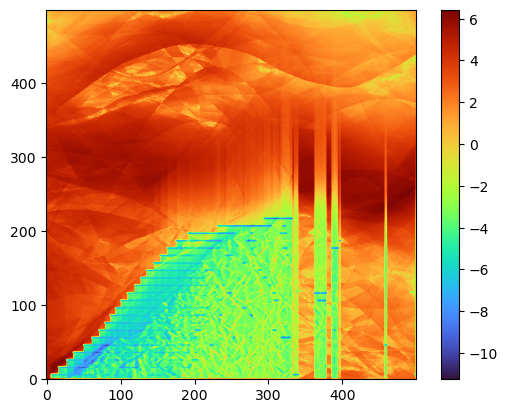

In [335]:
plt.imshow(np.log(σT_map), origin="lower", cmap="turbo")
plt.colorbar()

In [167]:
sigma_grid.shape

(501, 501, 2)

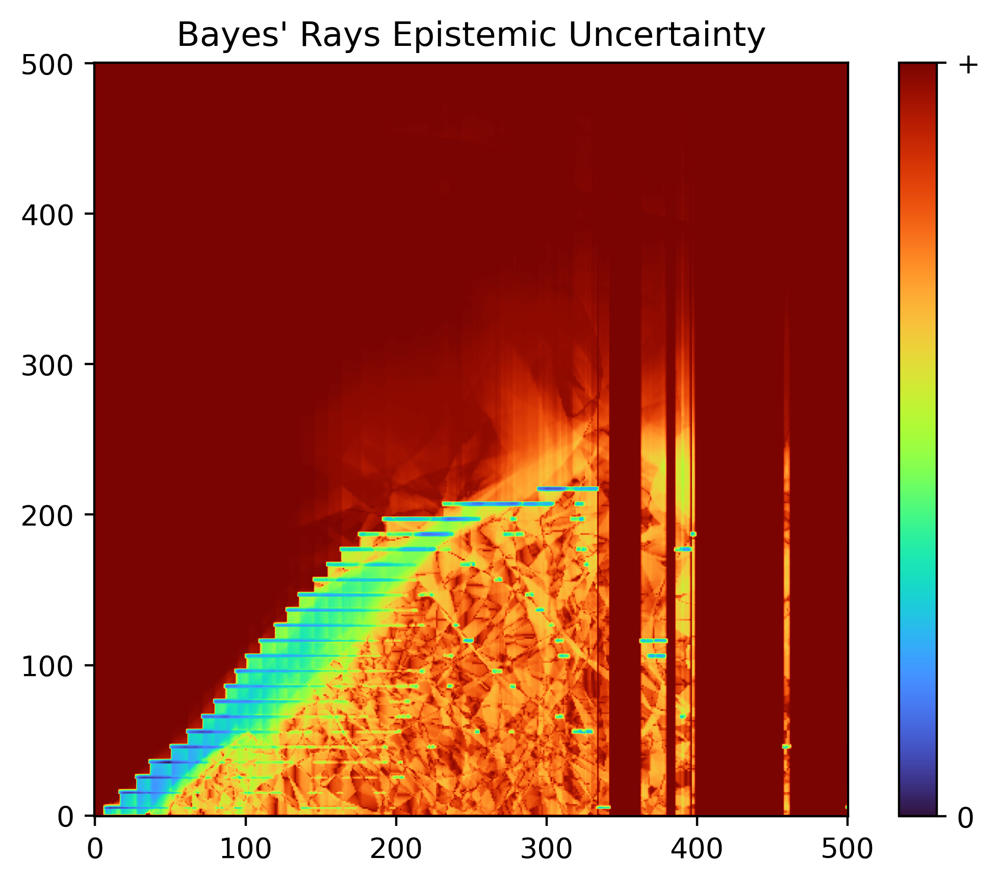

In [170]:
grid_save_path = '/scratch/ondemand28/len/data/radjax/MAPS/recovery_Len/neural_temperature_uncertainty/HD163296_CO(2-1)/Len_uncertainty_SGD_with_full_cube.vlsr_5760ms.no_blur.iso_abundance_1.2025-04-17.08:21:46/sigma_grid_v1.npy'
sigma_grid = np.load(grid_save_path)

sigma_show = np.sqrt(np.square(sigma_grid[:,:,0]) + np.square(sigma_grid[:,:,1]))
log_sigma = np.log(sigma_show)

plt.figure(dpi=400) 

# plot the map
im = plt.imshow(log_sigma, origin="lower", cmap="turbo")

# make a colorbar and only show two ticks: the min (labeled “0”) and the max (labeled “+”)
cb = plt.colorbar(im)
vmin, vmax = log_sigma.min(), log_sigma.max()
cb.set_ticks([vmin, vmax])
cb.set_ticklabels(['0', '+'])

# set the title
plt.title("Bayes' Rays Epistemic Uncertainty")

plt.show()

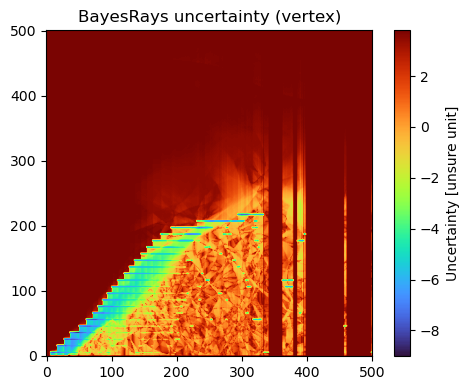

In [344]:
σ_show = np.array(np.sqrt(np.square(σ_grid[...,0]) + np.square(σ_grid[...,1])))       # magnitude   (M+1 × M+1)
# vmin, vmax = np.percentile(σ_show, [1, 99])

plt.figure(figsize=(5,4))
im = plt.imshow(np.log(σ_show), origin='lower',
                cmap='turbo')
plt.title('BayesRays uncertainty (vertex)')
plt.colorbar(im, label='Uncertainty [unsure unit]')
plt.tight_layout(); plt.show()

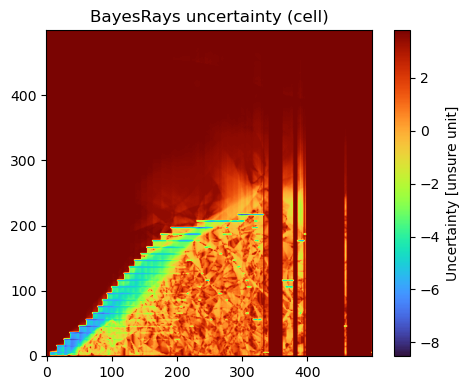

In [342]:
σ_r_vertices = σ_grid[..., 0]                # (Nz+1, Nr+1)
σ_z_vertices = σ_grid[..., 1]

# cell‑centred maps  (Nz, Nr)
σ_r_cell = 0.25 * (
      σ_r_vertices[:-1, :-1]   # bottom‑left
    + σ_r_vertices[1:,  :-1]   # bottom‑right
    + σ_r_vertices[:-1, 1:]    # top‑left
    + σ_r_vertices[1:,  1:]    # top‑right
)

σ_z_cell = 0.25 * (
      σ_z_vertices[:-1, :-1]
    + σ_z_vertices[1:,  :-1]
    + σ_z_vertices[:-1, 1:]
    + σ_z_vertices[1:,  1:]
)

σ_show_cell = np.array(np.sqrt(np.square(σ_r_cell) + np.square(σ_z_cell)))       # magnitude   (M+1 × M+1)
# vmin, vmax = np.percentile(σ_show, [1, 99])

plt.figure(figsize=(5,4))
im = plt.imshow(np.log(σ_show_cell), origin='lower',
                cmap='turbo')
plt.title('BayesRays uncertainty (cell)')
plt.colorbar(im, label='Uncertainty [unsure unit]')
plt.tight_layout(); plt.show()

Using 1% quantile → t_thr = 11.2


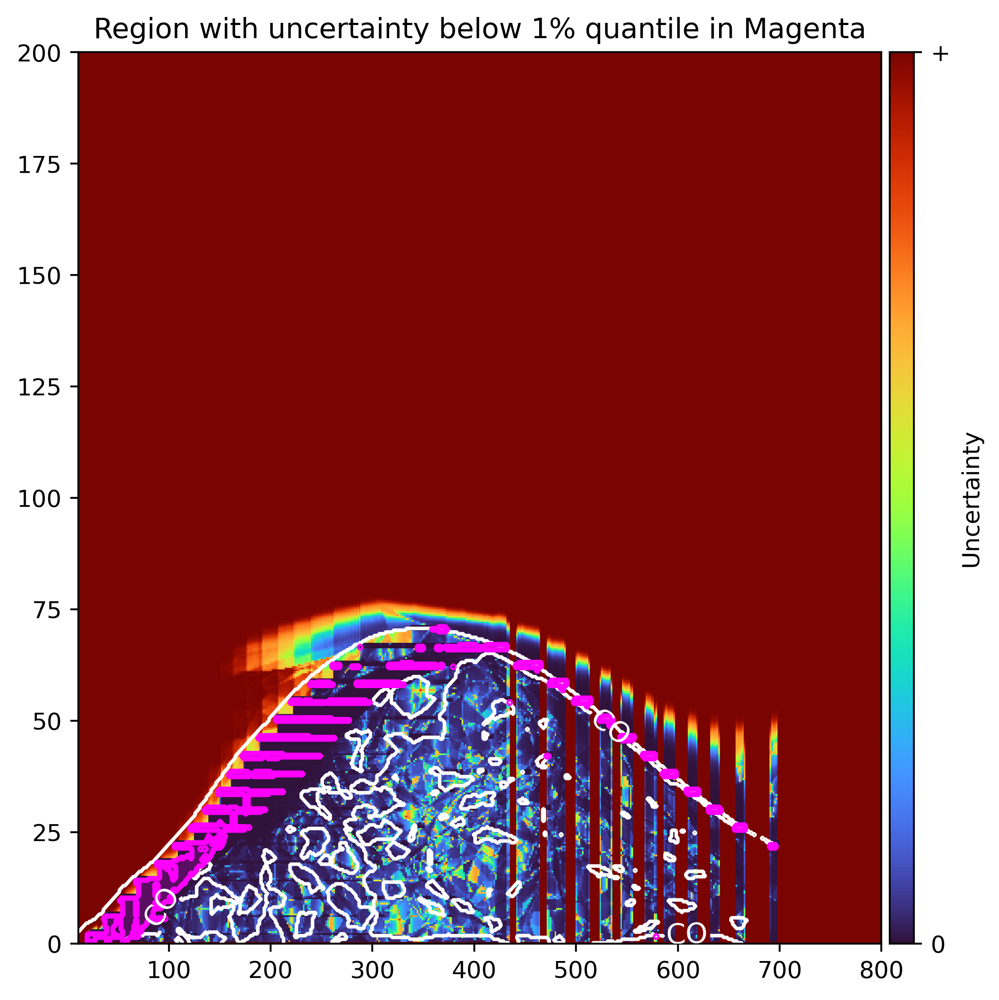

In [291]:

def plot_temperature_with_mask(
        T_map,                 # (Nz, Nr) neural temperature  [K]
        U_map,                 # (Nz, Nr) BayesRays uncertainty (same grid)
        z_axis, r_axis,        # coordinate vectors  (AU)
        t_thr="q90",           # threshold: float   or "qXX" percentile
        cmap_T="turbo",
        mask_edge="magenta",         # outline colour
        mask_fill="magenta",
        mask_alpha=0.2, figsize=(6,6)):
    """
    Overlay the “too‑uncertain” region as a contour patch on top of T_map.
    """
    # ------------------------------------------------------------------
    # determine the threshold value
    if isinstance(t_thr, str) and t_thr.lower().startswith("q"):
        q = float(t_thr[1:]) / 100.0          # e.g. "q90" → 0.90
        t_thr_val = np.quantile(U_map, q)
        print(f"Using {q:.0%} quantile → t_thr = {t_thr_val:.3g}")
    else:
        t_thr_val = float(t_thr)
        print(f"Using absolute threshold t_thr = {t_thr_val:.3g}")

    mask = U_map < t_thr_val                # boolean ‘bad’ pixels
    # ------------------------------------------------------------------
    fig, ax = plt.subplots(figsize=figsize, dpi=400)

    # background: neural temperature
    im = ax.imshow(
        T_map,
        origin="lower",
        extent=[r_axis.min(), r_axis.max(), z_axis.min(), z_axis.max()],
        aspect="auto",
        cmap=cmap_T)
    
#     levels = [19, 50]
#     cp = ax.contour(r_disk, z_disk, T_map, levels, colors='red')
    
    cp = ax.contour(r_disk, z_disk, abundance_co_nn, levels=[disk.co_abundance/2], colors='white')
    ax.clabel(cp, levels=[disk.co_abundance/2], fmt='CO', inline=5, fontsize=12);

    # colour‑bar for temperature
    div = make_axes_locatable(ax)
    cax = div.append_axes("right", size="3%", pad=0.05)
    cb = fig.colorbar(im, cax=cax, label="Uncertainty")
    vmin, vmax = T_map.min(), T_map.max()
    cb.set_ticks([vmin, vmax])
    cb.set_ticklabels(['0', '+'])

    # overlay mask (filled + outline)
    ax.contourf(
        r_axis, z_axis, mask,
        levels=[0.5, 1.5],
        colors=[mask_fill],
        alpha=mask_alpha)
    ax.contour(
        r_axis, z_axis, mask,
        levels=[0.5],
        colors=mask_edge,
        linewidths=2.2)

#     ax.set_xlabel("r  [AU]")
#     ax.set_ylabel("z  [AU]")
    ax.set_title(rf"Region with uncertainty below {q:.0%} quantile in Magenta")
    plt.tight_layout()
    plt.show()

z_axis = np.asarray(z_disk[:, 0])     # length Nz
r_axis = np.asarray(r_disk[0,  :])    # length Nr


# ----------------------------------------------------------------------
# EXAMPLE --------------------------------------------------------------
plot_temperature_with_mask(
    σ_show,    # your neural temp (500×500)
    σ_show[1:,1:],         # uncertainty resized to the same grid
    z_axis, r_axis,    # coordinate axes (length 500 each)
    t_thr="q1")       

In [ ]:
from tqdm import trange

# ──────────────────────────────────────────────────────────────────────
# 1.  Lightweight 2‑D deformation lattice
# ──────────────────────────────────────────────────────────────────────
@jax.tree_util.register_pytree_node_class
class Deformation2D:
    def __init__(self, vec_flat, M=None):
        if vec_flat.ndim == 1:                  # flattened input
            assert M is not None, "Need M for a flat vector"
            self.M   = M
            self.vec = vec_flat.reshape(M + 1, M + 1, 2)
        else:                                   # grid input
            self.vec = vec_flat
            self.M   = vec_flat.shape[0] - 1

    # pytree helpers (tells JAX how to treat this object)
    def tree_flatten(self):
        return (self.vec,), None
    @classmethod
    def tree_unflatten(cls, aux, children):
        (vec,) = children
        return cls(vec)

    # bilinear interpolation at arbitrary (z,r) points
    def bilerp(self, z, r, z_max, r_max):
        u = jnp.clip(z / z_max * self.M, 0, self.M - 1e-6)
        v = jnp.clip(r / r_max * self.M, 0, self.M - 1e-6)

        i  = u.astype(jnp.int32)
        j  = v.astype(jnp.int32)
        du = u - i
        dv = v - j

        v00 = self.vec[i    , j    ]        # (N,2)
        v10 = self.vec[i + 1, j    ]
        v01 = self.vec[i    , j + 1]
        v11 = self.vec[i + 1, j + 1]

        # ---------- NEW: widen the weights for broadcasting ----------
        w00 = ((1 - du) * (1 - dv))[..., None]   # (N,1)
        w10 = (du * (1 - dv))[..., None]
        w01 = ((1 - du) * dv)[..., None]
        w11 = (du * dv)[..., None]
        # --------------------------------------------------------------

        return w00 * v00 + w10 * v10 + w01 * v01 + w11 * v11

def new_deform(M, dtype=jnp.float32):
    """Return a zero deformation on an (M+1)×(M+1) lattice."""
    return Deformation2D(jnp.zeros((M+1, M+1, 2), dtype))

# ──────────────────────────────────────────────────────────────────────
# 2.  Temperature prediction *with* deformation
# ──────────────────────────────────────────────────────────────────────
def temperature_with_deform(params, coords, predict_fn, deform,
                            z_max, r_max):
    """
    coords: (...,2)  in AU
    returns: temperature at deformed coords
    """
    δ = deform.bilerp(coords[...,0], coords[...,1], z_max, r_max)
    return predict_fn({'params': params}, coords + δ)

# ──────────────────────────────────────────────────────────────────────
# 3.  Per‑batch Fisher diagonal contribution
# ──────────────────────────────────────────────────────────────────────
@partial(jax.jit, static_argnums=(5,6,7))
def fisher_diag(deform, params, batch_freqs, batch_cube,
                neural_temp, predict_fn, sigma, λ=1e-6):
    """
    Return diag(Fisher) for one mini‑batch
    """
    M = deform.M                      # <- re‑use the known grid size

    def temperature_with_deform(params, coords, predict_fn, deform,
                                z_max, r_max):
        δ = deform.bilerp(coords[...,0], coords[...,1], z_max, r_max)
        variables = params if ('params' in params) else {'params': params}

        return predict_fn(variables, coords + δ)

    def loss_fn(φ_vec):
        _deform = Deformation2D(φ_vec, M=M)
        model   = neural_temp.image_prediction(
            params,
            lambda p, x: temperature_with_deform(
                p, x, predict_fn, _deform,
                hparams['z_max'], hparams['r_max']),
            batch_freqs
        )
        return 0.5 * jnp.sum(((batch_cube - model) / sigma) ** 2) 

    g = jax.grad(loss_fn)(deform.vec)          # ∂ℒ/∂φ
    return jnp.square(g) + 2*λ

# ──────────────────────────────────────────────────────────────────────
# 4.  Accumulate Fisher over many mini‑batches
# ──────────────────────────────────────────────────────────────────────
M          = temperature.shape[0]                      # grid resolution  (change as desired)
N_batches  = 500                      # number of mini‑batches
σ_obs      = hparams['sigma']         # noise level used in training

deform = new_deform(M)
F_diag = jnp.zeros_like(deform.vec)   # running Fisher diagonal

key = jax.random.key(hparams['seed'])
batch_indices = jax.random.randint(key, (hparams['num_iters'], hparams['batchsize']), minval=0, maxval=num_freqs)

rng = np.random.default_rng(0)
batch_idxs = rng.choice(len(batch_indices),
                        size=N_batches, replace=False)

for k in trange(N_batches, desc="Accumulating Fisher"):
    idx = batch_indices[batch_idxs[k]]
    F_diag += fisher_diag(
        deform,
        checkpoint_params,
        jax.device_put(freqs[idx]),
        jax.device_put(data[idx]),
        neural_temp,
        predictor.apply,
        σ_obs
    )

# F_diag /= N_batches  
Σ_diag = 1.0 / F_diag                 # Laplace covariance diagonal
σ_grid  = jnp.sqrt(Σ_diag).block_until_ready()
print("Done  ✓  —  σ grid shape:", σ_grid.shape)

# ──────────────────────────────────────────────────────────────────────
# 5.  Visualise the spatial uncertainty map
# ──────────────────────────────────────────────────────────────────────
σ_show = np.array(σ_grid[...,0])       # magnitude   (M+1 × M+1)
vmin, vmax = np.percentile(σ_show, [1, 99])

plt.figure(figsize=(5,4))
im = plt.imshow(σ_show.T, origin='lower',
                cmap='inferno', vmin=vmin, vmax=vmax,
                extent=[0, hparams['z_max'], 0, hparams['r_max']])
plt.xlabel('z  [au]')
plt.ylabel('r  [au]')
plt.title('BayesRays uncertainty  σ(T)')
plt.colorbar(im, label='AU?')
plt.tight_layout(); plt.show()

In [1]:
sigma_floor = np.min(sigma_map)   # e.g. 0.01
λ = 1.0/(2 * sigma_floor**2)       # => 1/(2*1e-4)=5000

NameError: name 'np' is not defined

accum Fisher: 100%|█████████████████████████████████| 500/500 [04:30<00:00,  1.85it/s]


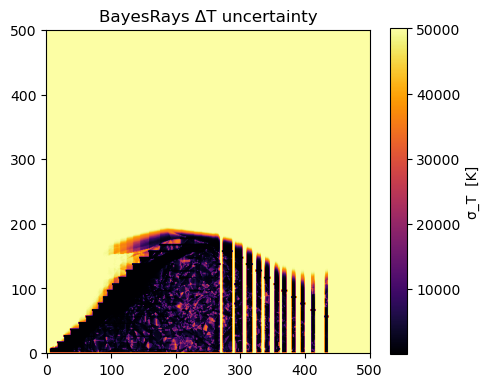

In [173]:
# 0) alias your full datacube / freqs
all_freqs = freqs       # shape (Nf,)
all_obs   = data        # shape (Nf, H, W)
σ_obs     = hparams['sigma']  # scalar noise level (or array of shape matching obs)

mlp_apply = lambda p, coords: predictor.apply({'params': p}, coords)


# 1) Deformation lattice exactly as before
@jax.tree_util.register_pytree_node_class
class Deformation2D:
    def __init__(self, vec_flat, M=None):
        if vec_flat.ndim == 1:
            assert M is not None, "Need M for flat vector"
            self.M   = M
            self.vec = vec_flat.reshape(M+1, M+1, 2)
        else:
            self.vec = vec_flat
            self.M   = vec_flat.shape[0] - 1
    def tree_flatten(self):
        return (self.vec,), None
    @classmethod
    def tree_unflatten(cls, aux, children):
        return cls(children[0])
    def bilerp(self, z, r, z_max, r_max):
        u = jnp.clip(z / z_max * self.M, 0.0, self.M - 1e-6)
        v = jnp.clip(r / r_max * self.M, 0.0, self.M - 1e-6)
        i, j = u.astype(int), v.astype(int)
        du, dv = u - i, v - j
        v00 = self.vec[i    , j    ]
        v10 = self.vec[i + 1, j    ]
        v01 = self.vec[i    , j + 1]
        v11 = self.vec[i + 1, j + 1]
        w00 = ((1-du)*(1-dv))[...,None]
        w10 = (   du*(1-dv))[...,None]
        w01 = ((1-du)*   dv)[...,None]
        w11 = (   du*   dv)[...,None]
        return w00*v00 + w10*v10 + w01*v01 + w11*v11

def new_deform(M, dtype=jnp.float32):
    return Deformation2D(jnp.zeros((M+1, M+1, 2), dtype))

# 2) re‐use your temperature‐with‐deform helper
def temperature_with_deform(params, coords, predict_fn, deform,
                                z_max, r_max):
    δ = deform.bilerp(coords[...,0], coords[...,1], z_max, r_max)
    return predict_fn(params, coords + δ)

# 3) the *only* change to your toy fisher_diag: we now call
#    render_with_deform → neural_temp.image_prediction
def render_with_deform(params, freqs_batch, deform):
    # build a little temp_fn that captures `deform`
    def temp_fn(p, coords):
        return temperature_with_deform(
            p, coords, predictor.apply, deform,
            hparams['z_max'], hparams['r_max']
        )
    # this runs the full RT: returns (B_freq, H, W)
    return neural_temp.image_prediction(params, temp_fn, freqs_batch)

@partial(jax.jit, static_argnums=(5,6,7,8))
def fisher_diag(deform, params,
                bf,   # (Bf,)  batch of frequencies
                bo,   # (Bf,H,W) batch of observed sub‐cubes
                sigma,          # scalar ‑ or shape (Bf,H,W)
                predict_fn,     # predictor.apply
                z_max, r_max,
                λ=1e-6):
    M = deform.M
    def loss_on_phi(phi_flat):
        _d = Deformation2D(phi_flat, M=M)
        pred = render_with_deform(params, bf, _d)     # (Bf,H,W)
        return 0.5 * jnp.sum(((bo - pred) / sigma)**2)
    g = jax.grad(loss_on_phi)(deform.vec)             # → (M+1, M+1, 2)
    return jnp.square(g) + 2*λ

# 4) accumulate exactly like your toy code
M        = temperature.shape[0]      # grid‐resolution
deform   = new_deform(M)
F_diag   = jnp.zeros_like(deform.vec)
key      = jax.random.PRNGKey(hparams['seed'])
N_b      = 500
Bf       = 5                        # << pick smaller so RT fits in memory

for _ in trange(N_b, desc="accum Fisher"):
    key, sub = jax.random.split(key)
    idx      = jax.random.choice(sub, all_freqs.shape[0], (Bf,), replace=False)
    bf       = all_freqs[idx]
    bo       = all_obs  [idx]
    F_diag  += fisher_diag(
        deform,
        checkpoint_params,
        bf, bo,
        σ_obs,
        mlp_apply,
        hparams['z_max'], hparams['r_max'],
        1e-4 / (M**2)
    )
# optional: normalize by #batches
F_diag /= N_b

# 5) Laplace covariance & σ‐grid
Σ_diag = 1.0 / F_diag
σ_grid  = jnp.sqrt(Σ_diag)           # shape (M+1,M+1,2)

# visualize the *magnitude* of the 2‐D deformation uncertainty  
σ_show = jnp.linalg.norm(σ_grid, axis=-1)  # (M+1,M+1)
import matplotlib.pyplot as plt
plt.figure(figsize=(5,4))
plt.imshow(np.array(σ_show), origin='lower', cmap='inferno')
plt.colorbar(label='σ_T  [K]')
plt.title("BayesRays ΔT uncertainty")
plt.tight_layout()

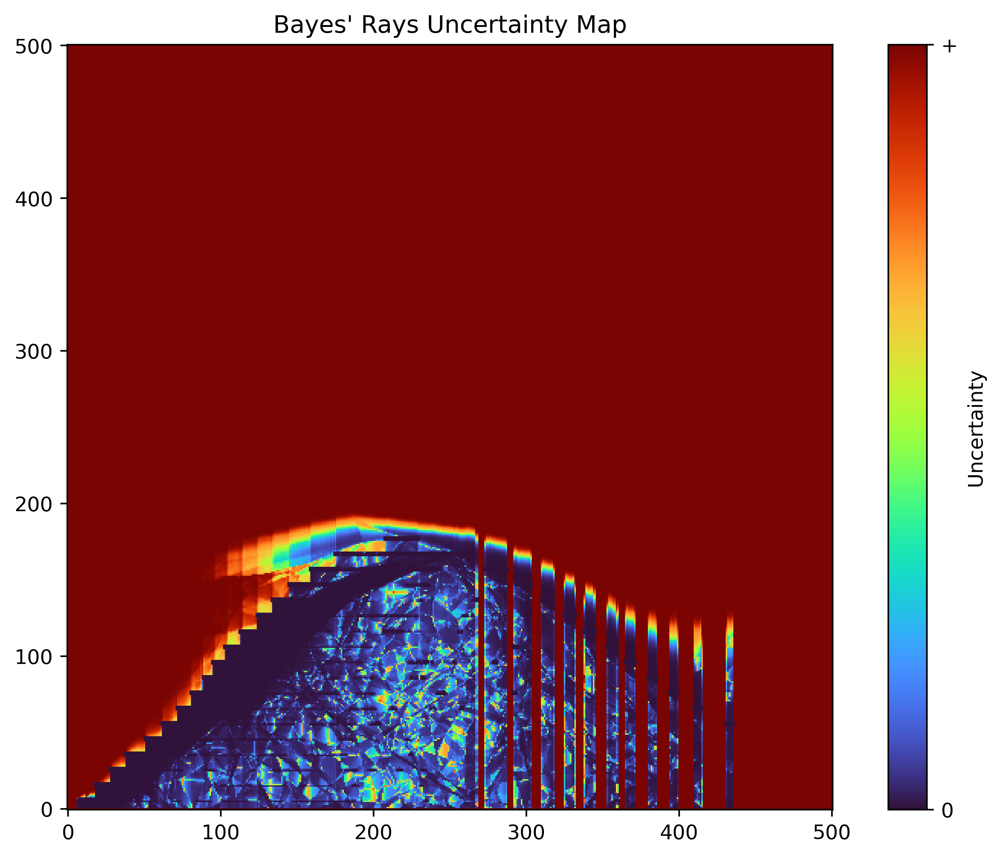

In [212]:
plt.figure(figsize=(8,6),dpi=400)
plt.title("Bayes' Rays Epistemic Uncertainty")
im = plt.imshow(np.array(σ_show), origin='lower', cmap='turbo')
cb = plt.colorbar(im, label='Uncertainty')
vmin, vmax = σ_show.min(), σ_show.max()
cb.set_ticks([vmin, vmax])
cb.set_ticklabels(['0', '+'])
plt.title("Bayes' Rays Uncertainty Map")
plt.tight_layout()